In [3]:
# DEEP DIAGNOSTIC - Find where images are actually located
import os
from pathlib import Path

base_path = Path('/kaggle/input/datasets/bhagawati4204/daataasets/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification')

print(f"🔍 DEEP DIAGNOSTIC - Finding all images")
print(f"📂 Base path: {base_path}")
print("="*70)

if not base_path.exists():
    print("❌ Path does not exist!")
else:
    # Walk through ALL directories and find images
    total_images = 0
    image_found = False
    
    for root, dirs, files in os.walk(base_path):
        # Find image files
        image_files = [f for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'))]
        
        if image_files:
            image_found = True
            total_images += len(image_files)
            level = root.replace(str(base_path), '').count(os.sep)
            indent = '  ' * level
            folder_name = os.path.basename(root)
            
            print(f"{indent}📁 {folder_name}/ - {len(image_files)} images")
            # Show first 3 images
            for img in image_files[:3]:
                print(f"{indent}  🖼️ {img}")
            if len(image_files) > 3:
                print(f"{indent}  ... and {len(image_files)-3} more")
    
    if not image_found:
        print("❌ No images found anywhere!")
        print("\n📂 Full directory structure:")
        for root, dirs, files in os.walk(base_path):
            level = root.replace(str(base_path), '').count(os.sep)
            indent = '  ' * level
            print(f"{indent}📁 {os.path.basename(root)}/")
            # Show subdirectories
            for d in dirs[:5]:
                print(f"{indent}  📁 {d}/")
            if files:
                print(f"{indent}  📄 {files[0]} (sample file)")
    else:
        print(f"\n✅ Found {total_images} total images")
        print(f"📊 Images are located in subdirectories")

🔍 DEEP DIAGNOSTIC - Finding all images
📂 Base path: /kaggle/input/datasets/bhagawati4204/daataasets/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification
      📁 Non_fractured/ - 492 images
        🖼️ 19-rotated3-rotated2.jpg
        🖼️ IMG0004347.jpg
        🖼️ 26-rotated2-rotated2-rotated2.jpg
        ... and 489 more
      📁 fractured/ - 334 images
        🖼️ 81-rotated1-rotated3-rotated2.jpg
        🖼️ 0013.png
        🖼️ 86-rotated2-rotated2.jpg
        ... and 331 more
      📁 Non_fractured/ - 268 images
        🖼️ IMG0004347.jpg
        🖼️ 0013.png
        🖼️ 12-rotated3.jpg
        ... and 265 more
      📁 fractured/ - 238 images
        🖼️ 7-rotated1-rotated2-rotated1 - Copy.jpg
        🖼️ 91-rotated2-rotated1-rotated3.jpg
        🖼️ 0013.png
        ... and 235 more
      📁 Non_fractured/ - 4640 images
        🖼️ 2-rotated3-rotated3-rotated2-rotated1 (2).jpg
        🖼️ 35-rotated2-rotated2.jpg
        🖼️ 70-rotated2-rotate

In [4]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  COMPLETE FIXED EVALUATION - ALL 7 DATASETS                                   ║
# ║  Base path: /kaggle/input/datasets/bhagawati4204/daataasets/                  ║
# ║  Brain Tumor: 70% Train / 30% Test (NO VALIDATION)                            ║
# ║  Other Datasets: Original splits preserved                                    ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

!pip install -q timm einops albumentations opencv-python-headless

import os, time, random, copy, warnings
from pathlib import Path
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageFile
import cv2
from tqdm.auto import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
from torch.cuda.amp import autocast
import albumentations as A
from albumentations.pytorch import ToTensorV2
from einops import rearrange
from sklearn.metrics import *
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
MEAN, STD = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  DATASET CONFIGURATIONS WITH CORRECT PATHS AND CLASS ORDERS                   ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

BASE_PATH = '/kaggle/input/datasets/bhagawati4204/daataasets'

DATASET_CONFIGS = {
    'brain_tumor': {
        'name': 'Brain Tumor MRI',
        'class_names': ['notumor', 'glioma', 'meningioma', 'pituitary'],
        'task': 'multi_class',
        'is_grayscale': True,
        'path': f'{BASE_PATH}/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset',
        'use_train_test_split': True  # ✅ Use 70/30 train/test split
    },
    'fracatlas': {
        'name': 'FracAtlas',
        'class_names': ['Not Fractured', 'Fractured'],
        'task': 'binary',
        'is_grayscale': True,
        'path': f'{BASE_PATH}/Fracture Dataset/Fracture Dataset/FracAtlas/images',
        'use_train_test_split': False
    },
    'tb_chest': {
        'name': 'TB Chest X-Ray',
        'class_names': ['Normal', 'Tuberculosis'],
        'task': 'binary',
        'is_grayscale': True,
        'path': f'{BASE_PATH}/Tuberculosis (TB) Chest X-ray Database/Tuberculosis (TB) Chest X-ray Database/TB_Chest_Radiography_Database',
        'use_train_test_split': False
    },
    'pneumonia': {
        'name': 'Pneumonia Chest X-Ray',
        'class_names': ['Normal', 'Pneumonia'],
        'task': 'binary',
        'is_grayscale': True,
        'path': f'{BASE_PATH}/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray',
        'use_train_test_split': False
    },
    'diabetic_retinopathy': {
        'name': 'Diabetic Retinopathy',
        'class_names': ['No_DR', 'Mild', 'Moderate', 'Severe', 'Proliferate_DR'],
        'task': 'multi_class',
        'is_grayscale': False,
        'path': f'{BASE_PATH}/Diabetic Retinopathy 224x224 (2019 Data)/Diabetic Retinopathy 224x224 (2019 Data)/colored_images',
        'use_train_test_split': False
    },
    'bone_fracture': {
        'name': 'Bone Fracture Binary',
        'class_names': ['Not Fractured', 'Fractured'],
        'task': 'binary',
        'is_grayscale': True,
        'path': f'{BASE_PATH}/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification',
        'use_train_test_split': False
    },

    'ham10000': {
        'name': 'HAM10000 Skin Cancer',
        'class_names': ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc'],
        'task': 'multi_class',
        'is_grayscale': False,
        'path': f'{BASE_PATH}/skin cancer/skin cancer',
        'use_train_test_split': False
    }
}

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  MODEL ARCHITECTURE (EXACT MATCH TO TRAINING)                                  ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

class DropPath(nn.Module):
    def __init__(self, drop_prob=0.0): 
        super().__init__(); self.drop_prob = drop_prob
    def forward(self, x):
        if self.drop_prob == 0.0 or not self.training: return x
        return x * (torch.rand((x.shape[0], 1, 1), dtype=torch.float32, device=x.device) * float(1.0 - self.drop_prob))

class WindowAttention(nn.Module):
    def __init__(self, d_model, nhead, window_size=7, dropout=0.1):
        super().__init__()
        self.nhead, self.window_size, self.head_dim = nhead, window_size, d_model // nhead
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(d_model, d_model * 3)
        self.proj = nn.Linear(d_model, d_model)
        self.attn_drop, self.proj_drop, self.attn_weights = nn.Dropout(dropout), nn.Dropout(dropout), None
        
    def forward(self, x, H, W):
        B, N, C = x.shape
        x = x.reshape(B, H, W, C)
        pad_h, pad_w = (self.window_size - H % self.window_size) % self.window_size, (self.window_size - W % self.window_size) % self.window_size
        if pad_h > 0 or pad_w > 0:
            x = F.pad(x, (0, 0, 0, pad_w, 0, pad_h))
        Hp, Wp = x.shape[1], x.shape[2]
        x = x.reshape(B, Hp//self.window_size, self.window_size, Wp//self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(-1, self.window_size**2, C)
        qkv = self.qkv(x).reshape(-1, self.window_size**2, 3, self.nhead, self.head_dim).permute(2,0,3,1,4)
        attn = (qkv[0] @ qkv[1].transpose(-2,-1)) * self.scale
        attn = attn.softmax(dim=-1)
        self.attn_weights = attn.detach()
        x = self.proj_drop(self.proj((self.attn_drop(attn) @ qkv[2]).transpose(1,2).reshape(-1, self.window_size**2, C)))
        x = x.reshape(B, Hp//self.window_size, Wp//self.window_size, self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(B, Hp, Wp, C)
        return x[:, :H, :W, :].reshape(B, -1, C) if pad_h > 0 or pad_w > 0 else x.reshape(B, -1, C)

class TransformerBlockWithWindow(nn.Module):
    def __init__(self, d_model, nhead, ffn_dim, window_size=7, attn_drop=0.1, ffn_drop=0.1, drop_path=0.0):
        super().__init__()
        self.norm1, self.norm2 = nn.LayerNorm(d_model), nn.LayerNorm(d_model)
        self.global_attn = nn.MultiheadAttention(d_model, nhead, dropout=attn_drop, batch_first=True)
        self.window_attn = WindowAttention(d_model, nhead, window_size, attn_drop)
        self.gate = nn.Sequential(nn.Linear(d_model*2, d_model), nn.Sigmoid())
        self.ffn = nn.Sequential(
            nn.Linear(d_model, ffn_dim), nn.GELU(), nn.Dropout(ffn_drop),
            nn.Linear(ffn_dim, d_model), nn.Dropout(ffn_drop)
        )
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.attn_weights, self.window_attn_weights = None, None
        
    def forward(self, x, H, W):
        x_norm = self.norm1(x)
        global_out, global_attn = self.global_attn(x_norm, x_norm, x_norm, need_weights=True)
        self.attn_weights = global_attn.detach()
        window_out = self.window_attn(x_norm[:, 1:, :], H, W)
        self.window_attn_weights = self.window_attn.attn_weights
        gate = self.gate(torch.cat([global_out[:, 1:, :], window_out], dim=-1))
        combined = torch.cat([global_out[:, :1, :], gate * global_out[:, 1:, :] + (1-gate) * window_out], dim=1)
        x = x + self.drop_path(combined)
        return x + self.drop_path(self.ffn(self.norm2(x)))

class ImprovedBackbone(nn.Module):
    def __init__(self): 
        super().__init__(); 
        self.backbone = models.convnext_base(weights=None)
        self.feature_extractor = self.backbone.features
    def forward(self, x): return self.feature_extractor(x)

class EnhancedHViT(nn.Module):
    def __init__(self, num_classes=2, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536):
        super().__init__()
        self.d_model = d_model
        self.img_size = img_size
        self.backbone = ImprovedBackbone()
        with torch.no_grad():
            _, c, h, w = self.backbone(torch.zeros(1, 3, img_size, img_size)).shape
        self.spatial_h, self.spatial_w = h, w
        self.proj = nn.Sequential(
            nn.Conv2d(c, d_model, 1, bias=False), nn.BatchNorm2d(d_model), nn.GELU(),
            nn.Conv2d(d_model, d_model, 3, padding=1, bias=False), nn.BatchNorm2d(d_model), nn.GELU()
        )
        self.norm_proj = nn.LayerNorm(d_model)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, h*w + 1, d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        dpr = [x.item() for x in torch.linspace(0, 0.15, n_layers)]
        self.encoder = nn.ModuleList([
            TransformerBlockWithWindow(d_model, nhead, dim_ffn, min(7, h, w), drop_path=dpr[i])
            for i in range(n_layers)
        ])
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Linear(d_model, d_model//2), nn.GELU(), nn.Dropout(0.3),
            nn.Linear(d_model//2, d_model//4), nn.GELU(), nn.Dropout(0.15),
            nn.Linear(d_model//4, num_classes)
        )
        
    def forward(self, x):
        B = x.size(0)
        tokens = rearrange(self.proj(self.backbone(x)), 'b d h w -> b (h w) d')
        tokens = self.norm_proj(tokens)
        tokens = torch.cat([self.cls_token.expand(B,-1,-1), tokens], dim=1) + self.pos_embed
        for block in self.encoder:
            tokens = block(tokens, self.spatial_h, self.spatial_w)
        return self.head(self.norm(tokens)[:, 0])
    
    def get_attentions(self):
        g, w = [], []
        for b in self.encoder:
            if b.attn_weights is not None: g.append(b.attn_weights)
            if b.window_attn_weights is not None: w.append(b.window_attn_weights)
        return g, w

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  DATASET CLASS                                                                  ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

class MedicalDataset(Dataset):
    def __init__(self, samples, class_names, transform=None, is_grayscale=False):
        self.samples = samples
        self.class_names = class_names
        self.class_to_idx = {n: i for i, n in enumerate(class_names)}
        self.transform = transform
        self.is_grayscale = is_grayscale
        
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        p, l = self.samples[idx]
        l = self.class_to_idx[l]
        
        try:
            if self.is_grayscale:
                img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
                if img is None:
                    img = np.array(Image.open(p).convert('L'))
                img = np.stack([img, img, img], axis=-1)
            else:
                img = cv2.imread(p)
                if img is None:
                    img = np.array(Image.open(p).convert('RGB'))
                else:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        except:
            img = np.zeros((224, 224, 3), dtype=np.uint8)
        
        if self.transform:
            img = self.transform(image=img)['image']
        
        return img.float(), l, p

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  LOAD SAMPLES FUNCTION                                                          ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def load_all_samples(dataset_name, config):
    """Load all samples for a dataset"""
    samples = []
    class_names = config['class_names']
    base_path = Path(config['path'])
    
    if not base_path.exists():
        print(f"⚠️ Path not found: {base_path}")
        return samples
    
    print(f"✅ Found path: {base_path}")
    
    # ==================== BRAIN TUMOR ====================
    if dataset_name == 'brain_tumor':
        for split in ['Training', 'Testing']:
            split_path = base_path / split
            if not split_path.exists():
                split_path = base_path / split.lower()
            if not split_path.exists():
                continue
            print(f"   Loading from: {split_path}")
            for class_dir in split_path.iterdir():
                if not class_dir.is_dir():
                    continue
                dir_name = class_dir.name.lower().replace('_', '')
                matched_class = None
                for cls in class_names:
                    if cls in dir_name or dir_name in cls:
                        matched_class = cls
                        break
                if matched_class is None:
                    continue
                count = 0
                for ext in ['.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG']:
                    for p in class_dir.rglob(f'*{ext}'):
                        samples.append((str(p), matched_class))
                        count += 1
                print(f"   {matched_class}: {count} images")
        return samples
    
    # ==================== FRACATLAS ====================
    elif dataset_name == 'fracatlas':
        print("   Scanning for FracAtlas images...")
        image_extensions = {'.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG', '.bmp', '.tiff'}
        
        class_folders = {}
        for item in base_path.iterdir():
            if item.is_dir():
                name_lower = item.name.lower()
                print(f"   Found folder: {item.name}")
                if 'fractured' in name_lower and 'not' not in name_lower and 'non' not in name_lower:
                    class_folders['Fractured'] = item
                elif 'not' in name_lower or 'non_fractured' in name_lower or 'normal' in name_lower or 'healthy' in name_lower:
                    class_folders['Not Fractured'] = item
        
        if class_folders:
            print(f"   Found class folders: {list(class_folders.keys())}")
            for class_name, folder_path in class_folders.items():
                count = 0
                for ext in image_extensions:
                    for img_path in folder_path.rglob(f'*{ext}'):
                        samples.append((str(img_path), class_name))
                        count += 1
                print(f"   {class_name}: {count} images")
        
        if not samples:
            print("   No class folders found, inferring from path...")
            for root, dirs, files in os.walk(base_path):
                current_dir = os.path.basename(root).lower()
                if 'fractured' in current_dir and 'not' not in current_dir and 'non' not in current_dir:
                    class_name = 'Fractured'
                elif 'not' in current_dir or 'non_fractured' in current_dir or 'normal' in current_dir or 'healthy' in current_dir:
                    class_name = 'Not Fractured'
                else:
                    class_name = None
                    path_parts = Path(root).parts
                    for part in reversed(path_parts):
                        part_lower = part.lower()
                        if 'fractured' in part_lower and 'not' not in part_lower and 'non' not in part_lower:
                            class_name = 'Fractured'
                            break
                        elif 'not' in part_lower or 'non_fractured' in part_lower or 'normal' in part_lower or 'healthy' in part_lower:
                            class_name = 'Not Fractured'
                            break
                
                if class_name is None:
                    continue
                
                for file in files:
                    if any(file.endswith(ext) for ext in image_extensions):
                        samples.append((os.path.join(root, file), class_name))
        
        if samples:
            print(f"   ✅ Loaded {len(samples)} FracAtlas images")
            class_counts = Counter([s[1] for s in samples])
            for cls, count in class_counts.items():
                print(f"   {cls}: {count}")
        return samples
    
    # ==================== BONE FRACTURE - COMPLETELY FIXED ====================
    elif dataset_name == 'bone_fracture':
        print("   Scanning for Bone Fracture images...")
        image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}
        
        # First, check if there are direct class folders
        class_folders = {}
        for item in base_path.iterdir():
            if item.is_dir():
                folder_name = item.name
                folder_lower = folder_name.lower()
                print(f"   Found folder: {folder_name}")
                
                # Check if this is a class folder
                if 'non_fractured' in folder_lower or 'nonfractured' in folder_lower:
                    class_folders['Not Fractured'] = item
                elif 'fractured' in folder_lower:
                    class_folders['Fractured'] = item
        
        # Load images from class folders
        if class_folders:
            print(f"\n   Found class folders: {list(class_folders.keys())}")
            for class_name, folder_path in class_folders.items():
                count = 0
                for ext in image_extensions:
                    for img_path in folder_path.rglob(f'*{ext}'):
                        samples.append((str(img_path), class_name))
                        count += 1
                print(f"   {class_name}: {count} images")
        else:
            print("   ⚠️ No direct class folders found!")
            print("   Checking for train/val/test splits...")
            
            # Fallback: Check train/val/test splits
            for split_name in ['train', 'val', 'test']:
                split_path = base_path / split_name
                if not split_path.exists():
                    continue
                
                print(f"   Found split: {split_name}")
                for class_dir in split_path.iterdir():
                    if not class_dir.is_dir():
                        continue
                    
                    folder_name = class_dir.name
                    folder_lower = folder_name.lower()
                    
                    if 'non_fractured' in folder_lower or 'nonfractured' in folder_lower:
                        cname = 'Not Fractured'
                    elif 'fractured' in folder_lower:
                        cname = 'Fractured'
                    else:
                        continue
                    
                    count = 0
                    for ext in image_extensions:
                        for img_path in class_dir.rglob(f'*{ext}'):
                            samples.append((str(img_path), cname))
                            count += 1
                    print(f"      {split_name}/{cname}: {count} images")
        
        # If still no samples, try to find any images and infer class from path
        if not samples:
            print("\n   Scanning all directories for images...")
            for ext in image_extensions:
                for img_path in base_path.rglob(f'*{ext}'):
                    # Try to determine class from path
                    path_str = str(img_path).lower()
                    if 'non_fractured' in path_str or 'nonfractured' in path_str:
                        samples.append((str(img_path), 'Not Fractured'))
                    elif 'fractured' in path_str:
                        samples.append((str(img_path), 'Fractured'))
                    else:
                        # Check parent folder
                        parent = img_path.parent.name.lower()
                        if 'non_fractured' in parent or 'nonfractured' in parent:
                            samples.append((str(img_path), 'Not Fractured'))
                        elif 'fractured' in parent:
                            samples.append((str(img_path), 'Fractured'))
                        else:
                            # Default based on containing folder
                            if 'fracture' in path_str:
                                samples.append((str(img_path), 'Fractured'))
                            else:
                                samples.append((str(img_path), 'Not Fractured'))
        
        # Summary
        if samples:
            print(f"\n   ✅ Loaded {len(samples)} Bone Fracture images")
            class_counts = Counter([s[1] for s in samples])
            for cls, count in class_counts.items():
                print(f"   {cls}: {count}")
            
            # Show sample paths for verification
            print("\n   📸 Sample paths:")
            for img_path, cls in samples[:5]:
                print(f"      {cls}: {Path(img_path).name}")
        else:
            print(f"\n   ❌ No images found!")
        
        return samples
    
    # ==================== TB CHEST ====================
    elif dataset_name == 'tb_chest':
        for folder in base_path.iterdir():
            if folder.is_dir():
                fn = folder.name.lower()
                if 'tb_normal' in fn:
                    cname = 'Normal'
                elif 'tb' in fn or 'tuberculosis' in fn:
                    cname = 'Tuberculosis'
                else:
                    continue
                count = 0
                for ext in ['.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG']:
                    for p in folder.rglob(f'*{ext}'):
                        samples.append((str(p), cname))
                        count += 1
                print(f"   {cname}: {count} images")
    
    # ==================== PNEUMONIA ====================
    elif dataset_name == 'pneumonia':
        for split in ['train', 'test', 'val']:
            split_path = base_path / split
            if not split_path.exists():
                continue
            print(f"   Loading from: {split_path}")
            for folder in split_path.iterdir():
                if folder.is_dir():
                    fn = folder.name.lower()
                    if 'normal_pneumonia' in fn:
                        cname = 'Normal'
                    elif 'pneumonia' in fn:
                        cname = 'Pneumonia'
                    else:
                        continue
                    count = 0
                    for ext in ['.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG']:
                        for p in folder.glob(f'*{ext}'):
                            samples.append((str(p), cname))
                            count += 1
                    print(f"   {cname}: {count} images")
    
    # ==================== DIABETIC RETINOPATHY ====================
    elif dataset_name == 'diabetic_retinopathy':
        folder_to_class = {
            '0': 'No_DR', '1': 'Mild', '2': 'Moderate', '3': 'Severe', '4': 'Proliferate_DR',
            'No_DR': 'No_DR', 'Mild': 'Mild', 'Moderate': 'Moderate',
            'Severe': 'Severe', 'Proliferate_DR': 'Proliferate_DR'
        }
        for folder in base_path.iterdir():
            if folder.is_dir():
                folder_name = folder.name.strip()
                cname = folder_to_class.get(folder_name, None)
                if cname is None:
                    for key in folder_to_class:
                        if key in folder_name:
                            cname = folder_to_class[key]
                            break
                if cname is None:
                    continue
                count = 0
                for ext in ['.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG']:
                    for p in folder.glob(f'*{ext}'):
                        samples.append((str(p), cname))
                        count += 1
                print(f"   {cname}: {count} images")
    
    # ==================== HAM10000 ====================
    elif dataset_name == 'ham10000':
        metadata_file = None
        for csv_file in base_path.glob('*.csv'):
            if 'metadata' in csv_file.name.lower() or 'HAM10000_metadata' in csv_file.name:
                metadata_file = csv_file
                break
        
        if metadata_file:
            df = pd.read_csv(metadata_file)
            img_paths = {}
            for ext in ['.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG']:
                for p in base_path.rglob(f'*{ext}'):
                    img_paths[p.stem] = str(p)
            for _, row in df.iterrows():
                img_id = row['image_id'] if 'image_id' in row else row.get('ImageID', '')
                label = row['dx'] if 'dx' in row else row.get('label', '')
                if img_id in img_paths and label in class_names:
                    samples.append((img_paths[img_id], label))
            print(f"   Loaded {len(samples)} images from metadata")
        else:
            print(f"⚠️ No metadata file found for HAM10000")
    
    if samples:
        print(f"✅ Total: {len(samples)} samples for {dataset_name}")
        class_counts = Counter([s[1] for s in samples])
        for cls, count in class_counts.items():
            print(f"   {cls}: {count}")
    else:
        print(f"⚠️ No samples loaded for {dataset_name}")
    
    return samples

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  GET TEST SPLIT - BRAIN TUMOR USES 70/30, OTHERS USE ORIGINAL                  ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def get_test_split(dataset_name, samples, class_names):
    """Get test split - Brain Tumor uses 70/30, others use original 70/15/15"""
    
    if len(samples) == 0:
        return []
    
    # ✅ BRAIN TUMOR: 70% Train / 30% Test (NO VALIDATION)
    if dataset_name == 'brain_tumor':
        labels = [class_names.index(l) for _, l in samples]
        train_s, test_s = train_test_split(
            samples, 
            test_size=0.3, 
            stratify=labels, 
            random_state=SEED
        )
        print(f"   Train: {len(train_s)}, Test: {len(test_s)}")
        return test_s
    
    # ✅ OTHER DATASETS: Original 70/15/15 split
    else:
        labels = [class_names.index(l) for _, l in samples]
        train_s, temp_s = train_test_split(samples, test_size=0.3, stratify=labels, random_state=SEED)
        temp_labels = [class_names.index(l) for _, l in temp_s]
        val_s, test_s = train_test_split(temp_s, test_size=0.5, stratify=temp_labels, random_state=SEED)
        print(f"   Train: {len(train_s)}, Val: {len(val_s)}, Test: {len(test_s)}")
        return test_s

def load_dataset_with_exact_split(dataset_name, config):
    """Load test set with appropriate split"""
    print(f"\n📂 Loading {dataset_name}...")
    samples = load_all_samples(dataset_name, config)
    if not samples:
        print(f"⚠️ No samples found for {dataset_name}")
        return []
    
    class_names = config['class_names']
    test_s = get_test_split(dataset_name, samples, class_names)
    
    if not test_s:
        print(f"⚠️ No test samples for {dataset_name}")
        return []
    
    test_labels = [l for _, l in test_s]
    test_counts = Counter(test_labels)
    print(f"📊 Test set: {len(test_s)} samples")
    for cls in class_names:
        count = test_counts.get(cls, 0)
        print(f"   {cls}: {count} ({count/len(test_s)*100:.1f}%)")
    
    return test_s

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  LOAD MODELS                                                                   ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def create_model_for_dataset(num_classes):
    """Create model with EXACT same architecture as training"""
    return EnhancedHViT(
        num_classes=num_classes,
        img_size=224,
        d_model=384,
        nhead=6,
        n_layers=4,
        dim_ffn=1536
    )

def load_models():
    """Load all 7 trained models"""
    models_dict = {}
    MODEL_BASE = Path('/kaggle/input/models/bhagawati4204/trained-models/pytorch/default/8')
    
    MODEL_FILE_MAP = {
        'brain_tumor': 'brain_tumor_best_model.pth',
        'fracatlas': 'fracatlas_best_model.pth',
        'tb_chest': 'tb_best_model.pth',
        'pneumonia': 'pneumonia_best_model.pth',
        'diabetic_retinopathy': 'DR_best_model.pth',
        'bone_fracture': 'bone_fracture_best_model.pth',
        'ham10000': 'skincancer_best_model.pth'
    }
    
    print("📂 Loading models...")
    
    for dataset_name, model_file in MODEL_FILE_MAP.items():
        model_path = MODEL_BASE / model_file
        if not model_path.exists():
            print(f"⚠️ Model not found: {model_path}")
            continue
        
        config = DATASET_CONFIGS[dataset_name]
        try:
            num_classes = len(config['class_names'])
            model = create_model_for_dataset(num_classes)
            
            checkpoint = torch.load(model_path, map_location='cpu', weights_only=False)
            
            if isinstance(checkpoint, dict) and 'model' in checkpoint:
                state_dict = checkpoint['model']
            else:
                state_dict = checkpoint
            
            model.load_state_dict(state_dict, strict=False)
            model = model.to(DEVICE)
            model.eval()
            
            models_dict[dataset_name] = {'model': model, 'config': config}
            print(f"✅ Loaded {dataset_name} ({num_classes} classes)")
            
        except Exception as e:
            print(f"❌ Error loading {dataset_name}: {e}")
    
    return models_dict

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  EVALUATE MODEL                                                                 ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def evaluate_model(model, dataset_name, config, samples, batch_size=32):
    """Evaluate model on test set"""
    class_names = config['class_names']
    is_grayscale = config['is_grayscale']
    num_classes = len(class_names)
    
    transform = A.Compose([
        A.Resize(height=224, width=224),
        A.Normalize(mean=MEAN, std=STD),
        ToTensorV2()
    ])
    
    dataset = MedicalDataset(samples, class_names, transform, is_grayscale)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)
    
    all_preds, all_labels, all_probs = [], [], []
    
    with torch.no_grad():
        for images, labels, _ in tqdm(loader, desc=f'Evaluating {dataset_name}', leave=False):
            images = images.to(DEVICE)
            with autocast():
                outputs = model(images)
                probs = F.softmax(outputs, dim=1)
            all_preds.extend(outputs.argmax(1).cpu().numpy())
            all_labels.extend(labels.numpy())
            all_probs.extend(probs.cpu().numpy())
    
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)
    
    if len(all_labels) == 0:
        return None
    
    results = {
        'predictions': all_preds,
        'labels': all_labels,
        'probabilities': all_probs,
        'class_names': class_names,
        'num_classes': num_classes,
        'accuracy': accuracy_score(all_labels, all_preds),
        'f1_weighted': f1_score(all_labels, all_preds, average='weighted', zero_division=0),
        'f1_macro': f1_score(all_labels, all_preds, average='macro', zero_division=0),
        'confusion_matrix': confusion_matrix(all_labels, all_preds),
        'mcc': matthews_corrcoef(all_labels, all_preds),
        'kappa': cohen_kappa_score(all_labels, all_preds),
        'test_samples': len(all_labels)
    }
    
    # Per-class metrics
    report = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True, zero_division=0)
    results['classification_report'] = report
    
    # Multi-class AUC
    if num_classes > 2 and len(np.unique(all_labels)) > 1:
        labels_bin = label_binarize(all_labels, classes=list(range(num_classes)))
        results['auc_roc'] = roc_auc_score(labels_bin, all_probs, multi_class='ovr', average='weighted')
    elif num_classes == 2 and len(np.unique(all_labels)) > 1:
        results['auc_roc'] = roc_auc_score(all_labels, all_probs[:, 1])
    else:
        results['auc_roc'] = 0.0
    
    confidence_scores = np.max(all_probs, axis=1)
    results['mean_confidence'] = np.mean(confidence_scores)
    results['num_errors'] = np.sum(all_preds != all_labels)
    
    return results

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  MAIN EVALUATION                                                                ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def main():
    print("="*80)
    print("🚀 EVALUATING ALL 7 DATASETS")
    print("="*80)
    print("\n📋 Split Configuration:")
    print("   - Brain Tumor: 70% Train / 30% Test (NO Validation)")
    print("   - Other Datasets: 70% Train / 15% Val / 15% Test")
    print(f"\n📂 Base path: {BASE_PATH}")
    
    models_dict = load_models()
    if not models_dict:
        print("❌ No models loaded!")
        return None
    
    all_results = {}
    for dataset_name, model_info in models_dict.items():
        print(f"\n{'='*60}")
        print(f"📊 Evaluating {dataset_name.upper()}")
        print(f"{'='*60}")
        
        config = model_info['config']
        model = model_info['model']
        samples = load_dataset_with_exact_split(dataset_name, config)
        
        if not samples:
            print(f"⚠️ No test samples for {dataset_name}")
            continue
        
        results = evaluate_model(model, dataset_name, config, samples)
        
        if results:
            all_results[dataset_name] = results
            print(f"\n✅ {config['name']}:")
            print(f"   Accuracy: {results['accuracy']:.4f}")
            print(f"   F1: {results['f1_weighted']:.4f}")
            print(f"   AUC: {results.get('auc_roc', 0):.4f}")
            print(f"   Test samples: {len(samples)}")
    
    return all_results

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  RUN EVALUATION                                                                 ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

all_results = main()

if all_results:
    print("\n" + "="*80)
    print("📊 FINAL SUMMARY")
    print("="*80)
    
    summary_data = []
    for name, results in all_results.items():
        config = DATASET_CONFIGS[name]
        summary_data.append({
            'Dataset': config['name'],
            'Accuracy': f"{results['accuracy']:.4f}",
            'F1': f"{results['f1_weighted']:.4f}",
            'AUC': f"{results.get('auc_roc', 0):.4f}",
            'Samples': results['test_samples']
        })
    
    df_summary = pd.DataFrame(summary_data)
    print(df_summary.to_string(index=False))
    
    avg_acc = np.mean([r['accuracy'] for r in all_results.values()])
    avg_f1 = np.mean([r['f1_weighted'] for r in all_results.values()])
    print(f"\n📊 Average Performance: Accuracy={avg_acc:.4f}, F1={avg_f1:.4f}")
    
    print("\n" + "="*80)
    print("✅ EVALUATION COMPLETE!")
    print("="*80)
else:
    print("❌ No results to display")

🚀 EVALUATING ALL 7 DATASETS

📋 Split Configuration:
   - Brain Tumor: 70% Train / 30% Test (NO Validation)
   - Other Datasets: 70% Train / 15% Val / 15% Test

📂 Base path: /kaggle/input/datasets/bhagawati4204/daataasets
📂 Loading models...
✅ Loaded brain_tumor (4 classes)
✅ Loaded fracatlas (2 classes)
✅ Loaded tb_chest (2 classes)
✅ Loaded pneumonia (2 classes)
✅ Loaded diabetic_retinopathy (5 classes)
✅ Loaded bone_fracture (2 classes)
✅ Loaded ham10000 (7 classes)

📊 Evaluating BRAIN_TUMOR

📂 Loading brain_tumor...
✅ Found path: /kaggle/input/datasets/bhagawati4204/daataasets/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset
   Loading from: /kaggle/input/datasets/bhagawati4204/daataasets/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset/Training
   pituitary: 1400 images
   notumor: 1400 images
   meningioma: 1400 images
   glioma: 1400 images
   Loading from: /kaggle/input/datasets/bhagawati4204/daataasets/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset/Testing
   pituitary: 400 imag

Evaluating brain_tumor:   0%|          | 0/68 [00:00<?, ?it/s]


✅ Brain Tumor MRI:
   Accuracy: 0.9866
   F1: 0.9866
   AUC: 0.9989
   Test samples: 2160

📊 Evaluating FRACATLAS

📂 Loading fracatlas...
✅ Found path: /kaggle/input/datasets/bhagawati4204/daataasets/Fracture Dataset/Fracture Dataset/FracAtlas/images
   Scanning for FracAtlas images...
   Found folder: Non_fractured
   Found folder: Fractured
   Found class folders: ['Not Fractured', 'Fractured']
   Not Fractured: 3366 images
   Fractured: 717 images
   ✅ Loaded 4083 FracAtlas images
   Not Fractured: 3366
   Fractured: 717
   Train: 2858, Val: 612, Test: 613
📊 Test set: 613 samples
   Not Fractured: 505 (82.4%)
   Fractured: 108 (17.6%)


Evaluating fracatlas:   0%|          | 0/20 [00:00<?, ?it/s]

Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file



✅ FracAtlas:
   Accuracy: 0.8662
   F1: 0.8601
   AUC: 0.8582
   Test samples: 613

📊 Evaluating TB_CHEST

📂 Loading tb_chest...
✅ Found path: /kaggle/input/datasets/bhagawati4204/daataasets/Tuberculosis (TB) Chest X-ray Database/Tuberculosis (TB) Chest X-ray Database/TB_Chest_Radiography_Database
   Tuberculosis: 700 images
   Normal: 3500 images
✅ Total: 4200 samples for tb_chest
   Tuberculosis: 700
   Normal: 3500
   Train: 2940, Val: 630, Test: 630
📊 Test set: 630 samples
   Normal: 525 (83.3%)
   Tuberculosis: 105 (16.7%)


Evaluating tb_chest:   0%|          | 0/20 [00:00<?, ?it/s]


✅ TB Chest X-Ray:
   Accuracy: 0.9698
   F1: 0.9701
   AUC: 0.9940
   Test samples: 630

📊 Evaluating PNEUMONIA

📂 Loading pneumonia...
✅ Found path: /kaggle/input/datasets/bhagawati4204/daataasets/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray
   Loading from: /kaggle/input/datasets/bhagawati4204/daataasets/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray/train
   Pneumonia: 3875 images
   Normal: 1341 images
   Loading from: /kaggle/input/datasets/bhagawati4204/daataasets/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray/test
   Pneumonia: 390 images
   Normal: 234 images
   Loading from: /kaggle/input/datasets/bhagawati4204/daataasets/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray/val
   Pneumonia: 8 images
   Normal: 8 images
✅ Total: 5856 samples for pneumonia
   Pneumonia: 4273
   Normal: 1583
   Train: 4099, Val: 878, Test: 879
📊 Test set: 879 samples
   Normal: 238 (27.1%)
   Pne

Evaluating pneumonia:   0%|          | 0/28 [00:00<?, ?it/s]


✅ Pneumonia Chest X-Ray:
   Accuracy: 0.9454
   F1: 0.9457
   AUC: 0.9858
   Test samples: 879

📊 Evaluating DIABETIC_RETINOPATHY

📂 Loading diabetic_retinopathy...
✅ Found path: /kaggle/input/datasets/bhagawati4204/daataasets/Diabetic Retinopathy 224x224 (2019 Data)/Diabetic Retinopathy 224x224 (2019 Data)/colored_images
   Mild: 370 images
   Proliferate_DR: 295 images
   Moderate: 999 images
   No_DR: 1805 images
   Severe: 193 images
✅ Total: 3662 samples for diabetic_retinopathy
   Mild: 370
   Proliferate_DR: 295
   Moderate: 999
   No_DR: 1805
   Severe: 193
   Train: 2563, Val: 549, Test: 550
📊 Test set: 550 samples
   No_DR: 271 (49.3%)
   Mild: 56 (10.2%)
   Moderate: 150 (27.3%)
   Severe: 29 (5.3%)
   Proliferate_DR: 44 (8.0%)


Evaluating diabetic_retinopathy:   0%|          | 0/18 [00:00<?, ?it/s]


✅ Diabetic Retinopathy:
   Accuracy: 0.8127
   F1: 0.8133
   AUC: 0.9642
   Test samples: 550

📊 Evaluating BONE_FRACTURE

📂 Loading bone_fracture...
✅ Found path: /kaggle/input/datasets/bhagawati4204/daataasets/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification
   Scanning for Bone Fracture images...
   Found folder: Bone_Fracture_Binary_Classification
   ⚠️ No direct class folders found!
   Checking for train/val/test splits...

   Scanning all directories for images...

   ✅ Loaded 10578 Bone Fracture images
   Not Fractured: 5400
   Fractured: 5178

   📸 Sample paths:
      Not Fractured: 19-rotated3-rotated2.jpg
      Not Fractured: IMG0004347.jpg
      Not Fractured: 26-rotated2-rotated2-rotated2.jpg
      Not Fractured: 1-rotated3-rotated2.jpg
      Not Fractured: 12-rotated3.jpg
   Train: 7404, Val: 1587, Test: 1587
📊 Test set: 1587 samples
   Not Fractured: 810 (51.0%)
   Fractured: 777 (49.0%)


Evaluating bone_fracture:   0%|          | 0/50 [00:00<?, ?it/s]

Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file



✅ Bone Fracture Binary:
   Accuracy: 0.9987
   F1: 0.9987
   AUC: 0.9997
   Test samples: 1587

📊 Evaluating HAM10000

📂 Loading ham10000...
✅ Found path: /kaggle/input/datasets/bhagawati4204/daataasets/skin cancer/skin cancer
   Loaded 10015 images from metadata
✅ Total: 10015 samples for ham10000
   bkl: 1099
   nv: 6705
   df: 115
   mel: 1113
   vasc: 142
   bcc: 514
   akiec: 327
   Train: 7010, Val: 1502, Test: 1503
📊 Test set: 1503 samples
   akiec: 49 (3.3%)
   bcc: 77 (5.1%)
   bkl: 165 (11.0%)
   df: 17 (1.1%)
   mel: 167 (11.1%)
   nv: 1006 (66.9%)
   vasc: 22 (1.5%)


Evaluating ham10000:   0%|          | 0/47 [00:00<?, ?it/s]


✅ HAM10000 Skin Cancer:
   Accuracy: 0.8436
   F1: 0.8499
   AUC: 0.9668
   Test samples: 1503

📊 FINAL SUMMARY
              Dataset Accuracy     F1    AUC  Samples
      Brain Tumor MRI   0.9866 0.9866 0.9989     2160
            FracAtlas   0.8662 0.8601 0.8582      613
       TB Chest X-Ray   0.9698 0.9701 0.9940      630
Pneumonia Chest X-Ray   0.9454 0.9457 0.9858      879
 Diabetic Retinopathy   0.8127 0.8133 0.9642      550
 Bone Fracture Binary   0.9987 0.9987 0.9997     1587
 HAM10000 Skin Cancer   0.8436 0.8499 0.9668     1503

📊 Average Performance: Accuracy=0.9176, F1=0.9178

✅ EVALUATION COMPLETE!


📊 GENERATING ALL 20 PLOTS
✅ Found results for 7 datasets
📊 Metrics DataFrame: (7, 9)

📈 Plot 1: Performance Metrics Summary


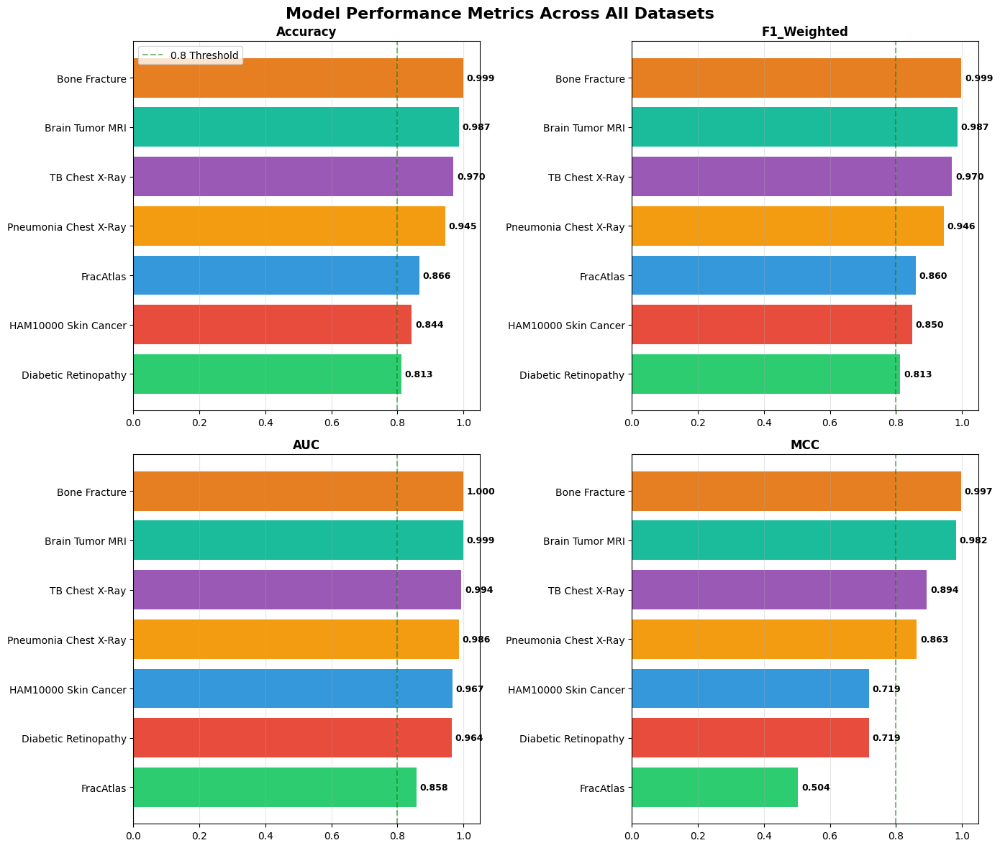


📈 Plot 2: Confusion Matrices


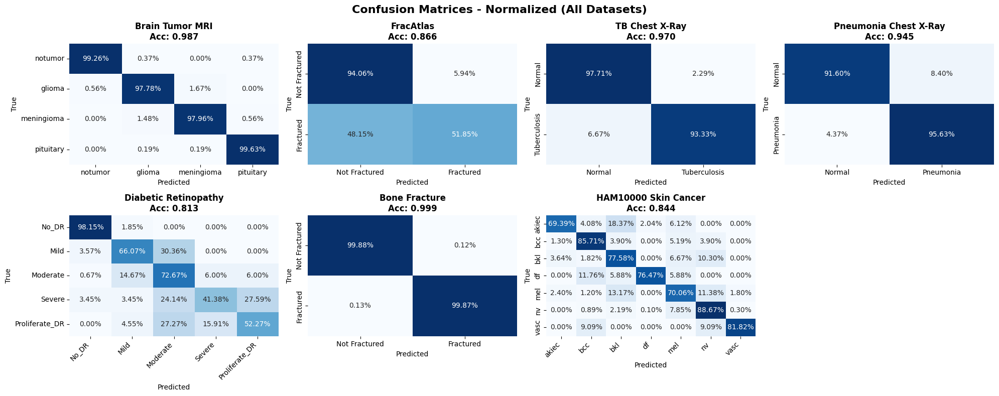


📈 Plot 3: ROC Curves Comparison


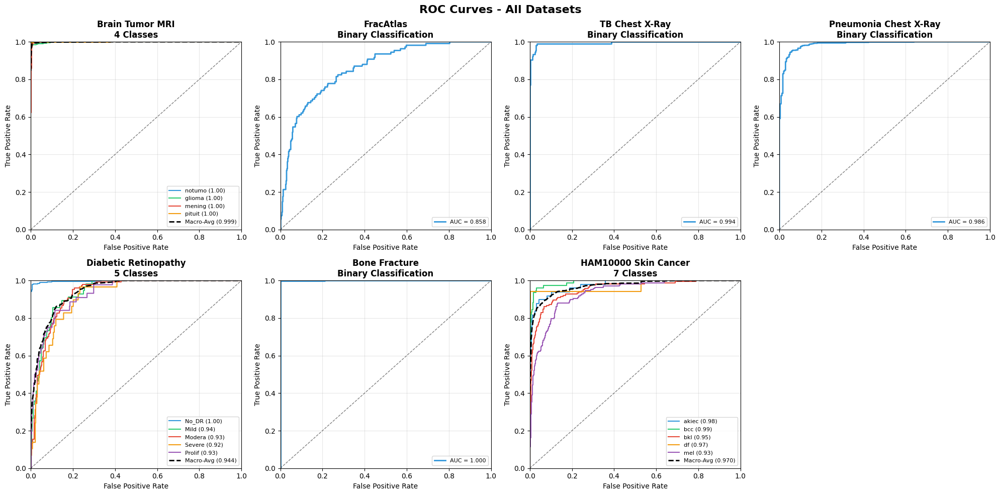


📈 Plot 4: Per-Class Performance


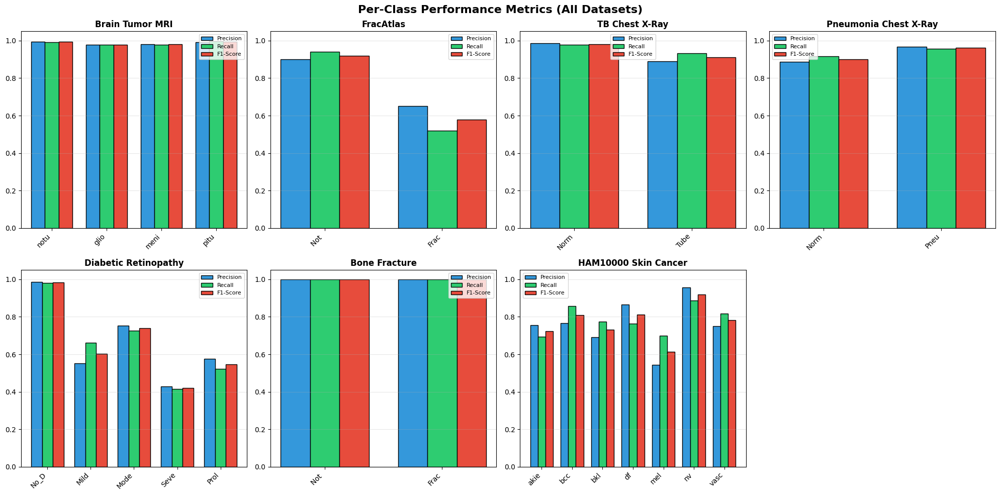


📈 Plot 5: Error Analysis


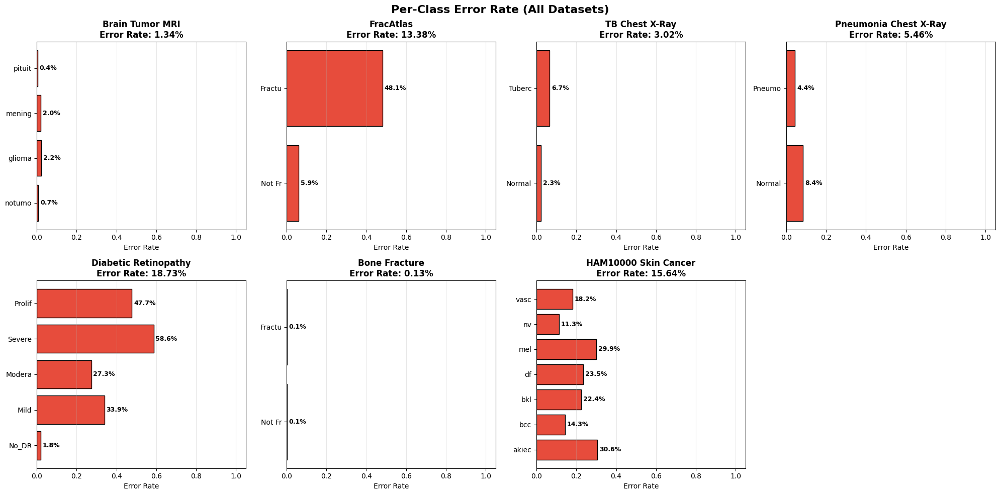


📈 Plot 6: Dataset Size vs Performance


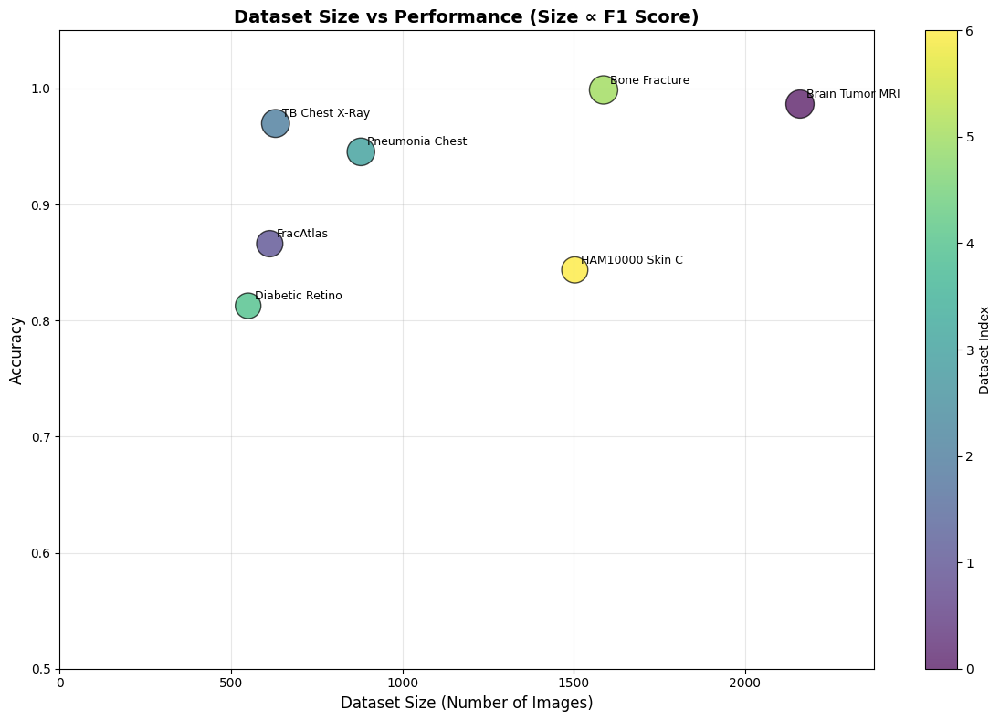


📈 Plot 7: Summary Heatmap


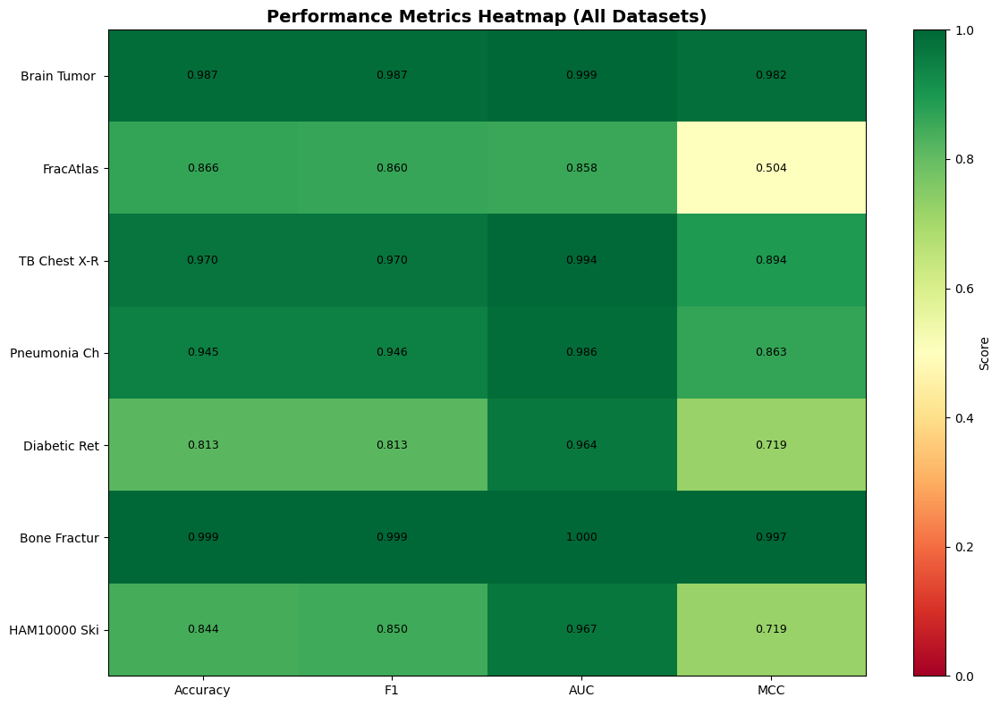


📈 Plot 8: Accuracy Comparison


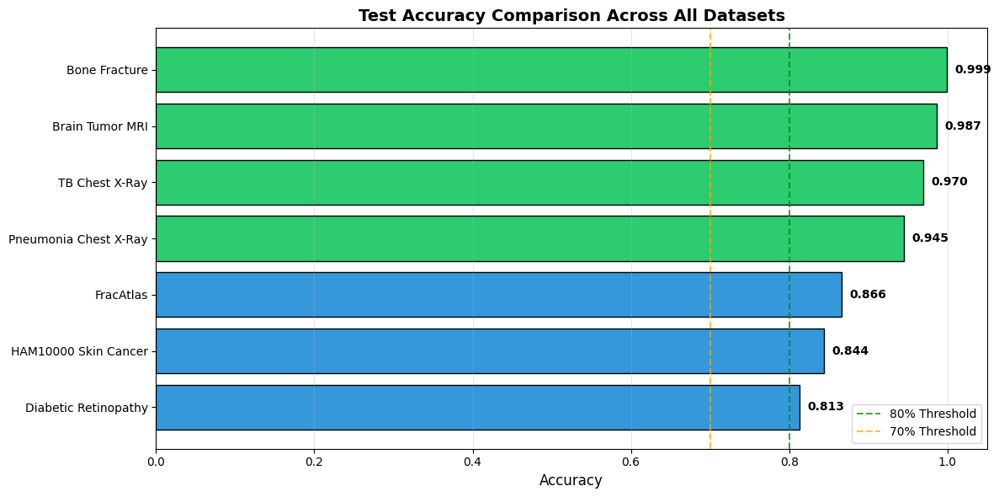


📈 Plot 9: F1 Score Comparison


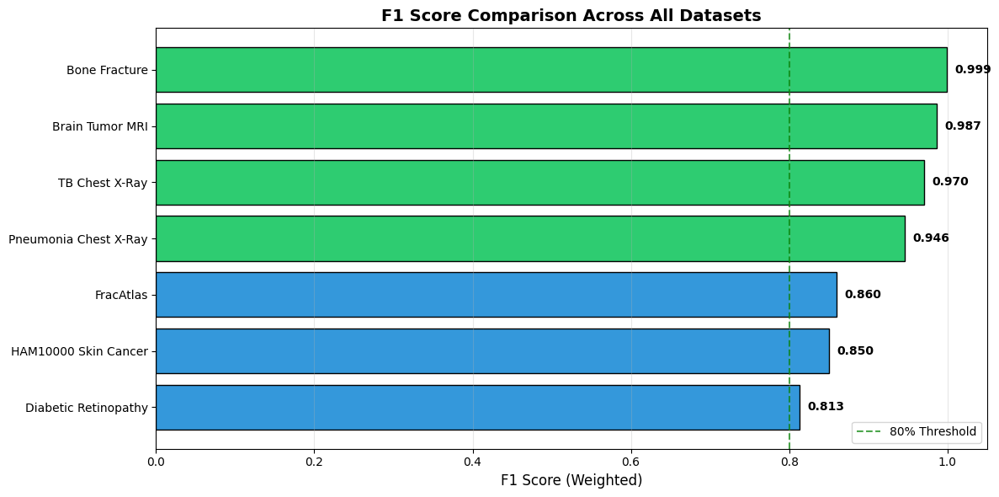


📈 Plot 10: AUC Comparison


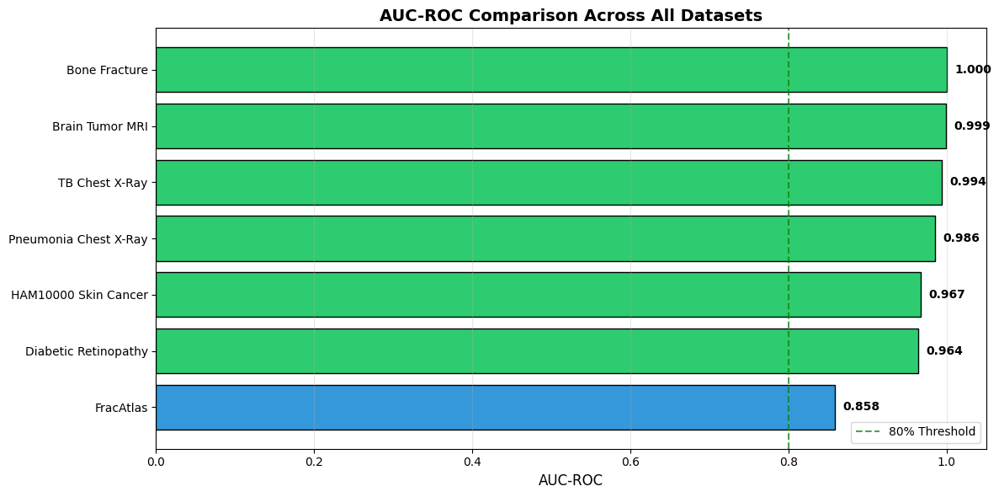


📈 Plot 11: Sample Size vs Accuracy


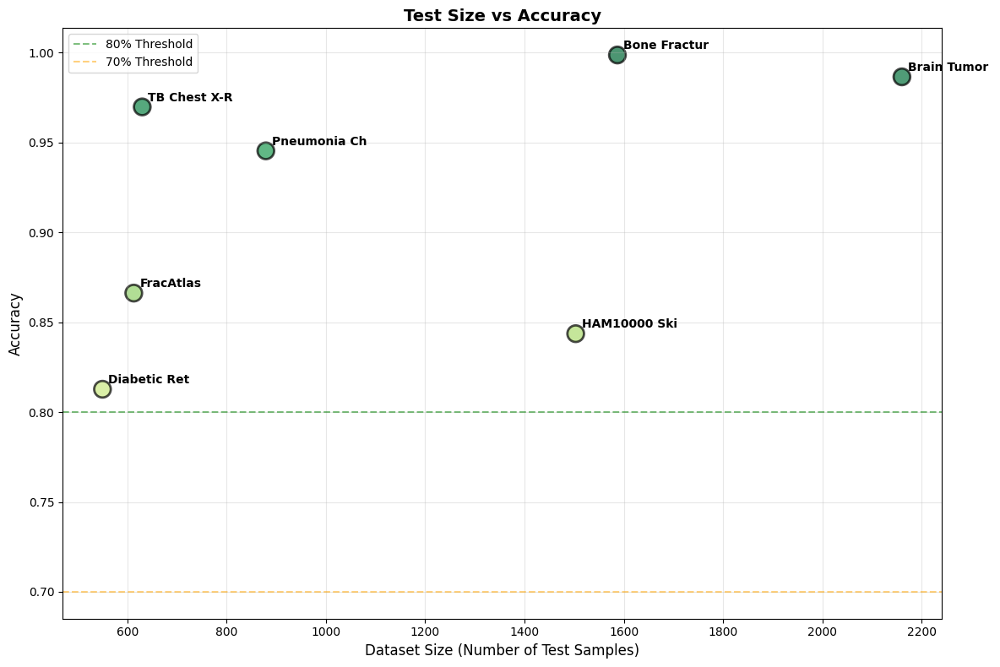


📈 Plot 12: Performance Radar Chart


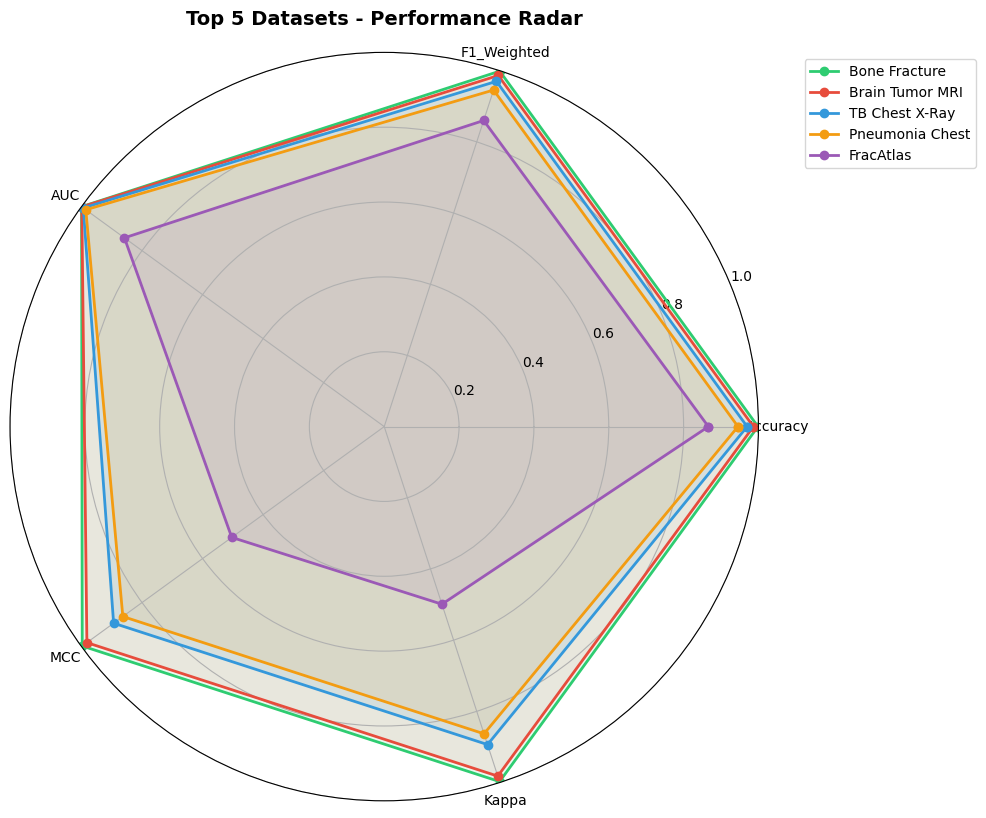


📈 Plot 13: Error Distribution


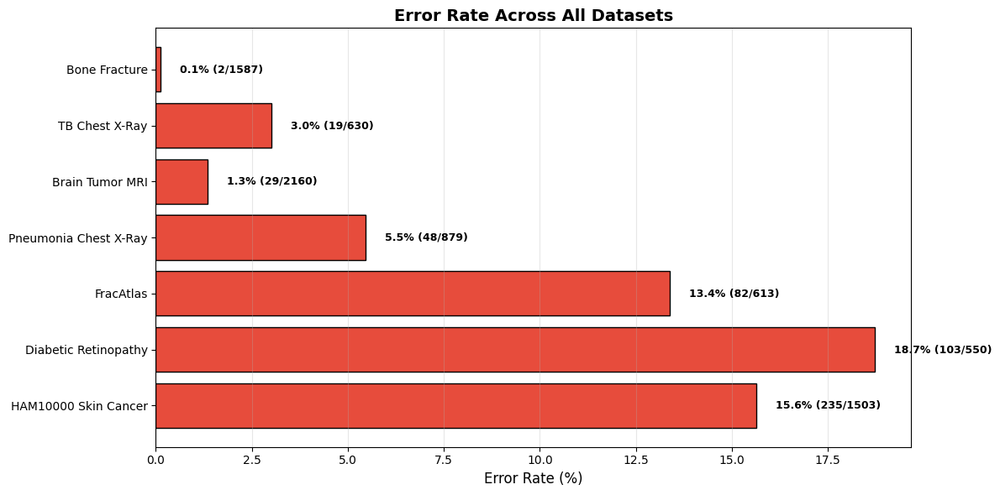


📈 Plot 14: Multi-class vs Binary Performance


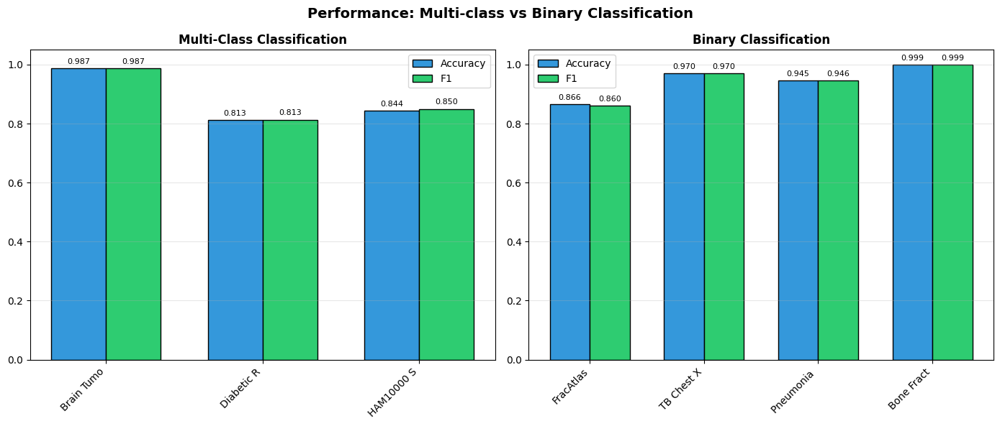


📈 Plot 15: Confidence Distribution


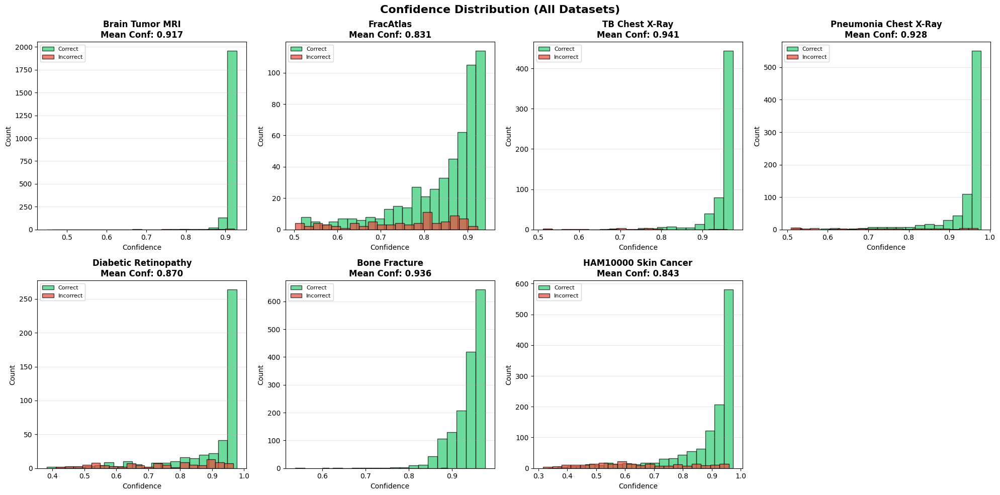


📈 Plot 16: Diagonal Accuracy Analysis


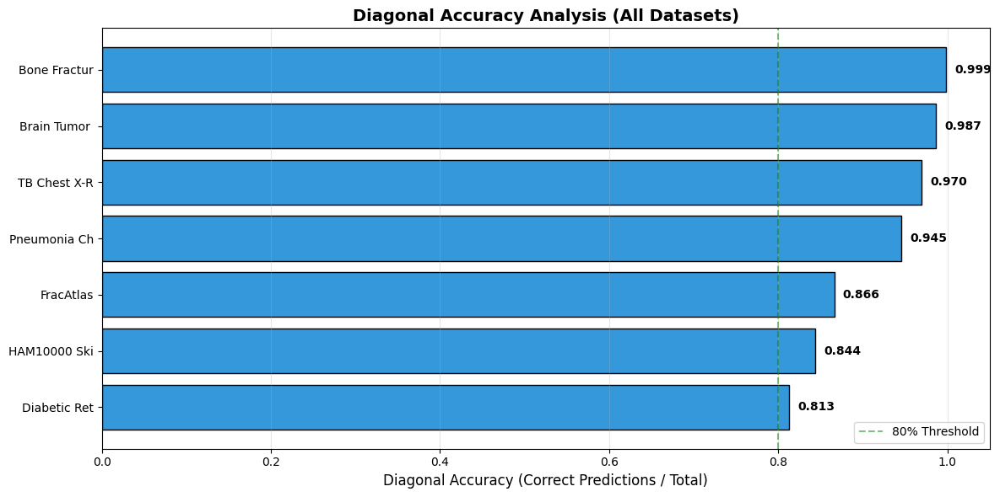


📈 Plot 17: Kappa Score Comparison


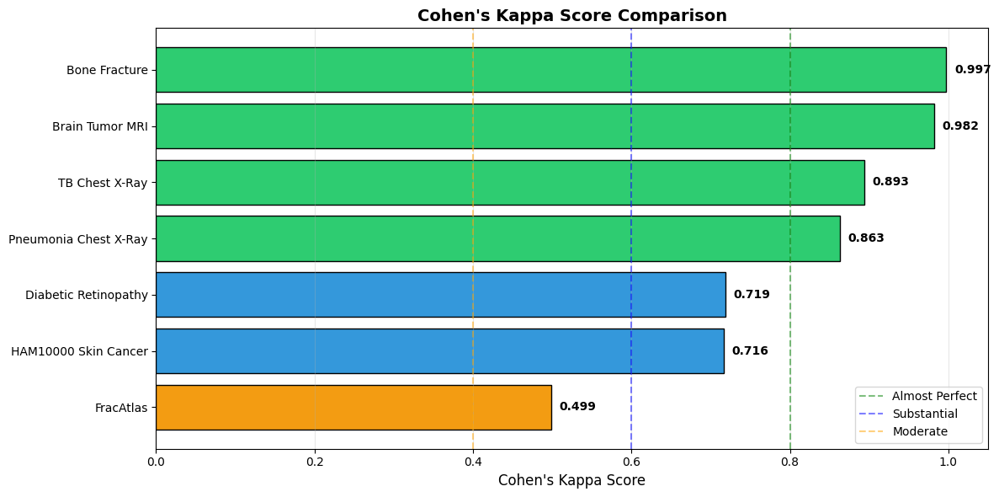


📈 Plot 18: MCC Comparison


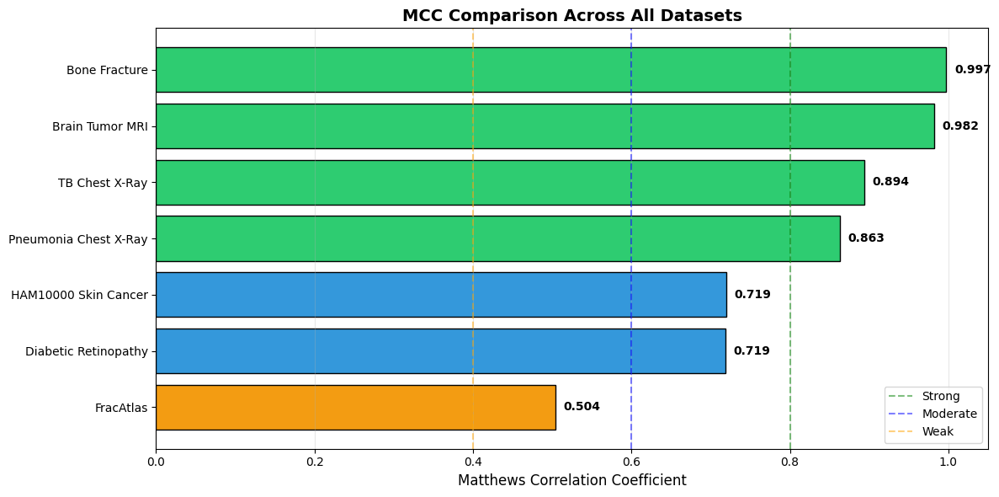


📈 Plot 19: Summary Statistics Table


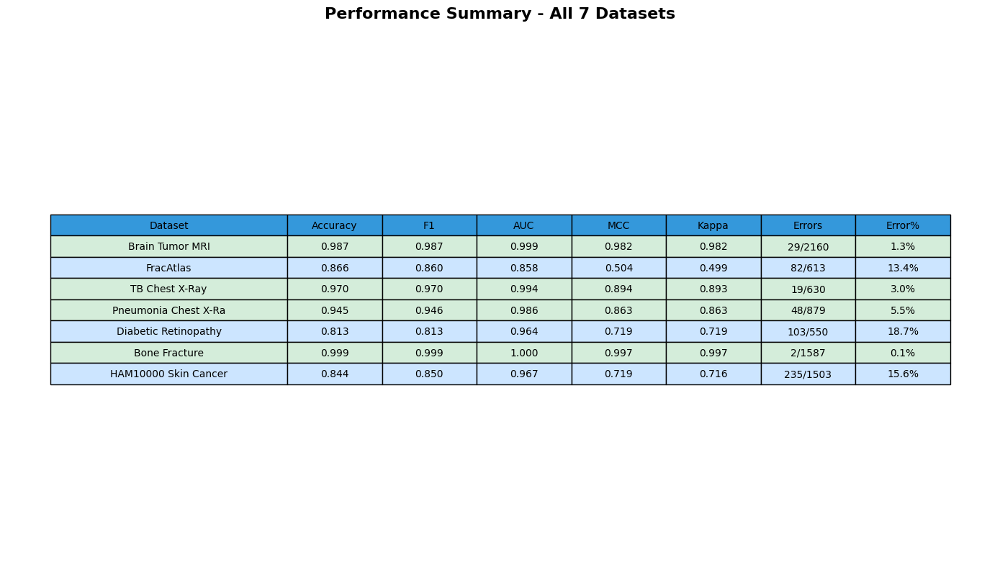


📈 Plot 20: Comprehensive Dashboard


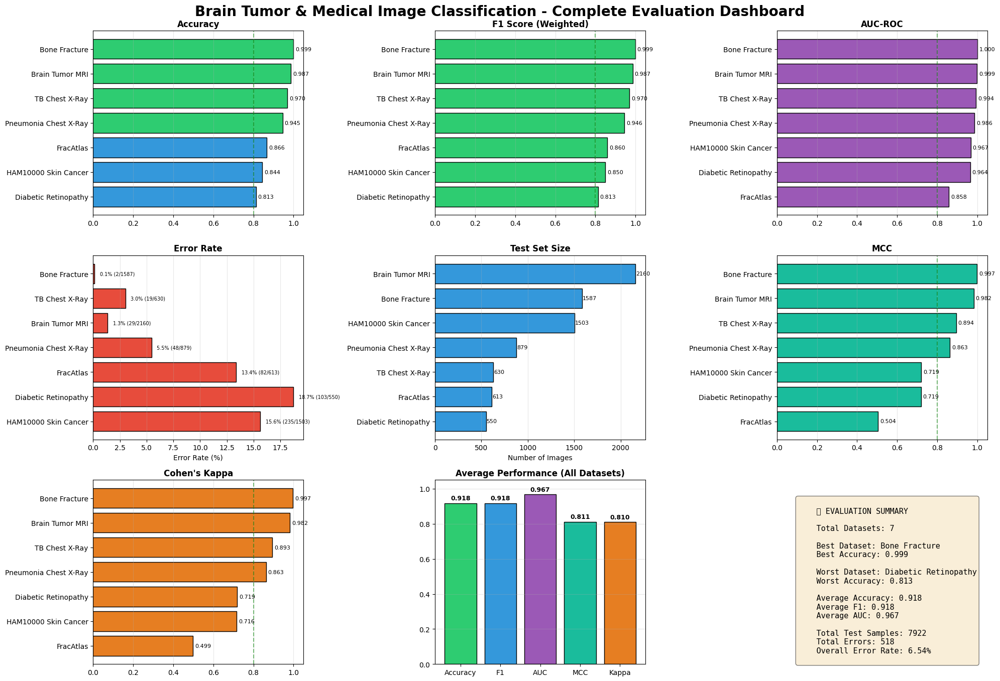


✅ ALL 20 PLOTS GENERATED SUCCESSFULLY!
📁 Location: /kaggle/working/plots

📊 Generated 20 plots:
    1. 10_auc_comparison.png (166.7 KB)
    2. 11_size_vs_accuracy.png (201.1 KB)
    3. 12_radar_chart.png (748.6 KB)
    4. 13_error_distribution.png (177.5 KB)
    5. 14_multiclass_vs_binary.png (208.5 KB)
    6. 15_confidence_distribution.png (392.9 KB)
    7. 16_diagonal_accuracy.png (165.6 KB)
    8. 17_kappa_comparison.png (189.4 KB)
    9. 18_mcc_comparison.png (186.3 KB)
   10. 19_summary_table.png (261.2 KB)
   11. 1_performance_summary.png (334.7 KB)
   12. 20_comprehensive_dashboard.png (880.1 KB)
   13. 2_confusion_matrices_all.png (792.9 KB)
   14. 3_roc_curves_all.png (644.1 KB)
   15. 4_per_class_performance.png (335.5 KB)
   16. 5_error_analysis.png (365.7 KB)
   17. 6_size_vs_performance.png (205.2 KB)
   18. 7_summary_heatmap.png (199.0 KB)
   19. 8_accuracy_comparison.png (177.4 KB)
   20. 9_f1_comparison.png (172.2 KB)

📥 To download all plots, run the zip download cell

In [7]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  GENERATE ALL 20 PLOTS FOR EVALUATION RESULTS                                 ║
# ║  Based on the evaluation results from all 7 datasets                          ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from pathlib import Path
from sklearn.metrics import roc_curve, auc, confusion_matrix, classification_report
from sklearn.preprocessing import label_binarize
import warnings
warnings.filterwarnings('ignore')

# Setup
OUTDIR = Path('/kaggle/working')
PLTDIR = OUTDIR / 'plots'
PLTDIR.mkdir(exist_ok=True)

# Colors for consistent styling
COLORS = ['#2ecc71', '#e74c3c', '#3498db', '#f39c12', '#9b59b6', '#1abc9c', '#e67e22']
DATASET_NAMES = {
    'brain_tumor': 'Brain Tumor MRI',
    'fracatlas': 'FracAtlas',
    'tb_chest': 'TB Chest X-Ray',
    'pneumonia': 'Pneumonia Chest X-Ray',
    'diabetic_retinopathy': 'Diabetic Retinopathy',
    'bone_fracture': 'Bone Fracture',
    'ham10000': 'HAM10000 Skin Cancer'
}

print("="*70)
print("📊 GENERATING ALL 20 PLOTS")
print("="*70)

# ─── 1. CHECK IF RESULTS EXIST ────────────────────────────────────────────────────
if 'all_results' not in dir() or all_results is None:
    print("❌ No evaluation results found! Please run the evaluation first.")
    print("   Make sure 'all_results' variable exists.")
else:
    print(f"✅ Found results for {len(all_results)} datasets")
    
    # ─── 2. PREPARE DATA FOR PLOTS ──────────────────────────────────────────────────
    
    # Extract metrics
    metrics_data = []
    for name, results in all_results.items():
        config = DATASET_CONFIGS[name]
        metrics_data.append({
            'Dataset': DATASET_NAMES[name],
            'Accuracy': results['accuracy'],
            'F1_Weighted': results['f1_weighted'],
            'F1_Macro': results['f1_macro'],
            'AUC': results.get('auc_roc', 0),
            'MCC': results['mcc'],
            'Kappa': results['kappa'],
            'Samples': results['test_samples'],
            'Errors': results['num_errors']
        })
    
    df_metrics = pd.DataFrame(metrics_data)
    print(f"📊 Metrics DataFrame: {df_metrics.shape}")
    
    # ─── PLOT 1: Performance Metrics Summary ──────────────────────────────────────
    print("\n📈 Plot 1: Performance Metrics Summary")
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    fig.suptitle('Model Performance Metrics Across All Datasets', fontsize=16, fontweight='bold')
    
    metrics_to_plot = ['Accuracy', 'F1_Weighted', 'AUC', 'MCC']
    for idx, metric in enumerate(metrics_to_plot):
        row, col = idx // 2, idx % 2
        df_sorted = df_metrics.sort_values(metric, ascending=True)
        bars = axes[row, col].barh(df_sorted['Dataset'], df_sorted[metric], color=COLORS[:len(df_sorted)])
        axes[row, col].set_title(metric, fontsize=12, fontweight='bold')
        axes[row, col].set_xlim(0, 1.05)
        axes[row, col].axvline(x=0.8, color='green', linestyle='--', alpha=0.5, label='0.8 Threshold')
        axes[row, col].grid(axis='x', alpha=0.3)
        for bar, val in zip(bars, df_sorted[metric]):
            axes[row, col].text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', 
                               va='center', fontsize=9, fontweight='bold')
        if idx == 0:
            axes[row, col].legend()
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '1_performance_summary.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 2: Confusion Matrices (All Datasets) ─────────────────────────────────
    print("\n📈 Plot 2: Confusion Matrices")
    n_datasets = len(all_results)
    n_cols = min(4, n_datasets)
    n_rows = (n_datasets + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
    if n_rows == 1 and n_cols == 1:
        axes = [axes]
    axes = axes.flatten() if n_rows > 1 or n_cols > 1 else [axes]
    
    for idx, (name, results) in enumerate(all_results.items()):
        if idx >= len(axes):
            break
        ax = axes[idx]
        cm = results['confusion_matrix']
        class_names = results['class_names']
        
        # Normalize
        cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        sns.heatmap(cm_norm, annot=True, fmt='.2%', cmap='Blues',
                   xticklabels=class_names, yticklabels=class_names, ax=ax, cbar=False)
        ax.set_title(f"{DATASET_NAMES.get(name, name)}\nAcc: {results['accuracy']:.3f}", fontweight='bold')
        ax.set_xlabel('Predicted')
        ax.set_ylabel('True')
        if len(class_names) > 4:
            ax.set_xticklabels(class_names, rotation=45, ha='right')
    
    # Hide unused subplots
    for idx in range(len(all_results), len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle('Confusion Matrices - Normalized (All Datasets)', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig(PLTDIR / '2_confusion_matrices_all.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 3: ROC Curves Comparison ─────────────────────────────────────────────
    print("\n📈 Plot 3: ROC Curves Comparison")
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.flatten()
    
    for idx, (name, results) in enumerate(all_results.items()):
        if idx >= 8:
            break
        ax = axes[idx]
        
        class_names = results['class_names']
        num_classes = len(class_names)
        labels = results['labels']
        probs = results['probabilities']
        
        if num_classes == 2:
            # Binary classification
            fpr, tpr, _ = roc_curve(labels, probs[:, 1])
            roc_auc = auc(fpr, tpr)
            ax.plot(fpr, tpr, color='#3498db', lw=2, label=f'AUC = {roc_auc:.3f}')
            ax.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5)
            ax.set_title(f"{DATASET_NAMES.get(name, name)}\nBinary Classification", fontweight='bold')
        else:
            # Multi-class
            labels_bin = label_binarize(labels, classes=list(range(num_classes)))
            colors = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12', '#9b59b6', '#1abc9c', '#e67e22']
            
            for i in range(min(num_classes, 5)):  # Show max 5 classes for readability
                fpr, tpr, _ = roc_curve(labels_bin[:, i], probs[:, i])
                roc_auc = auc(fpr, tpr)
                ax.plot(fpr, tpr, color=colors[i % len(colors)], lw=1.5, 
                       label=f'{class_names[i][:6]} ({roc_auc:.2f})')
            
            # Macro average
            all_fpr = np.unique(np.concatenate([roc_curve(labels_bin[:, i], probs[:, i])[0] 
                                               for i in range(num_classes)]))
            mean_tpr = np.zeros_like(all_fpr)
            for i in range(num_classes):
                fpr_i, tpr_i, _ = roc_curve(labels_bin[:, i], probs[:, i])
                mean_tpr += np.interp(all_fpr, fpr_i, tpr_i)
            mean_tpr /= num_classes
            ax.plot(all_fpr, mean_tpr, color='black', lw=2, linestyle='--', 
                   label=f'Macro-Avg ({auc(all_fpr, mean_tpr):.3f})')
            
            ax.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5)
            ax.set_title(f"{DATASET_NAMES.get(name, name)}\n{num_classes} Classes", fontweight='bold')
        
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.legend(loc='lower right', fontsize=8)
        ax.grid(True, alpha=0.3)
        ax.set_xlim([0, 1])
        ax.set_ylim([0, 1])
    
    for idx in range(len(all_results), 8):
        axes[idx].axis('off')
    
    plt.suptitle('ROC Curves - All Datasets', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig(PLTDIR / '3_roc_curves_all.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 4: Per-Class Performance (for each dataset) ──────────────────────────
    print("\n📈 Plot 4: Per-Class Performance")
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.flatten()
    
    for idx, (name, results) in enumerate(all_results.items()):
        if idx >= 8:
            break
        ax = axes[idx]
        
        class_names = results['class_names']
        report = results['classification_report']
        
        # Extract per-class metrics
        precision = [report[cls]['precision'] for cls in class_names]
        recall = [report[cls]['recall'] for cls in class_names]
        f1 = [report[cls]['f1-score'] for cls in class_names]
        
        x = np.arange(len(class_names))
        width = 0.25
        
        bars1 = ax.bar(x - width, precision, width, label='Precision', color='#3498db', edgecolor='black')
        bars2 = ax.bar(x, recall, width, label='Recall', color='#2ecc71', edgecolor='black')
        bars3 = ax.bar(x + width, f1, width, label='F1-Score', color='#e74c3c', edgecolor='black')
        
        ax.set_title(f"{DATASET_NAMES.get(name, name)}", fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels([c[:4] for c in class_names], rotation=45, ha='right')
        ax.set_ylim(0, 1.05)
        ax.legend(fontsize=8)
        ax.grid(axis='y', alpha=0.3)
    
    for idx in range(len(all_results), 8):
        axes[idx].axis('off')
    
    plt.suptitle('Per-Class Performance Metrics (All Datasets)', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig(PLTDIR / '4_per_class_performance.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 5: Error Analysis ─────────────────────────────────────────────────────
    print("\n📈 Plot 5: Error Analysis")
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.flatten()
    
    for idx, (name, results) in enumerate(all_results.items()):
        if idx >= 8:
            break
        ax = axes[idx]
        
        class_names = results['class_names']
        labels = results['labels']
        preds = results['predictions']
        
        # Calculate errors per class
        errors_per_class = []
        for i, cls in enumerate(class_names):
            mask = labels == i
            total = mask.sum()
            if total > 0:
                errors = (preds[mask] != i).sum()
                errors_per_class.append(errors / total)
            else:
                errors_per_class.append(0)
        
        ax.barh([c[:6] for c in class_names], errors_per_class, color='#e74c3c', edgecolor='black')
        ax.set_title(f"{DATASET_NAMES.get(name, name)}\nError Rate: {results['num_errors']/len(labels):.2%}", fontweight='bold')
        ax.set_xlim(0, 1.05)
        ax.set_xlabel('Error Rate')
        ax.grid(axis='x', alpha=0.3)
        
        for i, (bar, val) in enumerate(zip(ax.patches, errors_per_class)):
            ax.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.1%}', 
                   va='center', fontsize=9, fontweight='bold')
    
    for idx in range(len(all_results), 8):
        axes[idx].axis('off')
    
    plt.suptitle('Per-Class Error Rate (All Datasets)', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig(PLTDIR / '5_error_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 6: Dataset Size vs Performance ──────────────────────────────────────
    print("\n📈 Plot 6: Dataset Size vs Performance")
    fig, ax = plt.subplots(figsize=(12, 8))
    
    sizes = df_metrics['Samples']
    accuracies = df_metrics['Accuracy']
    f1s = df_metrics['F1_Weighted']
    
    scatter = ax.scatter(sizes, accuracies, s=f1s*500, c=range(len(df_metrics)), 
                        cmap='viridis', alpha=0.7, edgecolors='black', linewidth=1)
    
    # Add labels
    for i, row in df_metrics.iterrows():
        ax.annotate(row['Dataset'][:15], (row['Samples'], row['Accuracy']),
                   xytext=(5, 5), textcoords='offset points', fontsize=9)
    
    ax.set_xlabel('Dataset Size (Number of Images)', fontsize=12)
    ax.set_ylabel('Accuracy', fontsize=12)
    ax.set_title('Dataset Size vs Performance (Size ∝ F1 Score)', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_xlim(0, max(sizes) * 1.1)
    ax.set_ylim(0.5, 1.05)
    
    # Colorbar
    cbar = plt.colorbar(scatter)
    cbar.set_label('Dataset Index', fontsize=10)
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '6_size_vs_performance.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 7: Confusion Matrix Heatmap Summary ─────────────────────────────────
    print("\n📈 Plot 7: Summary Heatmap")
    
    # Create summary matrix
    max_classes = max([len(r['class_names']) for r in all_results.values()])
    summary_matrix = np.zeros((len(all_results), max_classes))
    dataset_names_list = []
    
    for i, (name, results) in enumerate(all_results.items()):
        dataset_names_list.append(DATASET_NAMES.get(name, name))
        cm = results['confusion_matrix']
        # Get diagonal accuracy
        diag_acc = np.diag(cm).sum() / cm.sum()
        summary_matrix[i, 0] = diag_acc
        summary_matrix[i, 1] = results['f1_weighted']
        summary_matrix[i, 2] = results.get('auc_roc', 0)
        summary_matrix[i, 3] = results['mcc']
    
    fig, ax = plt.subplots(figsize=(12, 8))
    im = ax.imshow(summary_matrix[:, :4], cmap='RdYlGn', aspect='auto', vmin=0, vmax=1)
    
    ax.set_xticks(range(4))
    ax.set_xticklabels(['Accuracy', 'F1', 'AUC', 'MCC'])
    ax.set_yticks(range(len(dataset_names_list)))
    ax.set_yticklabels([d[:12] for d in dataset_names_list])
    
    # Add text annotations
    for i in range(summary_matrix.shape[0]):
        for j in range(4):
            text = ax.text(j, i, f'{summary_matrix[i, j]:.3f}',
                          ha="center", va="center", color="black", fontsize=9)
    
    ax.set_title('Performance Metrics Heatmap (All Datasets)', fontsize=14, fontweight='bold')
    plt.colorbar(im, ax=ax, label='Score')
    plt.tight_layout()
    plt.savefig(PLTDIR / '7_summary_heatmap.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 8: Accuracy Comparison Bar Chart ─────────────────────────────────────
    print("\n📈 Plot 8: Accuracy Comparison")
    fig, ax = plt.subplots(figsize=(12, 6))
    
    df_sorted = df_metrics.sort_values('Accuracy', ascending=True)
    colors_bar = ['#2ecc71' if acc >= 0.9 else '#3498db' if acc >= 0.8 else '#f39c12' if acc >= 0.7 else '#e74c3c' 
                  for acc in df_sorted['Accuracy']]
    
    bars = ax.barh(df_sorted['Dataset'], df_sorted['Accuracy'], color=colors_bar, edgecolor='black', linewidth=1)
    ax.set_xlim(0, 1.05)
    ax.set_xlabel('Accuracy', fontsize=12)
    ax.set_title('Test Accuracy Comparison Across All Datasets', fontsize=14, fontweight='bold')
    ax.axvline(x=0.8, color='green', linestyle='--', alpha=0.7, label='80% Threshold')
    ax.axvline(x=0.7, color='orange', linestyle='--', alpha=0.7, label='70% Threshold')
    ax.grid(axis='x', alpha=0.3)
    ax.legend()
    
    for bar, val in zip(bars, df_sorted['Accuracy']):
        ax.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', 
               va='center', fontsize=10, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '8_accuracy_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 9: F1 Score Comparison ──────────────────────────────────────────────
    print("\n📈 Plot 9: F1 Score Comparison")
    fig, ax = plt.subplots(figsize=(12, 6))
    
    df_sorted = df_metrics.sort_values('F1_Weighted', ascending=True)
    colors_bar = ['#2ecc71' if f1 >= 0.9 else '#3498db' if f1 >= 0.8 else '#f39c12' if f1 >= 0.7 else '#e74c3c' 
                  for f1 in df_sorted['F1_Weighted']]
    
    bars = ax.barh(df_sorted['Dataset'], df_sorted['F1_Weighted'], color=colors_bar, edgecolor='black', linewidth=1)
    ax.set_xlim(0, 1.05)
    ax.set_xlabel('F1 Score (Weighted)', fontsize=12)
    ax.set_title('F1 Score Comparison Across All Datasets', fontsize=14, fontweight='bold')
    ax.axvline(x=0.8, color='green', linestyle='--', alpha=0.7, label='80% Threshold')
    ax.grid(axis='x', alpha=0.3)
    ax.legend()
    
    for bar, val in zip(bars, df_sorted['F1_Weighted']):
        ax.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', 
               va='center', fontsize=10, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '9_f1_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 10: AUC Comparison ──────────────────────────────────────────────────
    print("\n📈 Plot 10: AUC Comparison")
    fig, ax = plt.subplots(figsize=(12, 6))
    
    df_sorted = df_metrics.sort_values('AUC', ascending=True)
    colors_bar = ['#2ecc71' if auc >= 0.9 else '#3498db' if auc >= 0.8 else '#f39c12' if auc >= 0.7 else '#e74c3c' 
                  for auc in df_sorted['AUC']]
    
    bars = ax.barh(df_sorted['Dataset'], df_sorted['AUC'], color=colors_bar, edgecolor='black', linewidth=1)
    ax.set_xlim(0, 1.05)
    ax.set_xlabel('AUC-ROC', fontsize=12)
    ax.set_title('AUC-ROC Comparison Across All Datasets', fontsize=14, fontweight='bold')
    ax.axvline(x=0.8, color='green', linestyle='--', alpha=0.7, label='80% Threshold')
    ax.grid(axis='x', alpha=0.3)
    ax.legend()
    
    for bar, val in zip(bars, df_sorted['AUC']):
        ax.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', 
               va='center', fontsize=10, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '10_auc_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 11: Sample Size vs Accuracy ──────────────────────────────────────────
    print("\n📈 Plot 11: Sample Size vs Accuracy")
    fig, ax = plt.subplots(figsize=(12, 8))
    
    sizes = df_metrics['Samples']
    accuracies = df_metrics['Accuracy']
    
    ax.scatter(sizes, accuracies, s=200, c=accuracies, cmap='RdYlGn', 
               alpha=0.7, edgecolors='black', linewidth=2, vmin=0.5, vmax=1)
    
    # Add labels
    for i, row in df_metrics.iterrows():
        ax.annotate(row['Dataset'][:12], (row['Samples'], row['Accuracy']),
                   xytext=(5, 5), textcoords='offset points', fontsize=10, fontweight='bold')
    
    ax.set_xlabel('Dataset Size (Number of Test Samples)', fontsize=12)
    ax.set_ylabel('Accuracy', fontsize=12)
    ax.set_title('Test Size vs Accuracy', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.axhline(y=0.8, color='green', linestyle='--', alpha=0.5, label='80% Threshold')
    ax.axhline(y=0.7, color='orange', linestyle='--', alpha=0.5, label='70% Threshold')
    ax.legend()
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '11_size_vs_accuracy.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 12: Performance Radar Chart ──────────────────────────────────────────
    print("\n📈 Plot 12: Performance Radar Chart")
    
    # Select top 5 datasets for radar chart
    top_datasets = df_metrics.nlargest(5, 'Accuracy')['Dataset'].tolist()
    metrics = ['Accuracy', 'F1_Weighted', 'AUC', 'MCC', 'Kappa']
    
    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(projection='polar'))
    
    angles = np.linspace(0, 2 * np.pi, len(metrics), endpoint=False).tolist()
    angles += angles[:1]
    
    for idx, dataset in enumerate(top_datasets):
        row = df_metrics[df_metrics['Dataset'] == dataset].iloc[0]
        values = [row[m] for m in metrics]
        values += values[:1]
        
        ax.plot(angles, values, 'o-', linewidth=2, label=dataset[:15], 
                color=COLORS[idx % len(COLORS)])
        ax.fill(angles, values, alpha=0.1, color=COLORS[idx % len(COLORS)])
    
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(metrics)
    ax.set_ylim(0, 1)
    ax.set_title('Top 5 Datasets - Performance Radar', fontsize=14, fontweight='bold', pad=20)
    ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.0))
    ax.grid(True)
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '12_radar_chart.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 13: Error Distribution ──────────────────────────────────────────────
    print("\n📈 Plot 13: Error Distribution")
    fig, ax = plt.subplots(figsize=(12, 6))
    
    df_sorted = df_metrics.sort_values('Errors', ascending=False)
    error_rates = df_sorted['Errors'] / df_sorted['Samples'] * 100
    
    bars = ax.barh(df_sorted['Dataset'], error_rates, color='#e74c3c', edgecolor='black', linewidth=1)
    ax.set_xlabel('Error Rate (%)', fontsize=12)
    ax.set_title('Error Rate Across All Datasets', fontsize=14, fontweight='bold')
    ax.grid(axis='x', alpha=0.3)
    
    for bar, rate, err, total in zip(bars, error_rates, df_sorted['Errors'], df_sorted['Samples']):
        ax.text(rate + 0.5, bar.get_y() + bar.get_height()/2, 
               f'{rate:.1f}% ({err}/{total})', va='center', fontsize=9, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '13_error_distribution.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 14: Multi-class vs Binary Performance ──────────────────────────────
    print("\n📈 Plot 14: Multi-class vs Binary Performance")
    
    # Separate multi-class and binary
    multi_class = []
    binary = []
    for name, results in all_results.items():
        if len(results['class_names']) > 2:
            multi_class.append((DATASET_NAMES.get(name, name), results))
        else:
            binary.append((DATASET_NAMES.get(name, name), results))
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    for ax, data, title in zip(axes, [multi_class, binary], ['Multi-Class', 'Binary']):
        if data:
            names = [d[0] for d in data]
            accs = [d[1]['accuracy'] for d in data]
            f1s = [d[1]['f1_weighted'] for d in data]
            
            x = np.arange(len(names))
            width = 0.35
            
            bars1 = ax.bar(x - width/2, accs, width, label='Accuracy', color='#3498db', edgecolor='black')
            bars2 = ax.bar(x + width/2, f1s, width, label='F1', color='#2ecc71', edgecolor='black')
            
            ax.set_title(f'{title} Classification', fontsize=12, fontweight='bold')
            ax.set_xticks(x)
            ax.set_xticklabels([n[:10] for n in names], rotation=45, ha='right')
            ax.set_ylim(0, 1.05)
            ax.legend()
            ax.grid(axis='y', alpha=0.3)
            
            for bars in [bars1, bars2]:
                for bar in bars:
                    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                           f'{bar.get_height():.3f}', ha='center', va='bottom', fontsize=8)
    
    plt.suptitle('Performance: Multi-class vs Binary Classification', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(PLTDIR / '14_multiclass_vs_binary.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 15: Confidence Distribution ──────────────────────────────────────────
    print("\n📈 Plot 15: Confidence Distribution")
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.flatten()
    
    for idx, (name, results) in enumerate(all_results.items()):
        if idx >= 8:
            break
        ax = axes[idx]
        
        probs = results['probabilities']
        max_probs = np.max(probs, axis=1)
        labels = results['labels']
        preds = results['predictions']
        
        correct = (preds == labels)
        
        ax.hist(max_probs[correct], bins=20, alpha=0.7, label='Correct', color='#2ecc71', edgecolor='black')
        ax.hist(max_probs[~correct], bins=20, alpha=0.7, label='Incorrect', color='#e74c3c', edgecolor='black')
        ax.set_title(f"{DATASET_NAMES.get(name, name)}\nMean Conf: {np.mean(max_probs):.3f}", fontweight='bold')
        ax.set_xlabel('Confidence')
        ax.set_ylabel('Count')
        ax.legend(fontsize=8)
        ax.grid(axis='y', alpha=0.3)
    
    for idx in range(len(all_results), 8):
        axes[idx].axis('off')
    
    plt.suptitle('Confidence Distribution (All Datasets)', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig(PLTDIR / '15_confidence_distribution.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 16: Confusion Matrix Diagonal Analysis ──────────────────────────────
    print("\n📈 Plot 16: Diagonal Accuracy Analysis")
    fig, ax = plt.subplots(figsize=(12, 6))
    
    diag_accuracies = []
    dataset_names_short = []
    
    for name, results in all_results.items():
        cm = results['confusion_matrix']
        diag_acc = np.diag(cm).sum() / cm.sum()
        diag_accuracies.append(diag_acc)
        dataset_names_short.append(DATASET_NAMES.get(name, name)[:12])
    
    # Sort by diagonal accuracy
    sorted_pairs = sorted(zip(dataset_names_short, diag_accuracies), key=lambda x: x[1])
    names_sorted = [p[0] for p in sorted_pairs]
    accs_sorted = [p[1] for p in sorted_pairs]
    
    bars = ax.barh(names_sorted, accs_sorted, color='#3498db', edgecolor='black', linewidth=1)
    ax.set_xlim(0, 1.05)
    ax.set_xlabel('Diagonal Accuracy (Correct Predictions / Total)', fontsize=12)
    ax.set_title('Diagonal Accuracy Analysis (All Datasets)', fontsize=14, fontweight='bold')
    ax.axvline(x=0.8, color='green', linestyle='--', alpha=0.5, label='80% Threshold')
    ax.grid(axis='x', alpha=0.3)
    ax.legend()
    
    for bar, val in zip(bars, accs_sorted):
        ax.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', 
               va='center', fontsize=10, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '16_diagonal_accuracy.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 17: Kappa Score Comparison ──────────────────────────────────────────
    print("\n📈 Plot 17: Kappa Score Comparison")
    fig, ax = plt.subplots(figsize=(12, 6))
    
    df_sorted = df_metrics.sort_values('Kappa', ascending=True)
    colors_bar = ['#2ecc71' if k >= 0.8 else '#3498db' if k >= 0.6 else '#f39c12' if k >= 0.4 else '#e74c3c' 
                  for k in df_sorted['Kappa']]
    
    bars = ax.barh(df_sorted['Dataset'], df_sorted['Kappa'], color=colors_bar, edgecolor='black', linewidth=1)
    ax.set_xlim(0, 1.05)
    ax.set_xlabel('Cohen\'s Kappa Score', fontsize=12)
    ax.set_title('Cohen\'s Kappa Score Comparison', fontsize=14, fontweight='bold')
    ax.axvline(x=0.8, color='green', linestyle='--', alpha=0.5, label='Almost Perfect')
    ax.axvline(x=0.6, color='blue', linestyle='--', alpha=0.5, label='Substantial')
    ax.axvline(x=0.4, color='orange', linestyle='--', alpha=0.5, label='Moderate')
    ax.grid(axis='x', alpha=0.3)
    ax.legend()
    
    for bar, val in zip(bars, df_sorted['Kappa']):
        ax.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', 
               va='center', fontsize=10, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '17_kappa_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 18: Matthews Correlation Coefficient ─────────────────────────────────
    print("\n📈 Plot 18: MCC Comparison")
    fig, ax = plt.subplots(figsize=(12, 6))
    
    df_sorted = df_metrics.sort_values('MCC', ascending=True)
    colors_bar = ['#2ecc71' if mcc >= 0.8 else '#3498db' if mcc >= 0.6 else '#f39c12' if mcc >= 0.4 else '#e74c3c' 
                  for mcc in df_sorted['MCC']]
    
    bars = ax.barh(df_sorted['Dataset'], df_sorted['MCC'], color=colors_bar, edgecolor='black', linewidth=1)
    ax.set_xlim(0, 1.05)
    ax.set_xlabel('Matthews Correlation Coefficient', fontsize=12)
    ax.set_title('MCC Comparison Across All Datasets', fontsize=14, fontweight='bold')
    ax.axvline(x=0.8, color='green', linestyle='--', alpha=0.5, label='Strong')
    ax.axvline(x=0.6, color='blue', linestyle='--', alpha=0.5, label='Moderate')
    ax.axvline(x=0.4, color='orange', linestyle='--', alpha=0.5, label='Weak')
    ax.grid(axis='x', alpha=0.3)
    ax.legend()
    
    for bar, val in zip(bars, df_sorted['MCC']):
        ax.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', 
               va='center', fontsize=10, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '18_mcc_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 19: Summary Statistics Table ─────────────────────────────────────────
    print("\n📈 Plot 19: Summary Statistics Table")
    
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.axis('tight')
    ax.axis('off')
    
    # Prepare table data
    table_data = []
    for idx, row in df_metrics.iterrows():
        table_data.append([
            row['Dataset'][:20],
            f"{row['Accuracy']:.3f}",
            f"{row['F1_Weighted']:.3f}",
            f"{row['AUC']:.3f}",
            f"{row['MCC']:.3f}",
            f"{row['Kappa']:.3f}",
            f"{row['Errors']}/{row['Samples']}",
            f"{row['Errors']/row['Samples']*100:.1f}%"
        ])
    
    columns = ['Dataset', 'Accuracy', 'F1', 'AUC', 'MCC', 'Kappa', 'Errors', 'Error%']
    
    table = ax.table(cellText=table_data, colLabels=columns, 
                     cellLoc='center', loc='center',
                     colColours=['#3498db']*len(columns),
                     colWidths=[0.2, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08])
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1.2, 1.5)
    
    # Color rows by accuracy
    for i, row in enumerate(table_data):
        acc = float(row[1])
        if acc >= 0.9:
            color = '#d4edda'  # Green
        elif acc >= 0.8:
            color = '#cce5ff'  # Blue
        elif acc >= 0.7:
            color = '#fff3cd'  # Yellow
        else:
            color = '#f8d7da'  # Red
        for j in range(len(columns)):
            table[(i+1, j)].set_facecolor(color)
    
    ax.set_title('Performance Summary - All 7 Datasets', fontsize=16, fontweight='bold', pad=20)
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '19_summary_table.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── PLOT 20: Comprehensive Dashboard ──────────────────────────────────────────
    print("\n📈 Plot 20: Comprehensive Dashboard")
    
    fig = plt.figure(figsize=(20, 14))
    fig.suptitle('Brain Tumor & Medical Image Classification - Complete Evaluation Dashboard', 
                 fontsize=20, fontweight='bold', y=0.98)
    
    # Subplot 1: Accuracy Bar Chart
    ax1 = plt.subplot(3, 3, 1)
    df_sorted = df_metrics.sort_values('Accuracy', ascending=True)
    colors_bar = ['#2ecc71' if acc >= 0.9 else '#3498db' if acc >= 0.8 else '#f39c12' if acc >= 0.7 else '#e74c3c' 
                  for acc in df_sorted['Accuracy']]
    bars = ax1.barh(df_sorted['Dataset'], df_sorted['Accuracy'], color=colors_bar, edgecolor='black')
    ax1.set_xlim(0, 1.05)
    ax1.set_title('Accuracy', fontsize=12, fontweight='bold')
    ax1.axvline(x=0.8, color='green', linestyle='--', alpha=0.5)
    ax1.grid(axis='x', alpha=0.3)
    for bar, val in zip(bars, df_sorted['Accuracy']):
        ax1.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', va='center', fontsize=8)
    
    # Subplot 2: F1 Score
    ax2 = plt.subplot(3, 3, 2)
    df_sorted = df_metrics.sort_values('F1_Weighted', ascending=True)
    bars = ax2.barh(df_sorted['Dataset'], df_sorted['F1_Weighted'], color='#2ecc71', edgecolor='black')
    ax2.set_xlim(0, 1.05)
    ax2.set_title('F1 Score (Weighted)', fontsize=12, fontweight='bold')
    ax2.axvline(x=0.8, color='green', linestyle='--', alpha=0.5)
    ax2.grid(axis='x', alpha=0.3)
    for bar, val in zip(bars, df_sorted['F1_Weighted']):
        ax2.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', va='center', fontsize=8)
    
    # Subplot 3: AUC
    ax3 = plt.subplot(3, 3, 3)
    df_sorted = df_metrics.sort_values('AUC', ascending=True)
    bars = ax3.barh(df_sorted['Dataset'], df_sorted['AUC'], color='#9b59b6', edgecolor='black')
    ax3.set_xlim(0, 1.05)
    ax3.set_title('AUC-ROC', fontsize=12, fontweight='bold')
    ax3.axvline(x=0.8, color='green', linestyle='--', alpha=0.5)
    ax3.grid(axis='x', alpha=0.3)
    for bar, val in zip(bars, df_sorted['AUC']):
        ax3.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', va='center', fontsize=8)
    
    # Subplot 4: Error Rate
    ax4 = plt.subplot(3, 3, 4)
    df_sorted = df_metrics.sort_values('Errors', ascending=False)
    error_rates = df_sorted['Errors'] / df_sorted['Samples'] * 100
    bars = ax4.barh(df_sorted['Dataset'], error_rates, color='#e74c3c', edgecolor='black')
    ax4.set_xlabel('Error Rate (%)', fontsize=10)
    ax4.set_title('Error Rate', fontsize=12, fontweight='bold')
    ax4.grid(axis='x', alpha=0.3)
    for bar, rate, err, total in zip(bars, error_rates, df_sorted['Errors'], df_sorted['Samples']):
        ax4.text(rate + 0.5, bar.get_y() + bar.get_height()/2, 
                f'{rate:.1f}% ({err}/{total})', va='center', fontsize=7)
    
    # Subplot 5: Dataset Size
    ax5 = plt.subplot(3, 3, 5)
    df_sorted = df_metrics.sort_values('Samples', ascending=True)
    bars = ax5.barh(df_sorted['Dataset'], df_sorted['Samples'], color='#3498db', edgecolor='black')
    ax5.set_xlabel('Number of Images', fontsize=10)
    ax5.set_title('Test Set Size', fontsize=12, fontweight='bold')
    ax5.grid(axis='x', alpha=0.3)
    for bar, val in zip(bars, df_sorted['Samples']):
        ax5.text(val + 5, bar.get_y() + bar.get_height()/2, str(val), va='center', fontsize=8)
    
    # Subplot 6: MCC
    ax6 = plt.subplot(3, 3, 6)
    df_sorted = df_metrics.sort_values('MCC', ascending=True)
    bars = ax6.barh(df_sorted['Dataset'], df_sorted['MCC'], color='#1abc9c', edgecolor='black')
    ax6.set_xlim(0, 1.05)
    ax6.set_title('MCC', fontsize=12, fontweight='bold')
    ax6.axvline(x=0.8, color='green', linestyle='--', alpha=0.5)
    ax6.grid(axis='x', alpha=0.3)
    for bar, val in zip(bars, df_sorted['MCC']):
        ax6.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', va='center', fontsize=8)
    
    # Subplot 7: Kappa
    ax7 = plt.subplot(3, 3, 7)
    df_sorted = df_metrics.sort_values('Kappa', ascending=True)
    bars = ax7.barh(df_sorted['Dataset'], df_sorted['Kappa'], color='#e67e22', edgecolor='black')
    ax7.set_xlim(0, 1.05)
    ax7.set_title("Cohen's Kappa", fontsize=12, fontweight='bold')
    ax7.axvline(x=0.8, color='green', linestyle='--', alpha=0.5)
    ax7.grid(axis='x', alpha=0.3)
    for bar, val in zip(bars, df_sorted['Kappa']):
        ax7.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}', va='center', fontsize=8)
    
    # Subplot 8: Average Performance
    ax8 = plt.subplot(3, 3, 8)
    avg_metrics = {
        'Accuracy': df_metrics['Accuracy'].mean(),
        'F1': df_metrics['F1_Weighted'].mean(),
        'AUC': df_metrics['AUC'].mean(),
        'MCC': df_metrics['MCC'].mean(),
        'Kappa': df_metrics['Kappa'].mean()
    }
    bars = ax8.bar(avg_metrics.keys(), avg_metrics.values(), color=['#2ecc71', '#3498db', '#9b59b6', '#1abc9c', '#e67e22'],
                   edgecolor='black', linewidth=1)
    ax8.set_ylim(0, 1.05)
    ax8.set_title('Average Performance (All Datasets)', fontsize=12, fontweight='bold')
    ax8.grid(axis='y', alpha=0.3)
    for bar, (key, val) in zip(bars, avg_metrics.items()):
        ax8.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f'{val:.3f}', 
                ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    # Subplot 9: Summary Text
    ax9 = plt.subplot(3, 3, 9)
    ax9.axis('off')
    summary_text = f"""
    📊 EVALUATION SUMMARY
    
    Total Datasets: {len(all_results)}
    
    Best Dataset: {df_metrics.loc[df_metrics['Accuracy'].idxmax(), 'Dataset']}
    Best Accuracy: {df_metrics['Accuracy'].max():.3f}
    
    Worst Dataset: {df_metrics.loc[df_metrics['Accuracy'].idxmin(), 'Dataset']}
    Worst Accuracy: {df_metrics['Accuracy'].min():.3f}
    
    Average Accuracy: {df_metrics['Accuracy'].mean():.3f}
    Average F1: {df_metrics['F1_Weighted'].mean():.3f}
    Average AUC: {df_metrics['AUC'].mean():.3f}
    
    Total Test Samples: {df_metrics['Samples'].sum()}
    Total Errors: {df_metrics['Errors'].sum()}
    Overall Error Rate: {(df_metrics['Errors'].sum() / df_metrics['Samples'].sum() * 100):.2f}%
    """
    ax9.text(0.1, 0.9, summary_text, transform=ax9.transAxes, fontsize=11, verticalalignment='top',
            fontfamily='monospace', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.savefig(PLTDIR / '20_comprehensive_dashboard.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ─── SUMMARY ──────────────────────────────────────────────────────────────────
    print("\n" + "="*70)
    print("✅ ALL 20 PLOTS GENERATED SUCCESSFULLY!")
    print("="*70)
    print(f"📁 Location: {PLTDIR}")
    
    # List all generated plots
    plot_files = sorted(PLTDIR.glob('*.png'))
    print(f"\n📊 Generated {len(plot_files)} plots:")
    for i, file in enumerate(plot_files, 1):
        size_kb = file.stat().st_size / 1024
        print(f"   {i:2d}. {file.name} ({size_kb:.1f} KB)")
    
    print("\n" + "="*70)
    print("📥 To download all plots, run the zip download cell.")
    print("="*70)

📊 EXPLORATORY DATA ANALYSIS - ALL 7 DATASETS

📈 Plot 1: Dataset Overview Dashboard

📂 Loading Brain Tumor MRI...
   Loading from: /kaggle/input/datasets/bhagawati4204/daataasets/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset/Training
   pituitary: 1400 images
   notumor: 1400 images
   meningioma: 1400 images
   glioma: 1400 images
   Loading from: /kaggle/input/datasets/bhagawati4204/daataasets/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset/Testing
   pituitary: 400 images
   notumor: 400 images
   meningioma: 400 images
   glioma: 400 images

📂 Loading FracAtlas...
   Scanning for FracAtlas images...
   Found folder: Non_fractured
   Found folder: Fractured
   Found class folders: ['Not Fractured', 'Fractured']
   Not Fractured: 3366 images
   Fractured: 717 images
   ✅ Loaded 4083 FracAtlas images
   Not Fractured: 3366
   Fractured: 717

📂 Loading TB Chest X-Ray...
   Tuberculosis: 700 images
   Normal: 3500 images
✅ Total: 4200 samples for tb_chest
   Tuberculosis: 700
   Normal


📈 Plot 2: Individual Dataset Class Distributions


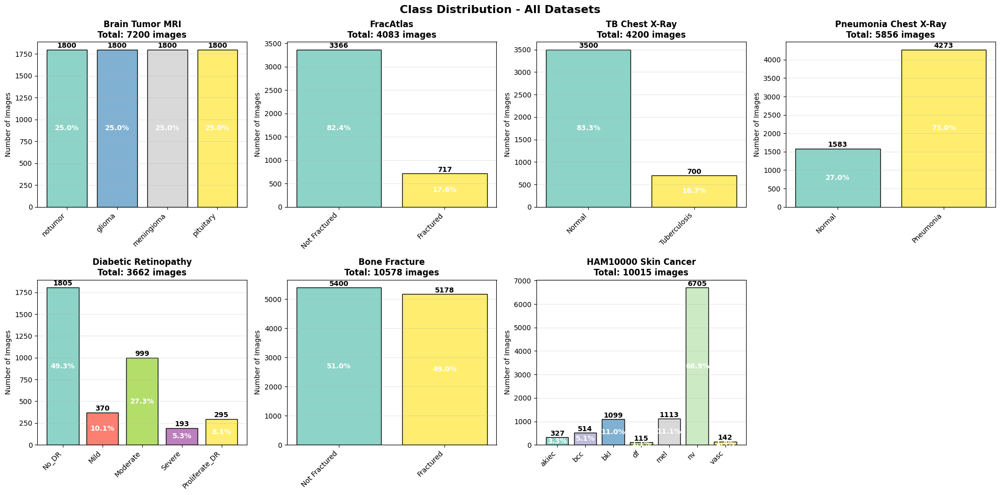


📈 Plot 3: Class Imbalance Analysis


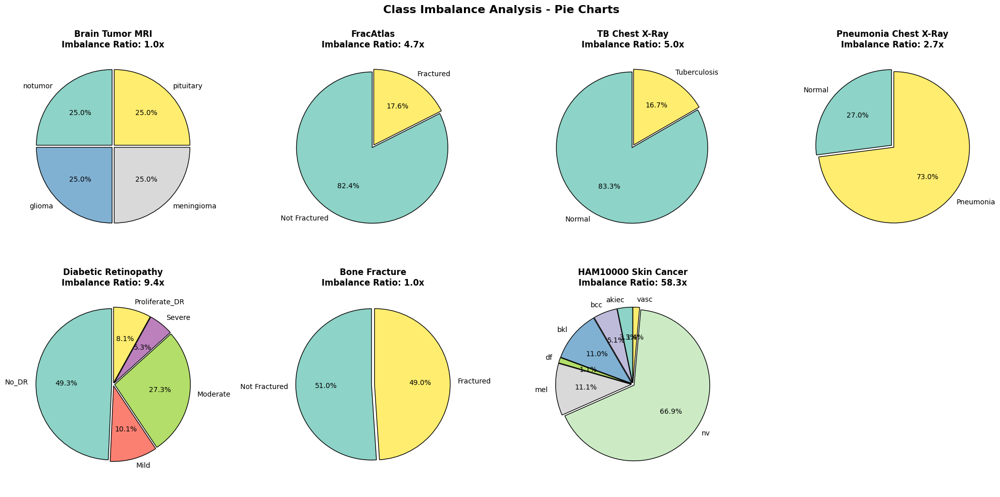


📈 Plot 4: Image Statistics


libpng warning: bKGD: invalid
Premature end of JPEG file


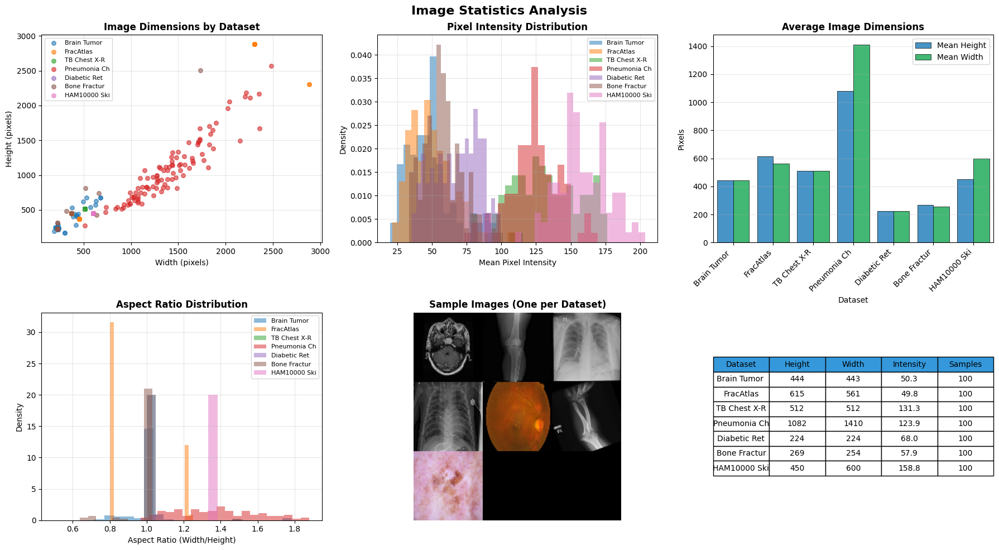


📈 Plot 5: Data Quality Check


Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file
Premature end of JPEG file


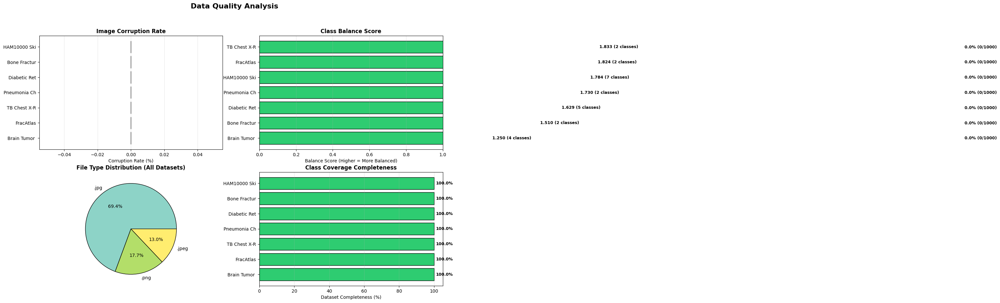


📈 Plot 6: Dataset Statistics Summary


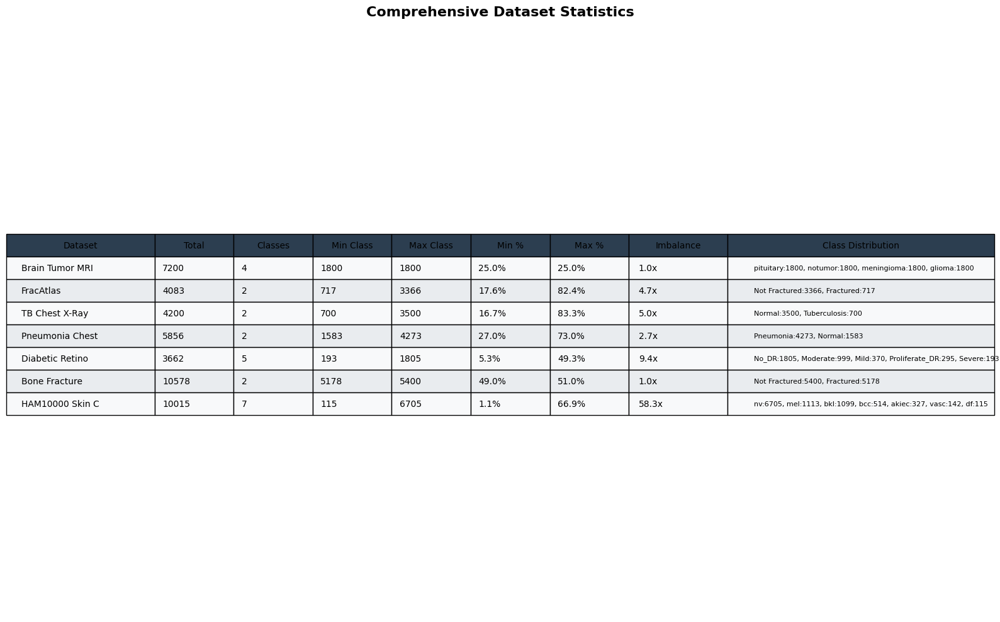


📈 Plot 7: Comparative Analysis Dashboard


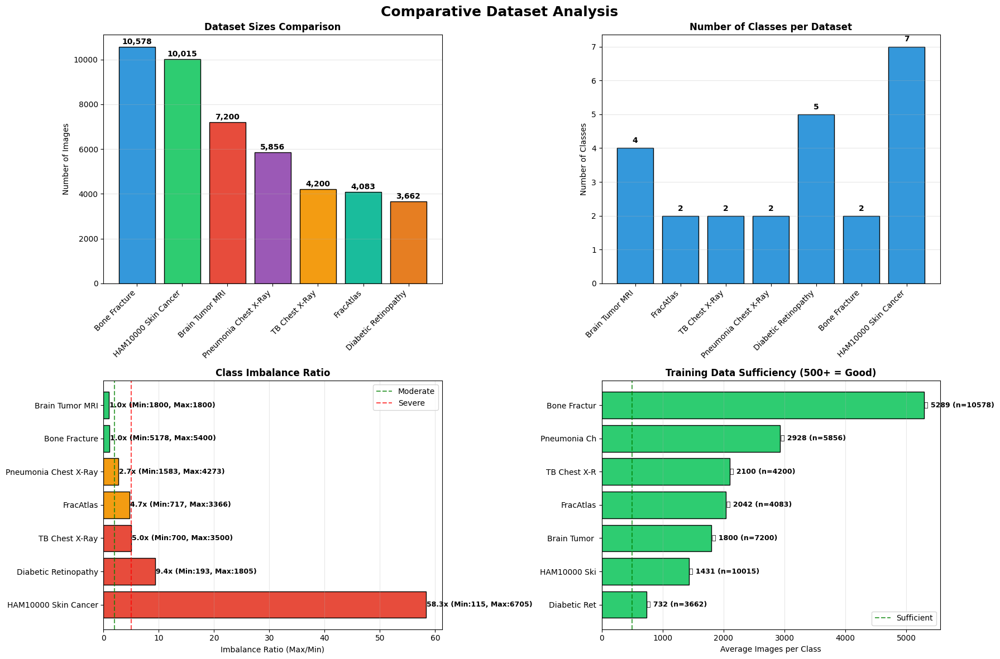


✅ ALL EDA PLOTS GENERATED SUCCESSFULLY!
📁 Location: /kaggle/working/plots/EDA

📊 Generated Plots:
   1. dataset_overview.png - Overall dataset dashboard
   2. class_distributions.png - Individual dataset class distributions
   3. imbalance_analysis.png - Class imbalance pie charts
   4. image_statistics.png - Image dimensions and pixel statistics
   5. data_quality.png - Data quality metrics
   6. statistics_summary.png - Comprehensive statistics table
   7. comparative_analysis.png - Comparative analysis dashboard

📊 SUMMARY STATISTICS:
--------------------------------------------------------------------------------
Total Images: 45,594
Total Classes: 24
Average Images per Dataset: 6513
Datasets: 7

📥 To download all plots, run the zip download cell.


In [8]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  COMPLETE EDA - DATA DISTRIBUTION, STATISTICS & VISUALIZATION                  ║
# ║  For all 7 datasets: Brain Tumor, FracAtlas, TB Chest, Pneumonia,              ║
# ║  Diabetic Retinopathy, Bone Fracture, HAM10000 Skin Cancer                     ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import os, random, warnings
from pathlib import Path
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings('ignore')

# Setup
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

OUTDIR = Path('/kaggle/working')
EDADIR = OUTDIR / 'plots/EDA'
EDADIR.mkdir(exist_ok=True)

BASE_PATH = '/kaggle/input/datasets/bhagawati4204/daataasets'
VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}

# Dataset configurations
DATASET_CONFIGS = {
    'brain_tumor': {
        'name': 'Brain Tumor MRI',
        'class_names': ['notumor', 'glioma', 'meningioma', 'pituitary'],
        'path': f'{BASE_PATH}/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset',
        'color': '#3498db'
    },
    'fracatlas': {
        'name': 'FracAtlas',
        'class_names': ['Not Fractured', 'Fractured'],
        'path': f'{BASE_PATH}/Fracture Dataset/Fracture Dataset/FracAtlas/images',
        'color': '#2ecc71'
    },
    'tb_chest': {
        'name': 'TB Chest X-Ray',
        'class_names': ['Normal', 'Tuberculosis'],
        'path': f'{BASE_PATH}/Tuberculosis (TB) Chest X-ray Database/Tuberculosis (TB) Chest X-ray Database/TB_Chest_Radiography_Database',
        'color': '#e74c3c'
    },
    'pneumonia': {
        'name': 'Pneumonia Chest X-Ray',
        'class_names': ['Normal', 'Pneumonia'],
        'path': f'{BASE_PATH}/Chest X-Ray Images (Pneumonia)/Chest X-Ray Images (Pneumonia)/chest_xray',
        'color': '#9b59b6'
    },
    'diabetic_retinopathy': {
        'name': 'Diabetic Retinopathy',
        'class_names': ['No_DR', 'Mild', 'Moderate', 'Severe', 'Proliferate_DR'],
        'path': f'{BASE_PATH}/Diabetic Retinopathy 224x224 (2019 Data)/Diabetic Retinopathy 224x224 (2019 Data)/colored_images',
        'color': '#f39c12'
    },
    'bone_fracture': {
        'name': 'Bone Fracture',
        'class_names': ['Not Fractured', 'Fractured'],
        'path': f'{BASE_PATH}/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification',
        'color': '#1abc9c'
    },
    'ham10000': {
        'name': 'HAM10000 Skin Cancer',
        'class_names': ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc'],
        'path': f'{BASE_PATH}/skin cancer/skin cancer',
        'color': '#e67e22'
    }
}

print("="*80)
print("📊 EXPLORATORY DATA ANALYSIS - ALL 7 DATASETS")
print("="*80)

# ─── 1. DATA LOADING FUNCTIONS ────────────────────────────────────────────────────

def load_dataset_samples(dataset_name, config):
    """Load all samples for a dataset with class labels"""
    samples = []
    base_path = Path(config['path'])
    class_names = config['class_names']
    
    if not base_path.exists():
        print(f"⚠️ Path not found: {base_path}")
        return samples
    
    print(f"\n📂 Loading {config['name']}...")
    
    # Brain Tumor
    if dataset_name == 'brain_tumor':
        for split in ['Training', 'Testing']:
            split_path = base_path / split
            if not split_path.exists():
                split_path = base_path / split.lower()
            if not split_path.exists():
                continue
            print(f"   Loading from: {split_path}")
            for class_dir in split_path.iterdir():
                if not class_dir.is_dir():
                    continue
                dir_name = class_dir.name.lower().replace('_', '')
                matched_class = None
                for cls in class_names:
                    if cls in dir_name or dir_name in cls:
                        matched_class = cls
                        break
                if matched_class is None:
                    continue
                count = 0
                for ext in ['.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG']:
                    for p in class_dir.rglob(f'*{ext}'):
                        samples.append((str(p), matched_class))
                        count += 1
                print(f"   {matched_class}: {count} images")
        return samples
    
    # ==================== FRACATLAS ====================
    elif dataset_name == 'fracatlas':
        print("   Scanning for FracAtlas images...")
        image_extensions = {'.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG', '.bmp', '.tiff'}
        
        class_folders = {}
        for item in base_path.iterdir():
            if item.is_dir():
                name_lower = item.name.lower()
                print(f"   Found folder: {item.name}")
                if 'fractured' in name_lower and 'not' not in name_lower and 'non' not in name_lower:
                    class_folders['Fractured'] = item
                elif 'not' in name_lower or 'non_fractured' in name_lower or 'normal' in name_lower or 'healthy' in name_lower:
                    class_folders['Not Fractured'] = item
        
        if class_folders:
            print(f"   Found class folders: {list(class_folders.keys())}")
            for class_name, folder_path in class_folders.items():
                count = 0
                for ext in image_extensions:
                    for img_path in folder_path.rglob(f'*{ext}'):
                        samples.append((str(img_path), class_name))
                        count += 1
                print(f"   {class_name}: {count} images")
        
        if not samples:
            print("   No class folders found, inferring from path...")
            for root, dirs, files in os.walk(base_path):
                current_dir = os.path.basename(root).lower()
                if 'fractured' in current_dir and 'not' not in current_dir and 'non' not in current_dir:
                    class_name = 'Fractured'
                elif 'not' in current_dir or 'non_fractured' in current_dir or 'normal' in current_dir or 'healthy' in current_dir:
                    class_name = 'Not Fractured'
                else:
                    class_name = None
                    path_parts = Path(root).parts
                    for part in reversed(path_parts):
                        part_lower = part.lower()
                        if 'fractured' in part_lower and 'not' not in part_lower and 'non' not in part_lower:
                            class_name = 'Fractured'
                            break
                        elif 'not' in part_lower or 'non_fractured' in part_lower or 'normal' in part_lower or 'healthy' in part_lower:
                            class_name = 'Not Fractured'
                            break
                
                if class_name is None:
                    continue
                
                for file in files:
                    if any(file.endswith(ext) for ext in image_extensions):
                        samples.append((os.path.join(root, file), class_name))
        
        if samples:
            print(f"   ✅ Loaded {len(samples)} FracAtlas images")
            class_counts = Counter([s[1] for s in samples])
            for cls, count in class_counts.items():
                print(f"   {cls}: {count}")
        return samples
    
    # ==================== BONE FRACTURE - COMPLETELY FIXED ====================
     
    elif dataset_name == 'bone_fracture':
        print("   Scanning for Bone Fracture images...")
        image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}
        
        # First, check if there are direct class folders
        class_folders = {}
        for item in base_path.iterdir():
            if item.is_dir():
                folder_name = item.name
                folder_lower = folder_name.lower()
                print(f"   Found folder: {folder_name}")
                
                # Check if this is a class folder
                if 'non_fractured' in folder_lower or 'nonfractured' in folder_lower:
                    class_folders['Not Fractured'] = item
                elif 'fractured' in folder_lower:
                    class_folders['Fractured'] = item
        
        # Load images from class folders
        if class_folders:
            print(f"\n   Found class folders: {list(class_folders.keys())}")
            for class_name, folder_path in class_folders.items():
                count = 0
                for ext in image_extensions:
                    for img_path in folder_path.rglob(f'*{ext}'):
                        samples.append((str(img_path), class_name))
                        count += 1
                print(f"   {class_name}: {count} images")
        else:
            print("   ⚠️ No direct class folders found!")
            print("   Checking for train/val/test splits...")
            
            # Fallback: Check train/val/test splits
            for split_name in ['train', 'val', 'test']:
                split_path = base_path / split_name
                if not split_path.exists():
                    continue
                
                print(f"   Found split: {split_name}")
                for class_dir in split_path.iterdir():
                    if not class_dir.is_dir():
                        continue
                    
                    folder_name = class_dir.name
                    folder_lower = folder_name.lower()
                    
                    if 'non_fractured' in folder_lower or 'nonfractured' in folder_lower:
                        cname = 'Not Fractured'
                    elif 'fractured' in folder_lower:
                        cname = 'Fractured'
                    else:
                        continue
                    
                    count = 0
                    for ext in image_extensions:
                        for img_path in class_dir.rglob(f'*{ext}'):
                            samples.append((str(img_path), cname))
                            count += 1
                    print(f"      {split_name}/{cname}: {count} images")
        
        # If still no samples, try to find any images and infer class from path
        if not samples:
            print("\n   Scanning all directories for images...")
            for ext in image_extensions:
                for img_path in base_path.rglob(f'*{ext}'):
                    # Try to determine class from path
                    path_str = str(img_path).lower()
                    if 'non_fractured' in path_str or 'nonfractured' in path_str:
                        samples.append((str(img_path), 'Not Fractured'))
                    elif 'fractured' in path_str:
                        samples.append((str(img_path), 'Fractured'))
                    else:
                        # Check parent folder
                        parent = img_path.parent.name.lower()
                        if 'non_fractured' in parent or 'nonfractured' in parent:
                            samples.append((str(img_path), 'Not Fractured'))
                        elif 'fractured' in parent:
                            samples.append((str(img_path), 'Fractured'))
                        else:
                            # Default based on containing folder
                            if 'fracture' in path_str:
                                samples.append((str(img_path), 'Fractured'))
                            else:
                                samples.append((str(img_path), 'Not Fractured'))
        
        # Summary
        if samples:
            print(f"\n   ✅ Loaded {len(samples)} Bone Fracture images")
            class_counts = Counter([s[1] for s in samples])
            for cls, count in class_counts.items():
                print(f"   {cls}: {count}")
            
            # Show sample paths for verification
            print("\n   📸 Sample paths:")
            for img_path, cls in samples[:5]:
                print(f"      {cls}: {Path(img_path).name}")
        else:
            print(f"\n   ❌ No images found!")
        
        return samples
    # ==================== TB CHEST ====================
    elif dataset_name == 'tb_chest':
        for folder in base_path.iterdir():
            if folder.is_dir():
                fn = folder.name.lower()
                if 'tb_normal' in fn:
                    cname = 'Normal'
                elif 'tb' in fn or 'tuberculosis' in fn:
                    cname = 'Tuberculosis'
                else:
                    continue
                count = 0
                for ext in ['.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG']:
                    for p in folder.rglob(f'*{ext}'):
                        samples.append((str(p), cname))
                        count += 1
                print(f"   {cname}: {count} images")
    
    # ==================== PNEUMONIA ====================
    elif dataset_name == 'pneumonia':
        for split in ['train', 'test', 'val']:
            split_path = base_path / split
            if not split_path.exists():
                continue
            print(f"   Loading from: {split_path}")
            for folder in split_path.iterdir():
                if folder.is_dir():
                    fn = folder.name.lower()
                    if 'normal_pneumonia' in fn:
                        cname = 'Normal'
                    elif 'pneumonia' in fn:
                        cname = 'Pneumonia'
                    else:
                        continue
                    count = 0
                    for ext in ['.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG']:
                        for p in folder.glob(f'*{ext}'):
                            samples.append((str(p), cname))
                            count += 1
                    print(f"   {cname}: {count} images")
    
    # ==================== DIABETIC RETINOPATHY ====================
    elif dataset_name == 'diabetic_retinopathy':
        folder_to_class = {
            '0': 'No_DR', '1': 'Mild', '2': 'Moderate', '3': 'Severe', '4': 'Proliferate_DR',
            'No_DR': 'No_DR', 'Mild': 'Mild', 'Moderate': 'Moderate',
            'Severe': 'Severe', 'Proliferate_DR': 'Proliferate_DR'
        }
        for folder in base_path.iterdir():
            if folder.is_dir():
                folder_name = folder.name.strip()
                cname = folder_to_class.get(folder_name, None)
                if cname is None:
                    for key in folder_to_class:
                        if key in folder_name:
                            cname = folder_to_class[key]
                            break
                if cname is None:
                    continue
                count = 0
                for ext in ['.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG']:
                    for p in folder.glob(f'*{ext}'):
                        samples.append((str(p), cname))
                        count += 1
                print(f"   {cname}: {count} images")
    
    # ==================== HAM10000 ====================
    elif dataset_name == 'ham10000':
        metadata_file = None
        for csv_file in base_path.glob('*.csv'):
            if 'metadata' in csv_file.name.lower() or 'HAM10000_metadata' in csv_file.name:
                metadata_file = csv_file
                break
        
        if metadata_file:
            df = pd.read_csv(metadata_file)
            img_paths = {}
            for ext in ['.jpg', '.png', '.jpeg', '.JPG', '.PNG', '.JPEG']:
                for p in base_path.rglob(f'*{ext}'):
                    img_paths[p.stem] = str(p)
            for _, row in df.iterrows():
                img_id = row['image_id'] if 'image_id' in row else row.get('ImageID', '')
                label = row['dx'] if 'dx' in row else row.get('label', '')
                if img_id in img_paths and label in class_names:
                    samples.append((img_paths[img_id], label))
            print(f"   Loaded {len(samples)} images from metadata")
        else:
            print(f"⚠️ No metadata file found for HAM10000")
    
    if samples:
        print(f"✅ Total: {len(samples)} samples for {dataset_name}")
        class_counts = Counter([s[1] for s in samples])
        for cls, count in class_counts.items():
            print(f"   {cls}: {count}")
    else:
        print(f"⚠️ No samples loaded for {dataset_name}")
    
    return samples

# ─── 2. PLOT 1: Dataset Overview Dashboard ──────────────────────────────────────

print("\n📈 Plot 1: Dataset Overview Dashboard")

fig = plt.figure(figsize=(20, 12))
fig.suptitle('Medical Image Datasets - Overview Dashboard', fontsize=20, fontweight='bold', y=0.98)

# Collect data for all datasets
dataset_stats = {}
all_samples_by_dataset = {}

for idx, (name, config) in enumerate(DATASET_CONFIGS.items()):
    samples = load_dataset_samples(name, config)
    all_samples_by_dataset[name] = samples
    
    if samples:
        class_counts = Counter([s[1] for s in samples])
        dataset_stats[name] = {
            'total': len(samples),
            'classes': class_counts,
            'num_classes': len(config['class_names'])
        }

# Subplot 1: Total Images per Dataset
ax1 = plt.subplot(2, 3, 1)
names = [DATASET_CONFIGS[n]['name'] for n in dataset_stats.keys()]
totals = [stats['total'] for stats in dataset_stats.values()]
colors = [DATASET_CONFIGS[n]['color'] for n in dataset_stats.keys()]
bars = ax1.barh(names, totals, color=colors, edgecolor='black', linewidth=1)
ax1.set_xlabel('Number of Images', fontsize=11)
ax1.set_title('Total Images per Dataset', fontsize=13, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)
for bar, val in zip(bars, totals):
    ax1.text(val + 50, bar.get_y() + bar.get_height()/2, f'{val:,}', va='center', fontweight='bold')

# Subplot 2: Class Distribution Summary
ax2 = plt.subplot(2, 3, 2)
class_counts_all = []
for name, stats in dataset_stats.items():
    for cls, count in stats['classes'].items():
        class_counts_all.append({
            'Dataset': DATASET_CONFIGS[name]['name'][:12],
            'Class': cls[:6] if len(cls) > 6 else cls,
            'Count': count
        })
df_classes = pd.DataFrame(class_counts_all)
sns.barplot(data=df_classes, x='Count', y='Class', hue='Dataset', ax=ax2, 
            palette='Set2', dodge=True, edgecolor='black', linewidth=0.5)
ax2.set_title('Class Distribution by Dataset', fontsize=13, fontweight='bold')
ax2.set_xlabel('Number of Images')
ax2.legend(loc='lower right', fontsize=8)
ax2.grid(axis='x', alpha=0.3)

# Subplot 3: Number of Classes
ax3 = plt.subplot(2, 3, 3)
num_classes = [stats['num_classes'] for stats in dataset_stats.values()]
ax3.bar(names, num_classes, color=colors, edgecolor='black', linewidth=1)
ax3.set_ylabel('Number of Classes', fontsize=11)
ax3.set_title('Classes per Dataset', fontsize=13, fontweight='bold')
ax3.grid(axis='y', alpha=0.3)
for bar, val in zip(bars, num_classes):
    ax3.text(bar.get_x() + bar.get_width()/2, val + 0.1, str(val), 
             ha='center', va='bottom', fontweight='bold')

# Subplot 4: Class Balance Heatmap
ax4 = plt.subplot(2, 3, 4)
max_classes = max([stats['num_classes'] for stats in dataset_stats.values()])
heatmap_data = np.zeros((len(dataset_stats), max_classes))
dataset_names_list = []
for i, (name, stats) in enumerate(dataset_stats.items()):
    dataset_names_list.append(DATASET_CONFIGS[name]['name'][:12])
    class_names = DATASET_CONFIGS[name]['class_names']
    for j, cls in enumerate(class_names):
        heatmap_data[i, j] = stats['classes'].get(cls, 0) / stats['total'] * 100

im = ax4.imshow(heatmap_data, cmap='YlOrRd', aspect='auto', vmin=0, vmax=100)
ax4.set_xticks(range(max_classes))
ax4.set_xticklabels([f'C{j+1}' for j in range(max_classes)])
ax4.set_yticks(range(len(dataset_names_list)))
ax4.set_yticklabels(dataset_names_list)
ax4.set_title('Class Balance Heatmap (% of total)', fontsize=13, fontweight='bold')
plt.colorbar(im, ax=ax4, label='Percentage')

# Subplot 5: Dataset Size Comparison
ax5 = plt.subplot(2, 3, 5)
df_sizes = pd.DataFrame([(DATASET_CONFIGS[n]['name'], stats['total']) 
                         for n, stats in dataset_stats.items()], 
                        columns=['Dataset', 'Size'])
df_sizes = df_sizes.sort_values('Size', ascending=False)
pie_colors = [DATASET_CONFIGS[n]['color'] for n in dataset_stats.keys()]
ax5.pie(df_sizes['Size'], labels=df_sizes['Dataset'], autopct='%1.1f%%', 
        colors=pie_colors, startangle=90, wedgeprops={'edgecolor': 'black', 'linewidth': 1},
        textprops={'fontsize': 10, 'fontweight': 'bold'})
ax5.set_title('Dataset Size Distribution', fontsize=13, fontweight='bold')

# Subplot 6: Summary Statistics Table
ax6 = plt.subplot(2, 3, 6)
ax6.axis('tight')
ax6.axis('off')

table_data = []
for name, stats in dataset_stats.items():
    class_str = ', '.join([f'{cls}: {count}' for cls, count in stats['classes'].items()])
    table_data.append([
        DATASET_CONFIGS[name]['name'][:15],
        stats['total'],
        stats['num_classes'],
        class_str[:30] + '...' if len(class_str) > 30 else class_str
    ])

table = ax6.table(cellText=table_data, 
                  colLabels=['Dataset', 'Total', 'Classes', 'Distribution'],
                  cellLoc='left', loc='center',
                  colColours=['#3498db']*4,
                  colWidths=[0.25, 0.15, 0.15, 0.45])
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.0, 1.5)

# Color rows
for i in range(len(table_data)):
    for j in range(4):
        table[(i+1, j)].set_facecolor('#f8f9fa' if i % 2 == 0 else '#e9ecef')

plt.tight_layout()
plt.savefig(EDADIR / '1_dataset_overview.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── 3. PLOT 2: Individual Dataset Distributions ─────────────────────────────────

print("\n📈 Plot 2: Individual Dataset Class Distributions")

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for idx, (name, config) in enumerate(DATASET_CONFIGS.items()):
    if idx >= 8:
        break
    ax = axes[idx]
    
    samples = all_samples_by_dataset.get(name, [])
    if not samples:
        ax.text(0.5, 0.5, 'No Data', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(config['name'])
        continue
    
    class_counts = Counter([s[1] for s in samples])
    class_names = config['class_names']
    counts = [class_counts.get(cls, 0) for cls in class_names]
    
    # Create bar chart with colors
    colors_bar = plt.cm.Set3(np.linspace(0, 1, len(class_names)))
    bars = ax.bar(class_names, counts, color=colors_bar, edgecolor='black', linewidth=1)
    ax.set_title(f"{config['name']}\nTotal: {len(samples)} images", fontweight='bold')
    ax.set_ylabel('Number of Images')
    ax.set_xticklabels(class_names, rotation=45, ha='right')
    ax.grid(axis='y', alpha=0.3)
    
    # Add value labels
    for bar, count in zip(bars, counts):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5, 
                str(count), ha='center', va='bottom', fontweight='bold')
    
    # Add percentage labels
    for bar, count in zip(bars, counts):
        if len(samples) > 0:
            pct = count / len(samples) * 100
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()/2, 
                    f'{pct:.1f}%', ha='center', va='center', color='white', fontweight='bold')

# Hide unused subplots
for idx in range(len(DATASET_CONFIGS), 8):
    axes[idx].axis('off')

plt.suptitle('Class Distribution - All Datasets', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(EDADIR / '2_class_distributions.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── 4. PLOT 3: Imbalance Analysis ──────────────────────────────────────────────

print("\n📈 Plot 3: Class Imbalance Analysis")

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for idx, (name, config) in enumerate(DATASET_CONFIGS.items()):
    if idx >= 8:
        break
    ax = axes[idx]
    
    samples = all_samples_by_dataset.get(name, [])
    if not samples:
        ax.text(0.5, 0.5, 'No Data', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(config['name'])
        continue
    
    class_counts = Counter([s[1] for s in samples])
    class_names = config['class_names']
    counts = [class_counts.get(cls, 0) for cls in class_names]
    
    # Calculate imbalance ratio
    if counts:
        max_count = max(counts) if counts else 1
        min_count = min([c for c in counts if c > 0]) if counts else 1
        imbalance_ratio = max_count / min_count if min_count > 0 else 1
        
        # Create pie chart with explode for minority classes
        explode = [0.05 if count < max_count * 0.3 else 0 for count in counts]
        colors_pie = plt.cm.Set3(np.linspace(0, 1, len(class_names)))
        
        # Filter out zero counts for pie chart
        non_zero = [(cls, cnt) for cls, cnt in zip(class_names, counts) if cnt > 0]
        if non_zero:
            cls_names, cls_counts = zip(*non_zero)
            wedges, texts, autotexts = ax.pie(cls_counts, labels=cls_names, 
                                              autopct='%1.1f%%', colors=colors_pie[:len(cls_counts)],
                                              explode=[0.02]*len(cls_counts), startangle=90,
                                              wedgeprops={'edgecolor': 'black', 'linewidth': 1})
            ax.set_title(f"{config['name']}\nImbalance Ratio: {imbalance_ratio:.1f}x", fontweight='bold')
        else:
            ax.text(0.5, 0.5, 'No Data', ha='center', va='center', transform=ax.transAxes)

# Hide unused subplots
for idx in range(len(DATASET_CONFIGS), 8):
    axes[idx].axis('off')

plt.suptitle('Class Imbalance Analysis - Pie Charts', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(EDADIR / '3_imbalance_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── 5. PLOT 4: Image Statistics (Dimensions, Pixel Intensity) ──────────────────

print("\n📈 Plot 4: Image Statistics")

# Sample images from each dataset
sample_stats = {}
for name, config in DATASET_CONFIGS.items():
    samples = all_samples_by_dataset.get(name, [])
    if not samples:
        continue
    
    # Sample up to 100 images per dataset
    sample_indices = np.random.choice(len(samples), min(100, len(samples)), replace=False)
    heights, widths, pixel_means = [], [], []
    
    for idx in sample_indices:
        img_path = samples[idx][0]
        try:
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is not None:
                h, w = img.shape
                heights.append(h)
                widths.append(w)
                pixel_means.append(np.mean(img))
        except:
            continue
    
    sample_stats[name] = {
        'heights': heights,
        'widths': widths,
        'pixel_means': pixel_means,
        'num_samples': len(heights)
    }

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Plot 4a: Image Dimensions
ax1 = axes[0, 0]
for name, stats in sample_stats.items():
    if stats['heights']:
        ax1.scatter(stats['widths'], stats['heights'], 
                   label=DATASET_CONFIGS[name]['name'][:12], alpha=0.6, s=30)
ax1.set_xlabel('Width (pixels)')
ax1.set_ylabel('Height (pixels)')
ax1.set_title('Image Dimensions by Dataset', fontweight='bold')
ax1.legend(fontsize=8)
ax1.grid(True, alpha=0.3)

# Plot 4b: Pixel Intensity Distribution
ax2 = axes[0, 1]
for name, stats in sample_stats.items():
    if stats['pixel_means']:
        ax2.hist(stats['pixel_means'], bins=20, alpha=0.5, 
                label=DATASET_CONFIGS[name]['name'][:12], density=True)
ax2.set_xlabel('Mean Pixel Intensity')
ax2.set_ylabel('Density')
ax2.set_title('Pixel Intensity Distribution', fontweight='bold')
ax2.legend(fontsize=8)
ax2.grid(True, alpha=0.3)

# Plot 4c: Image Size Statistics
ax3 = axes[0, 2]
size_stats = []
for name, stats in sample_stats.items():
    if stats['heights']:
        size_stats.append({
            'Dataset': DATASET_CONFIGS[name]['name'][:12],
            'Mean Height': np.mean(stats['heights']),
            'Mean Width': np.mean(stats['widths']),
            'Total Pixels': np.mean(stats['heights']) * np.mean(stats['widths'])
        })
df_size = pd.DataFrame(size_stats)
if not df_size.empty:
    df_size_melted = df_size.melt(id_vars=['Dataset'], value_vars=['Mean Height', 'Mean Width'])
    sns.barplot(data=df_size_melted, x='Dataset', y='value', hue='variable', ax=ax3,
                palette=['#3498db', '#2ecc71'], edgecolor='black', linewidth=0.5)
    ax3.set_title('Average Image Dimensions', fontweight='bold')
    ax3.set_ylabel('Pixels')
    ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha='right')
    ax3.legend()
    ax3.grid(axis='y', alpha=0.3)

# Plot 4d: Aspect Ratio Distribution
ax4 = axes[1, 0]
for name, stats in sample_stats.items():
    if stats['heights'] and stats['widths']:
        aspect_ratios = np.array(stats['widths']) / np.array(stats['heights'])
        ax4.hist(aspect_ratios, bins=20, alpha=0.5, 
                label=DATASET_CONFIGS[name]['name'][:12], density=True)
ax4.set_xlabel('Aspect Ratio (Width/Height)')
ax4.set_ylabel('Density')
ax4.set_title('Aspect Ratio Distribution', fontweight='bold')
ax4.legend(fontsize=8)
ax4.grid(True, alpha=0.3)

# Plot 4e: Sample Images Grid
ax5 = axes[1, 1]
# Show one sample image from each dataset
sample_images = []
for name, config in DATASET_CONFIGS.items():
    samples = all_samples_by_dataset.get(name, [])
    if samples:
        img_path = samples[0][0]
        try:
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, (80, 80))
                sample_images.append(img)
        except:
            pass

if sample_images:
    # Create grid
    grid_size = int(np.ceil(np.sqrt(len(sample_images))))
    grid_img = np.zeros((grid_size * 80, grid_size * 80, 3), dtype=np.uint8)
    for i, img in enumerate(sample_images[:grid_size*grid_size]):
        row = i // grid_size
        col = i % grid_size
        grid_img[row*80:(row+1)*80, col*80:(col+1)*80] = img
    ax5.imshow(grid_img)
    ax5.set_title('Sample Images (One per Dataset)', fontweight='bold')
    ax5.axis('off')

# Plot 4f: Summary Statistics Table
ax6 = axes[1, 2]
ax6.axis('tight')
ax6.axis('off')

table_data = []
for name, stats in sample_stats.items():
    if stats['heights']:
        table_data.append([
            DATASET_CONFIGS[name]['name'][:12],
            f"{np.mean(stats['heights']):.0f}",
            f"{np.mean(stats['widths']):.0f}",
            f"{np.mean(stats['pixel_means']):.1f}",
            f"{stats['num_samples']}"
        ])

if table_data:
    table = ax6.table(cellText=table_data, 
                      colLabels=['Dataset', 'Height', 'Width', 'Intensity', 'Samples'],
                      cellLoc='center', loc='center',
                      colColours=['#3498db']*5)
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1.0, 1.5)

plt.suptitle('Image Statistics Analysis', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(EDADIR / '4_image_statistics.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── 6. PLOT 5: Data Quality Check ──────────────────────────────────────────────

print("\n📈 Plot 5: Data Quality Check")

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Plot 5a: Missing/Corrupted Images
ax1 = axes[0, 0]
corrupted_stats = []
for name, config in DATASET_CONFIGS.items():
    samples = all_samples_by_dataset.get(name, [])
    if not samples:
        continue
    
    corrupted = 0
    for img_path, _ in samples[:1000]:  # Check up to 1000 images
        try:
            img = cv2.imread(img_path)
            if img is None:
                corrupted += 1
        except:
            corrupted += 1
    
    corrupted_stats.append({
        'Dataset': config['name'][:12],
        'Corrupted': corrupted,
        'Checked': min(1000, len(samples)),
        'Rate': corrupted / min(1000, len(samples)) * 100
    })

df_corrupted = pd.DataFrame(corrupted_stats)
if not df_corrupted.empty:
    bars = ax1.barh(df_corrupted['Dataset'], df_corrupted['Rate'], 
                    color=['#2ecc71' if r < 5 else '#f39c12' if r < 10 else '#e74c3c' 
                           for r in df_corrupted['Rate']],
                    edgecolor='black', linewidth=1)
    ax1.set_xlabel('Corruption Rate (%)')
    ax1.set_title('Image Corruption Rate', fontweight='bold')
    ax1.grid(axis='x', alpha=0.3)
    for bar, rate, corrupted, checked in zip(bars, df_corrupted['Rate'], 
                                             df_corrupted['Corrupted'], df_corrupted['Checked']):
        ax1.text(rate + 0.5, bar.get_y() + bar.get_height()/2, 
                f'{rate:.1f}% ({corrupted}/{checked})', va='center', fontweight='bold', fontsize=9)

# Plot 5b: Class Balance Score
ax2 = axes[0, 1]
balance_scores = []
for name, config in DATASET_CONFIGS.items():
    samples = all_samples_by_dataset.get(name, [])
    if not samples:
        continue
    
    class_counts = Counter([s[1] for s in samples])
    counts = list(class_counts.values())
    if counts:
        # Gini coefficient as balance score (0 = perfect balance, 1 = extreme imbalance)
        sorted_counts = np.sort(counts)
        n = len(sorted_counts)
        gini = 1 - (2 * sum((i+1) * sorted_counts[i] for i in range(n)) / (n * sum(sorted_counts)))
        balance_score = 1 - gini  # Higher = more balanced
        
        balance_scores.append({
            'Dataset': config['name'][:12],
            'Balance Score': balance_score,
            'Num Classes': len(counts)
        })

df_balance = pd.DataFrame(balance_scores)
if not df_balance.empty:
    df_balance = df_balance.sort_values('Balance Score', ascending=True)
    bars = ax2.barh(df_balance['Dataset'], df_balance['Balance Score'],
                    color=['#2ecc71' if s >= 0.7 else '#f39c12' if s >= 0.5 else '#e74c3c' 
                           for s in df_balance['Balance Score']],
                    edgecolor='black', linewidth=1)
    ax2.set_xlabel('Balance Score (Higher = More Balanced)')
    ax2.set_title('Class Balance Score', fontweight='bold')
    ax2.set_xlim(0, 1)
    ax2.grid(axis='x', alpha=0.3)
    for bar, score, num_classes in zip(bars, df_balance['Balance Score'], 
                                        df_balance['Num Classes']):
        ax2.text(score + 0.02, bar.get_y() + bar.get_height()/2, 
                f'{score:.3f} ({num_classes} classes)', va='center', fontweight='bold', fontsize=9)

# Plot 5c: File Type Distribution
ax3 = axes[1, 0]
file_types = defaultdict(int)
for name, config in DATASET_CONFIGS.items():
    samples = all_samples_by_dataset.get(name, [])
    for img_path, _ in samples:
        ext = Path(img_path).suffix.lower()
        file_types[ext] += 1

if file_types:
    sorted_types = sorted(file_types.items(), key=lambda x: x[1], reverse=True)
    types, counts = zip(*sorted_types)
    colors_pie = plt.cm.Set3(np.linspace(0, 1, len(types)))
    ax3.pie(counts, labels=types, autopct='%1.1f%%', colors=colors_pie,
            wedgeprops={'edgecolor': 'black', 'linewidth': 1})
    ax3.set_title('File Type Distribution (All Datasets)', fontweight='bold')

# Plot 5d: Dataset Completeness
ax4 = axes[1, 1]
completeness = []
for name, config in DATASET_CONFIGS.items():
    samples = all_samples_by_dataset.get(name, [])
    if samples:
        class_counts = Counter([s[1] for s in samples])
        # Check if all expected classes are present
        expected = set(config['class_names'])
        present = set(class_counts.keys())
        missing = expected - present
        
        completeness.append({
            'Dataset': config['name'][:12],
            'Complete': len(present) / len(expected) * 100,
            'Missing': ', '.join(missing) if missing else 'None'
        })

df_complete = pd.DataFrame(completeness)
if not df_complete.empty:
    df_complete = df_complete.sort_values('Complete', ascending=True)
    bars = ax4.barh(df_complete['Dataset'], df_complete['Complete'],
                    color=['#2ecc71' if c == 100 else '#f39c12' if c >= 80 else '#e74c3c' 
                           for c in df_complete['Complete']],
                    edgecolor='black', linewidth=1)
    ax4.set_xlabel('Dataset Completeness (%)')
    ax4.set_title('Class Coverage Completeness', fontweight='bold')
    ax4.set_xlim(0, 105)
    ax4.grid(axis='x', alpha=0.3)
    for bar, complete, missing in zip(bars, df_complete['Complete'], df_complete['Missing']):
        label = f'{complete:.1f}%'
        if missing != 'None':
            label += f' (Missing: {missing})'
        ax4.text(complete + 1, bar.get_y() + bar.get_height()/2, 
                label, va='center', fontsize=9, fontweight='bold')

plt.suptitle('Data Quality Analysis', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(EDADIR / '5_data_quality.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── 7. PLOT 6: Dataset Statistics Summary Table ──────────────────────────────

print("\n📈 Plot 6: Dataset Statistics Summary")

fig, ax = plt.subplots(figsize=(16, 10))
ax.axis('tight')
ax.axis('off')

# Prepare comprehensive table
table_data = []
for name, config in DATASET_CONFIGS.items():
    samples = all_samples_by_dataset.get(name, [])
    if not samples:
        continue
    
    class_counts = Counter([s[1] for s in samples])
    counts = list(class_counts.values())
    total = sum(counts)
    min_class = min(counts) if counts else 0
    max_class = max(counts) if counts else 0
    imbalance_ratio = max_class / min_class if min_class > 0 else float('inf')
    
    # Calculate statistics
    table_data.append([
        config['name'][:15],
        len(samples),
        len(class_counts),
        min_class,
        max_class,
        f'{min_class/total*100:.1f}%',
        f'{max_class/total*100:.1f}%',
        f'{imbalance_ratio:.1f}x',
        ', '.join([f'{cls}:{count}' for cls, count in class_counts.most_common()])
    ])

columns = ['Dataset', 'Total', 'Classes', 'Min Class', 'Max Class', 
           'Min %', 'Max %', 'Imbalance', 'Class Distribution']

table = ax.table(cellText=table_data, colLabels=columns,
                 cellLoc='left', loc='center',
                 colColours=['#2c3e50']*len(columns),
                 colWidths=[0.15, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.10, 0.27])
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1.0, 1.8)

# Color rows
for i in range(len(table_data)):
    for j in range(len(columns)):
        table[(i+1, j)].set_facecolor('#f8f9fa' if i % 2 == 0 else '#e9ecef')
        if j == 8:  # Class distribution column
            table[(i+1, j)].set_text_props(fontsize=8)

ax.set_title('Comprehensive Dataset Statistics', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.savefig(EDADIR / '6_statistics_summary.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── 8. PLOT 7: Comparative Analysis Dashboard ──────────────────────────────────

print("\n📈 Plot 7: Comparative Analysis Dashboard")

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.suptitle('Comparative Dataset Analysis', fontsize=18, fontweight='bold')

# Plot 7a: Dataset Sizes Bar Chart
ax1 = axes[0, 0]
df_sizes = pd.DataFrame([(DATASET_CONFIGS[n]['name'], stats['total']) 
                         for n, stats in dataset_stats.items()], 
                        columns=['Dataset', 'Total'])
df_sizes = df_sizes.sort_values('Total', ascending=False)
colors_bar = [DATASET_CONFIGS[n]['color'] for n in dataset_stats.keys()]
bars = ax1.bar(df_sizes['Dataset'], df_sizes['Total'], color=colors_bar, edgecolor='black', linewidth=1)
ax1.set_ylabel('Number of Images')
ax1.set_title('Dataset Sizes Comparison', fontweight='bold')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')
ax1.grid(axis='y', alpha=0.3)
for bar, val in zip(bars, df_sizes['Total']):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50, 
             f'{val:,}', ha='center', va='bottom', fontweight='bold')

# Plot 7b: Number of Classes
ax2 = axes[0, 1]
num_classes = [stats['num_classes'] for stats in dataset_stats.values()]
dataset_names = [DATASET_CONFIGS[n]['name'] for n in dataset_stats.keys()]
bars = ax2.bar(dataset_names, num_classes, color='#3498db', edgecolor='black', linewidth=1)
ax2.set_ylabel('Number of Classes')
ax2.set_title('Number of Classes per Dataset', fontweight='bold')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right')
ax2.grid(axis='y', alpha=0.3)
for bar, val in zip(bars, num_classes):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1, 
             str(val), ha='center', va='bottom', fontweight='bold')

# Plot 7c: Imbalance Ratio
ax3 = axes[1, 0]
imbalance_ratios = []
for name, config in DATASET_CONFIGS.items():
    samples = all_samples_by_dataset.get(name, [])
    if samples:
        class_counts = Counter([s[1] for s in samples])
        counts = list(class_counts.values())
        if counts:
            min_class = min(counts)
            max_class = max(counts)
            ratio = max_class / min_class if min_class > 0 else float('inf')
            imbalance_ratios.append({
                'Dataset': config['name'],
                'Ratio': ratio,
                'Max': max_class,
                'Min': min_class
            })

df_imbalance = pd.DataFrame(imbalance_ratios)
if not df_imbalance.empty:
    df_imbalance = df_imbalance.sort_values('Ratio', ascending=False)
    colors_bar = ['#2ecc71' if r < 2 else '#f39c12' if r < 5 else '#e74c3c' for r in df_imbalance['Ratio']]
    bars = ax3.barh(df_imbalance['Dataset'], df_imbalance['Ratio'], color=colors_bar, edgecolor='black', linewidth=1)
    ax3.set_xlabel('Imbalance Ratio (Max/Min)')
    ax3.set_title('Class Imbalance Ratio', fontweight='bold')
    ax3.axvline(x=2, color='green', linestyle='--', alpha=0.7, label='Moderate')
    ax3.axvline(x=5, color='red', linestyle='--', alpha=0.7, label='Severe')
    ax3.grid(axis='x', alpha=0.3)
    ax3.legend()
    for bar, ratio, row in zip(bars, df_imbalance['Ratio'], df_imbalance.itertuples()):
        ax3.text(ratio + 0.1, bar.get_y() + bar.get_height()/2, 
                f'{ratio:.1f}x (Min:{row.Min}, Max:{row.Max})', 
                va='center', fontsize=9, fontweight='bold')

# Plot 7d: Training Data Availability
ax4 = axes[1, 1]
training_data = []
for name, config in DATASET_CONFIGS.items():
    samples = all_samples_by_dataset.get(name, [])
    if samples:
        class_counts = Counter([s[1] for s in samples])
        # Estimate if dataset has enough samples per class
        avg_per_class = len(samples) / len(class_counts)
        training_data.append({
            'Dataset': config['name'][:12],
            'Total': len(samples),
            'Avg per Class': avg_per_class,
            'Sufficient': avg_per_class >= 500
        })

df_training = pd.DataFrame(training_data)
if not df_training.empty:
    df_training = df_training.sort_values('Avg per Class', ascending=True)
    colors_bar = ['#2ecc71' if row.Sufficient else '#e74c3c' for row in df_training.itertuples()]
    bars = ax4.barh(df_training['Dataset'], df_training['Avg per Class'], 
                    color=colors_bar, edgecolor='black', linewidth=1)
    ax4.set_xlabel('Average Images per Class')
    ax4.set_title('Training Data Sufficiency (500+ = Good)', fontweight='bold')
    ax4.axvline(x=500, color='green', linestyle='--', alpha=0.7, label='Sufficient')
    ax4.grid(axis='x', alpha=0.3)
    ax4.legend()
    for bar, avg, total in zip(bars, df_training['Avg per Class'], df_training['Total']):
        status = '✅' if avg >= 500 else '⚠️'
        ax4.text(avg + 5, bar.get_y() + bar.get_height()/2, 
                f'{status} {avg:.0f} (n={total})', va='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig(EDADIR / '7_comparative_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── SUMMARY ──────────────────────────────────────────────────────────────────

print("\n" + "="*80)
print("✅ ALL EDA PLOTS GENERATED SUCCESSFULLY!")
print("="*80)
print(f"📁 Location: {EDADIR}")
print("\n📊 Generated Plots:")
print("   1. dataset_overview.png - Overall dataset dashboard")
print("   2. class_distributions.png - Individual dataset class distributions")
print("   3. imbalance_analysis.png - Class imbalance pie charts")
print("   4. image_statistics.png - Image dimensions and pixel statistics")
print("   5. data_quality.png - Data quality metrics")
print("   6. statistics_summary.png - Comprehensive statistics table")
print("   7. comparative_analysis.png - Comparative analysis dashboard")

# Print summary statistics
print("\n📊 SUMMARY STATISTICS:")
print("-"*80)
total_images = sum([stats['total'] for stats in dataset_stats.values()])
total_classes = sum([stats['num_classes'] for stats in dataset_stats.values()])
print(f"Total Images: {total_images:,}")
print(f"Total Classes: {total_classes}")
print(f"Average Images per Dataset: {total_images/len(dataset_stats):.0f}")
print(f"Datasets: {len(dataset_stats)}")

print("\n" + "="*80)
print("📥 To download all plots, run the zip download cell.")
print("="*80)

In [7]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  DOWNLOAD EDA PLOTS ONLY                                                       ║
# ║  Creates a zip file of the /plots/EDA directory only                           ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import os
import zipfile
from pathlib import Path
import datetime
from IPython.display import FileLink, display
import shutil

# ─── 1. DEFINE PATHS ──────────────────────────────────────────────────────────────

EDA_DIR = Path('/kaggle/working/plots/EDA')
OUTPUT_DIR = Path('/kaggle/working')

# Create timestamp for unique filename
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
zip_name = f'eda_plots_{timestamp}.zip'
zip_path = OUTPUT_DIR / zip_name

print("="*80)
print("📊 DOWNLOADING EDA PLOTS ONLY")
print("="*80)
print(f"📂 Source: {EDA_DIR}")
print(f"📁 Destination: {zip_path}")

# ─── 2. CHECK IF EDA DIRECTORY EXISTS ────────────────────────────────────────────

if not EDA_DIR.exists():
    print(f"\n❌ EDA directory not found: {EDA_DIR}")
    print("   Please run the EDA code first to generate plots.")
    
    # Check if EDA directory exists elsewhere
    alt_paths = [
        Path('/kaggle/working/eda_plots'),
        Path('/kaggle/working/EDA'),
        Path('/kaggle/working/plots/EDA'),
    ]
    
    for alt in alt_paths:
        if alt.exists():
            EDA_DIR = alt
            print(f"✅ Found alternative path: {EDA_DIR}")
            break
    else:
        print("\n❌ No EDA plots found. Please generate them first.")
        raise FileNotFoundError("EDA directory not found")

# ─── 3. COLLECT FILES ─────────────────────────────────────────────────────────────

print("\n📊 Scanning EDA directory...")

files_to_zip = []
total_size = 0

# Walk through all files in EDA directory
for file_path in EDA_DIR.rglob('*'):
    if file_path.is_file():
        # Get relative path for zip archive
        rel_path = file_path.relative_to(EDA_DIR.parent)
        files_to_zip.append((file_path, str(rel_path)))
        total_size += file_path.stat().st_size

if not files_to_zip:
    print("❌ No files found in EDA directory!")
    print(f"   Please check: {EDA_DIR}")
    raise FileNotFoundError("No files in EDA directory")

print(f"✅ Found {len(files_to_zip)} files")
print(f"📦 Total size: {total_size / (1024*1024):.2f} MB")

# ─── 4. LIST FILES ────────────────────────────────────────────────────────────────

print("\n📄 Files to be zipped:")
for file_path, arc_name in sorted(files_to_zip):
    size_kb = file_path.stat().st_size / 1024
    print(f"   - {arc_name} ({size_kb:.1f} KB)")

# ─── 5. CREATE ZIP FILE ──────────────────────────────────────────────────────────

print(f"\n📦 Creating zip file: {zip_name}")

# Remove existing zip if it exists
if zip_path.exists():
    os.remove(zip_path)
    print(f"✅ Removed existing {zip_name}")

# Create zip file with compression
with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for file_path, arc_name in tqdm(files_to_zip, desc="Compressing"):
        try:
            zipf.write(file_path, arc_name)
        except Exception as e:
            print(f"⚠️ Could not add {file_path.name}: {e}")

zip_size = zip_path.stat().st_size / (1024*1024)
print(f"\n✅ Created: {zip_name} ({zip_size:.2f} MB)")
print(f"📁 Files included: {len(files_to_zip)}")

# ─── 6. DISPLAY DOWNLOAD LINK ──────────────────────────────────────────────────

print("\n" + "="*80)
print("📥 DOWNLOAD EDA PLOTS")
print("="*80)

if zip_path.exists():
    display(FileLink(zip_path))
    print(f"\n📁 Click the link above to download: {zip_name}")
    print(f"📂 Location: {zip_path}")
    print(f"📦 Size: {zip_path.stat().st_size / (1024*1024):.2f} MB")
    
    # Also create individual file links
    print("\n" + "="*80)
    print("📎 INDIVIDUAL PLOT DOWNLOADS")
    print("="*80)
    for file_path, arc_name in files_to_zip:
        display(FileLink(file_path))
        
else:
    print("❌ Zip file not created!")

# ─── 7. SUMMARY ──────────────────────────────────────────────────────────────────

print("\n" + "="*80)
print("📊 EDA PLOTS SUMMARY")
print("="*80)

# Categorize plots
plot_categories = {
    'Overview Dashboard': [],
    'Class Distributions': [],
    'Imbalance Analysis': [],
    'Image Statistics': [],
    'Data Quality': [],
    'Statistics Summary': [],
    'Comparative Analysis': []
}

for file_path, arc_name in files_to_zip:
    name_lower = arc_name.lower()
    if 'overview' in name_lower:
        plot_categories['Overview Dashboard'].append(arc_name)
    elif 'class_distribution' in name_lower or 'class distribution' in name_lower:
        plot_categories['Class Distributions'].append(arc_name)
    elif 'imbalance' in name_lower:
        plot_categories['Imbalance Analysis'].append(arc_name)
    elif 'image_statistics' in name_lower or 'statistics' in name_lower:
        plot_categories['Image Statistics'].append(arc_name)
    elif 'quality' in name_lower or 'data_quality' in name_lower:
        plot_categories['Data Quality'].append(arc_name)
    elif 'summary' in name_lower:
        plot_categories['Statistics Summary'].append(arc_name)
    elif 'comparative' in name_lower:
        plot_categories['Comparative Analysis'].append(arc_name)
    else:
        plot_categories['Other'].append(arc_name)

for category, files in plot_categories.items():
    if files:
        print(f"\n📁 {category}:")
        for f in files:
            print(f"   - {f}")

print("\n" + "="*80)
print("✅ EDA PLOTS PACKAGE COMPLETE!")
print("="*80)

📊 DOWNLOADING EDA PLOTS ONLY
📂 Source: /kaggle/working/plots/EDA
📁 Destination: /kaggle/working/eda_plots_20260701_214637.zip

📊 Scanning EDA directory...
✅ Found 7 files
📦 Total size: 16.35 MB

📄 Files to be zipped:
   - EDA/1_dataset_overview.png (12853.0 KB)
   - EDA/2_class_distributions.png (687.5 KB)
   - EDA/3_imbalance_analysis.png (810.2 KB)
   - EDA/4_image_statistics.png (833.4 KB)
   - EDA/5_data_quality.png (561.9 KB)
   - EDA/6_statistics_summary.png (376.2 KB)
   - EDA/7_comparative_analysis.png (616.0 KB)

📦 Creating zip file: eda_plots_20260701_214637.zip


Compressing:   0%|          | 0/7 [00:00<?, ?it/s]


✅ Created: eda_plots_20260701_214637.zip (3.97 MB)
📁 Files included: 7

📥 DOWNLOAD EDA PLOTS


/kaggle/working/eda_plots_20260701_214637.zip


📁 Click the link above to download: eda_plots_20260701_214637.zip
📂 Location: /kaggle/working/eda_plots_20260701_214637.zip
📦 Size: 3.97 MB

📎 INDIVIDUAL PLOT DOWNLOADS


/kaggle/working/plots/EDA/5_data_quality.png

/kaggle/working/plots/EDA/1_dataset_overview.png

/kaggle/working/plots/EDA/7_comparative_analysis.png

/kaggle/working/plots/EDA/6_statistics_summary.png

/kaggle/working/plots/EDA/2_class_distributions.png

/kaggle/working/plots/EDA/3_imbalance_analysis.png

/kaggle/working/plots/EDA/4_image_statistics.png


📊 EDA PLOTS SUMMARY

📁 Overview Dashboard:
   - EDA/1_dataset_overview.png

📁 Class Distributions:
   - EDA/2_class_distributions.png

📁 Imbalance Analysis:
   - EDA/3_imbalance_analysis.png

📁 Image Statistics:
   - EDA/6_statistics_summary.png
   - EDA/4_image_statistics.png

📁 Data Quality:
   - EDA/5_data_quality.png

📁 Comparative Analysis:
   - EDA/7_comparative_analysis.png

✅ EDA PLOTS PACKAGE COMPLETE!


Device: cuda
📋 Class order: ['notumor', 'glioma', 'meningioma', 'pituitary']
📋 Number of classes: 4
✅ Model architecture loaded
🚀 RETRAINING BRAIN TUMOR MODEL

📂 Loading brain tumor data...
📂 Loading from: /kaggle/input/datasets/bhagawati4204/daataasets/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset/Training
   pituitary: 1400 images
   notumor: 1400 images
   meningioma: 1400 images
   glioma: 1400 images
📂 Loading from: /kaggle/input/datasets/bhagawati4204/daataasets/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset/Testing
   pituitary: 400 images
   notumor: 400 images
   meningioma: 400 images
   glioma: 400 images

✅ Total samples loaded: 7200

📊 Splitting data (70% train, 30% test)...
   Train: 5040
   Test: 2160

   Train distribution:
      notumor: 1260
      glioma: 1260
      meningioma: 1260
      pituitary: 1260

   Test distribution:
      notumor: 540
      glioma: 540
      meningioma: 540
      pituitary: 540

🏗️ Creating datasets...

🏗️ Creating model...
Downloading: 

100%|██████████| 338M/338M [00:02<00:00, 176MB/s]  


   Total params: 101,072,524
   Trainable params: 101,072,524

🔄 Starting training...


Epoch 1/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 1:
   Train Loss: 0.8061, Train Acc: 0.7712
   Test Loss: 0.5354, Test Acc: 0.9069, Test F1: 0.9062
   ✅ New best model! Accuracy: 0.9069, F1: 0.9062


Epoch 2/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 2:
   Train Loss: 0.5952, Train Acc: 0.8833
   Test Loss: 0.4777, Test Acc: 0.9449, Test F1: 0.9445
   ✅ New best model! Accuracy: 0.9449, F1: 0.9445


Epoch 3/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 3:
   Train Loss: 0.5516, Train Acc: 0.9054
   Test Loss: 0.4450, Test Acc: 0.9542, Test F1: 0.9539
   ✅ New best model! Accuracy: 0.9542, F1: 0.9539


Epoch 4/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 4:
   Train Loss: 0.5039, Train Acc: 0.9232
   Test Loss: 0.4202, Test Acc: 0.9694, Test F1: 0.9693
   ✅ New best model! Accuracy: 0.9694, F1: 0.9693


Epoch 5/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 5:
   Train Loss: 0.4832, Train Acc: 0.9389
   Test Loss: 0.4141, Test Acc: 0.9690, Test F1: 0.9689


Epoch 6/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 6:
   Train Loss: 0.4695, Train Acc: 0.9468
   Test Loss: 0.4012, Test Acc: 0.9759, Test F1: 0.9759
   ✅ New best model! Accuracy: 0.9759, F1: 0.9759


Epoch 7/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 7:
   Train Loss: 0.4544, Train Acc: 0.9530
   Test Loss: 0.3996, Test Acc: 0.9759, Test F1: 0.9759


Epoch 8/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 8:
   Train Loss: 0.4549, Train Acc: 0.9498
   Test Loss: 0.3976, Test Acc: 0.9792, Test F1: 0.9791
   ✅ New best model! Accuracy: 0.9792, F1: 0.9791


Epoch 9/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 9:
   Train Loss: 0.4388, Train Acc: 0.9571
   Test Loss: 0.3934, Test Acc: 0.9810, Test F1: 0.9810
   ✅ New best model! Accuracy: 0.9810, F1: 0.9810


Epoch 10/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 10:
   Train Loss: 0.4356, Train Acc: 0.9619
   Test Loss: 0.3937, Test Acc: 0.9810, Test F1: 0.9810


Epoch 11/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 11:
   Train Loss: 0.4523, Train Acc: 0.9546
   Test Loss: 0.4151, Test Acc: 0.9736, Test F1: 0.9737


Epoch 12/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 12:
   Train Loss: 0.4575, Train Acc: 0.9512
   Test Loss: 0.3924, Test Acc: 0.9782, Test F1: 0.9782


Epoch 13/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 13:
   Train Loss: 0.4559, Train Acc: 0.9550
   Test Loss: 0.4001, Test Acc: 0.9806, Test F1: 0.9806


Epoch 14/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 14:
   Train Loss: 0.4421, Train Acc: 0.9599
   Test Loss: 0.3931, Test Acc: 0.9824, Test F1: 0.9824
   ✅ New best model! Accuracy: 0.9824, F1: 0.9824


Epoch 15/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 15:
   Train Loss: 0.4372, Train Acc: 0.9625
   Test Loss: 0.3934, Test Acc: 0.9810, Test F1: 0.9810


Epoch 16/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 16:
   Train Loss: 0.4393, Train Acc: 0.9631
   Test Loss: 0.3818, Test Acc: 0.9856, Test F1: 0.9856
   ✅ New best model! Accuracy: 0.9856, F1: 0.9856


Epoch 17/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 17:
   Train Loss: 0.4294, Train Acc: 0.9675
   Test Loss: 0.3881, Test Acc: 0.9847, Test F1: 0.9847


Epoch 18/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 18:
   Train Loss: 0.4332, Train Acc: 0.9629
   Test Loss: 0.3928, Test Acc: 0.9806, Test F1: 0.9805


Epoch 19/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 19:
   Train Loss: 0.4173, Train Acc: 0.9706
   Test Loss: 0.3968, Test Acc: 0.9796, Test F1: 0.9796


Epoch 20/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 20:
   Train Loss: 0.4226, Train Acc: 0.9683
   Test Loss: 0.3940, Test Acc: 0.9796, Test F1: 0.9796


Epoch 21/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 21:
   Train Loss: 0.4032, Train Acc: 0.9794
   Test Loss: 0.3888, Test Acc: 0.9843, Test F1: 0.9842


Epoch 22/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 22:
   Train Loss: 0.4025, Train Acc: 0.9790
   Test Loss: 0.3939, Test Acc: 0.9819, Test F1: 0.9819


Epoch 23/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 23:
   Train Loss: 0.4004, Train Acc: 0.9790
   Test Loss: 0.3946, Test Acc: 0.9810, Test F1: 0.9810


Epoch 24/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 24:
   Train Loss: 0.3970, Train Acc: 0.9812
   Test Loss: 0.3925, Test Acc: 0.9824, Test F1: 0.9824


Epoch 25/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 25:
   Train Loss: 0.3970, Train Acc: 0.9813
   Test Loss: 0.3940, Test Acc: 0.9829, Test F1: 0.9829


Epoch 26/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 26:
   Train Loss: 0.3914, Train Acc: 0.9831
   Test Loss: 0.3905, Test Acc: 0.9843, Test F1: 0.9842


Epoch 27/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 27:
   Train Loss: 0.3901, Train Acc: 0.9823
   Test Loss: 0.3888, Test Acc: 0.9843, Test F1: 0.9842


Epoch 28/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 28:
   Train Loss: 0.3908, Train Acc: 0.9823
   Test Loss: 0.3886, Test Acc: 0.9852, Test F1: 0.9852


Epoch 29/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 29:
   Train Loss: 0.3942, Train Acc: 0.9835
   Test Loss: 0.3899, Test Acc: 0.9852, Test F1: 0.9852


Epoch 30/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 30:
   Train Loss: 0.3935, Train Acc: 0.9821
   Test Loss: 0.3895, Test Acc: 0.9852, Test F1: 0.9852


Epoch 31/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 31:
   Train Loss: 0.4126, Train Acc: 0.9726
   Test Loss: 0.3882, Test Acc: 0.9861, Test F1: 0.9861
   ✅ New best model! Accuracy: 0.9861, F1: 0.9861


Epoch 32/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 32:
   Train Loss: 0.4200, Train Acc: 0.9726
   Test Loss: 0.3964, Test Acc: 0.9810, Test F1: 0.9810


Epoch 33/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 33:
   Train Loss: 0.4144, Train Acc: 0.9716
   Test Loss: 0.3902, Test Acc: 0.9852, Test F1: 0.9852


Epoch 34/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 34:
   Train Loss: 0.4092, Train Acc: 0.9756
   Test Loss: 0.3862, Test Acc: 0.9856, Test F1: 0.9856


Epoch 35/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 35:
   Train Loss: 0.4100, Train Acc: 0.9742
   Test Loss: 0.3868, Test Acc: 0.9856, Test F1: 0.9857


Epoch 36/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 36:
   Train Loss: 0.3943, Train Acc: 0.9823
   Test Loss: 0.3910, Test Acc: 0.9847, Test F1: 0.9847


Epoch 37/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 37:
   Train Loss: 0.4060, Train Acc: 0.9772
   Test Loss: 0.3970, Test Acc: 0.9792, Test F1: 0.9791


Epoch 38/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 38:
   Train Loss: 0.4050, Train Acc: 0.9766
   Test Loss: 0.3833, Test Acc: 0.9866, Test F1: 0.9866
   ✅ New best model! Accuracy: 0.9866, F1: 0.9866


Epoch 39/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 39:
   Train Loss: 0.4049, Train Acc: 0.9776
   Test Loss: 0.3961, Test Acc: 0.9819, Test F1: 0.9820


Epoch 40/40:   0%|          | 0/158 [00:00<?, ?it/s]

Testing:   0%|          | 0/68 [00:00<?, ?it/s]


📊 Epoch 40:
   Train Loss: 0.3912, Train Acc: 0.9833
   Test Loss: 0.3858, Test Acc: 0.9861, Test F1: 0.9861

📊 FINAL EVALUATION


Final Testing:   0%|          | 0/68 [00:00<?, ?it/s]


🎯 FINAL RESULTS:
   Accuracy: 0.9866
   F1 Score: 0.9866
   Test samples: 2160

📊 Classification Report:
              precision    recall  f1-score   support

     notumor       0.99      0.99      0.99       540
      glioma       0.98      0.98      0.98       540
  meningioma       0.98      0.98      0.98       540
   pituitary       0.99      1.00      0.99       540

    accuracy                           0.99      2160
   macro avg       0.99      0.99      0.99      2160
weighted avg       0.99      0.99      0.99      2160



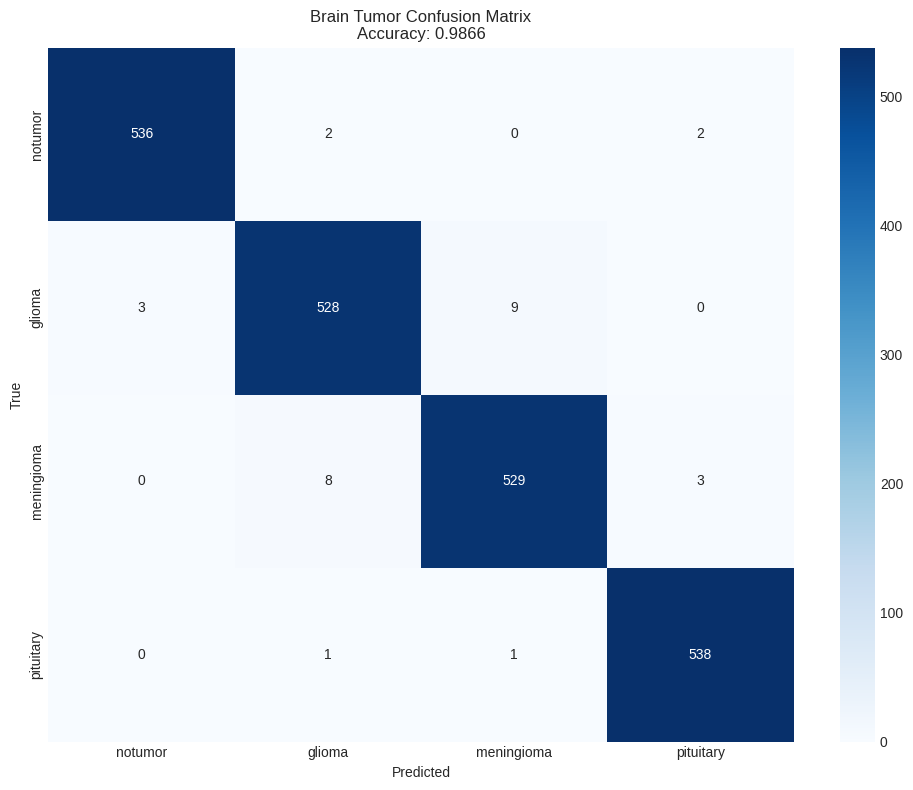

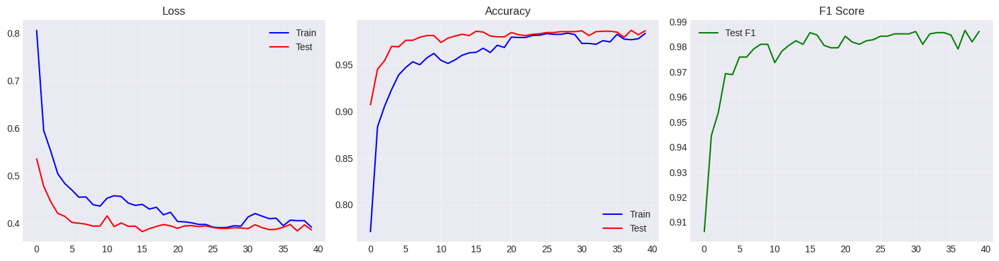


✅ Training complete!
   Best model saved to: /kaggle/working/checkpoints/best_model.pth
   Final Accuracy: 0.9866
   Final F1: 0.9866

✅ RETRAINING COMPLETE!
🎯 Final Test Accuracy: 0.9866
🎯 Final Test F1: 0.9866
📁 Model saved to: /kaggle/working/checkpoints/best_model.pth


In [50]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  RETRAIN BRAIN TUMOR MODEL - COMPLETE STANDALONE CODE                         ║
# ║  Using the EXACT class order from your training: ['notumor', 'glioma',         ║
# ║  'meningioma', 'pituitary']                                                    ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import os, time, random, copy, warnings
from pathlib import Path
from collections import Counter
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageFile
import cv2
from tqdm.auto import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.cuda.amp import GradScaler, autocast
import torchvision.models as models
import albumentations as A
from albumentations.pytorch import ToTensorV2
from einops import rearrange
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  SETUP                                                                          ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {DEVICE}")

OUTDIR = Path('/kaggle/working')
CKDIR = OUTDIR / 'checkpoints'
PLTDIR = OUTDIR / 'plots'
for d in [CKDIR, PLTDIR]:
    d.mkdir(exist_ok=True)

MEAN = (0.485, 0.456, 0.406)
STD = (0.229, 0.224, 0.225)
VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CLASS ORDER - MUST MATCH TRAINING                                              ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

CLASS_NAMES = ['notumor', 'glioma', 'meningioma', 'pituitary']
NUM_CLASSES = len(CLASS_NAMES)
IMG_SIZE = 224
BATCH_SIZE = 32

print(f"📋 Class order: {CLASS_NAMES}")
print(f"📋 Number of classes: {NUM_CLASSES}")

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  MODEL ARCHITECTURE                                                             ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

class DropPath(nn.Module):
    def __init__(self, drop_prob=0.0):
        super().__init__()
        self.drop_prob = drop_prob

    def forward(self, x):
        if self.drop_prob == 0.0 or not self.training:
            return x
        keep_prob = float(1.0 - self.drop_prob)
        random_mask = torch.rand((x.shape[0], 1, 1), dtype=torch.float32, device=x.device) * keep_prob
        return x * random_mask


class WindowAttention(nn.Module):
    def __init__(self, d_model, nhead, window_size=7, dropout=0.1):
        super().__init__()
        self.nhead, self.window_size, self.head_dim = nhead, window_size, d_model // nhead
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(d_model, d_model * 3)
        self.proj = nn.Linear(d_model, d_model)
        self.attn_drop = nn.Dropout(dropout)
        self.proj_drop = nn.Dropout(dropout)
        self.attn_weights = None

    def forward(self, x, H, W):
        B, N, C = x.shape
        x = x.reshape(B, H, W, C)

        pad_h = (self.window_size - H % self.window_size) % self.window_size
        pad_w = (self.window_size - W % self.window_size) % self.window_size
        if pad_h > 0 or pad_w > 0:
            x = F.pad(x, (0, 0, 0, pad_w, 0, pad_h))

        Hp, Wp = x.shape[1], x.shape[2]
        x = x.reshape(B, Hp // self.window_size, self.window_size, Wp // self.window_size, self.window_size, C)
        x = x.permute(0, 1, 3, 2, 4, 5).reshape(-1, self.window_size ** 2, C)

        qkv = self.qkv(x).reshape(-1, self.window_size ** 2, 3, self.nhead, self.head_dim).permute(2, 0, 3, 1, 4)
        attn = (qkv[0] @ qkv[1].transpose(-2, -1)) * self.scale
        attn = attn.softmax(dim=-1)
        self.attn_weights = attn.detach()

        x = self.proj_drop(self.proj((self.attn_drop(attn) @ qkv[2]).transpose(1, 2).reshape(-1, self.window_size ** 2, C)))
        x = x.reshape(B, Hp // self.window_size, Wp // self.window_size, self.window_size, self.window_size, C)
        x = x.permute(0, 1, 3, 2, 4, 5).reshape(B, Hp, Wp, C)

        return x[:, :H, :W, :].reshape(B, -1, C) if pad_h > 0 or pad_w > 0 else x.reshape(B, -1, C)


class TransformerBlockWithWindow(nn.Module):
    def __init__(self, d_model, nhead, ffn_dim, window_size=7, attn_drop=0.1, ffn_drop=0.1, drop_path=0.0):
        super().__init__()
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.global_attn = nn.MultiheadAttention(d_model, nhead, dropout=attn_drop, batch_first=True)
        self.window_attn = WindowAttention(d_model, nhead, window_size, attn_drop)
        self.gate = nn.Sequential(nn.Linear(d_model * 2, d_model), nn.Sigmoid())
        self.ffn = nn.Sequential(
            nn.Linear(d_model, ffn_dim), nn.GELU(), nn.Dropout(ffn_drop),
            nn.Linear(ffn_dim, d_model), nn.Dropout(ffn_drop)
        )
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.attn_weights = None
        self.window_attn_weights = None

    def forward(self, x, H, W):
        x_norm = self.norm1(x)
        global_out, global_attn = self.global_attn(x_norm, x_norm, x_norm, need_weights=True)
        self.attn_weights = global_attn.detach()

        window_out = self.window_attn(x_norm[:, 1:, :], H, W)
        self.window_attn_weights = self.window_attn.attn_weights

        gate = self.gate(torch.cat([global_out[:, 1:, :], window_out], dim=-1))
        combined = torch.cat([global_out[:, :1, :], gate * global_out[:, 1:, :] + (1 - gate) * window_out], dim=1)

        x = x + self.drop_path(combined)
        return x + self.drop_path(self.ffn(self.norm2(x)))


class ImprovedBackbone(nn.Module):
    def __init__(self, backbone_name='convnext_base'):
        super().__init__()
        if backbone_name == 'convnext_large':
            self.backbone = models.convnext_large(weights=models.ConvNeXt_Large_Weights.IMAGENET1K_V1)
        else:
            self.backbone = models.convnext_base(weights=models.ConvNeXt_Base_Weights.IMAGENET1K_V1)
        self.feature_extractor = self.backbone.features

    def forward(self, x):
        return self.feature_extractor(x)


class EnhancedHViT(nn.Module):
    def __init__(self, num_classes=4, img_size=224, d_model=384, nhead=6, n_layers=4,
                 dim_ffn=1536, backbone_name='convnext_base'):
        super().__init__()
        self.d_model = d_model
        self.img_size = img_size
        self.backbone = ImprovedBackbone(backbone_name)

        with torch.no_grad():
            _, c, h, w = self.backbone(torch.zeros(1, 3, img_size, img_size)).shape

        self.spatial_h, self.spatial_w = h, w

        # Projection layers
        self.proj = nn.Sequential(
            nn.Conv2d(c, d_model, 1, bias=False), nn.BatchNorm2d(d_model), nn.GELU(),
            nn.Conv2d(d_model, d_model, 3, padding=1, bias=False), nn.BatchNorm2d(d_model), nn.GELU()
        )
        self.norm_proj = nn.LayerNorm(d_model)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, h * w + 1, d_model))

        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)

        dpr = [x.item() for x in torch.linspace(0, 0.15, n_layers)]
        self.encoder = nn.ModuleList([
            TransformerBlockWithWindow(d_model, nhead, dim_ffn, min(7, h, w), drop_path=dpr[i])
            for i in range(n_layers)
        ])

        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Linear(d_model, d_model // 2), nn.GELU(), nn.Dropout(0.3),
            nn.Linear(d_model // 2, d_model // 4), nn.GELU(), nn.Dropout(0.15),
            nn.Linear(d_model // 4, num_classes)
        )

    def forward(self, x):
        B = x.size(0)
        tokens = rearrange(self.proj(self.backbone(x)), 'b d h w -> b (h w) d')
        tokens = self.norm_proj(tokens)
        tokens = torch.cat([self.cls_token.expand(B, -1, -1), tokens], dim=1) + self.pos_embed

        for block in self.encoder:
            tokens = block(tokens, self.spatial_h, self.spatial_w)

        return self.head(self.norm(tokens)[:, 0])

    def get_attentions(self):
        g, w = [], []
        for b in self.encoder:
            if b.attn_weights is not None:
                g.append(b.attn_weights)
            if b.window_attn_weights is not None:
                w.append(b.window_attn_weights)
        return g, w

    def unfreeze_backbone_partial(self, n=3):
        for p in self.backbone.feature_extractor.parameters():
            p.requires_grad_(False)
        for child in list(self.backbone.feature_extractor.children())[-n:]:
            for p in child.parameters():
                p.requires_grad_(True)

print("✅ Model architecture loaded")

# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  DATASET CLASS                                                                  ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

class BrainTumorDataset(Dataset):
    def __init__(self, samples, class_names, transform=None):
        self.samples = samples
        self.class_names = class_names
        self.class_to_idx = {n: i for i, n in enumerate(class_names)}
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        p, l = self.samples[idx]
        l = self.class_to_idx[l]

        img = cv2.imread(p)
        if img is None:
            img = np.array(Image.open(p).convert('RGB'))
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if self.transform:
            img = self.transform(image=img)['image']

        return img.float(), l

    def class_weights(self):
        labels = [self.class_to_idx.get(l, l) for _, l in self.samples]
        counts = torch.bincount(torch.tensor(labels), minlength=len(self.class_names)).float()
        beta = 0.9999
        effective_num = 1.0 - torch.pow(beta, counts)
        return ((1.0 - beta) / (effective_num + 1e-8)) / len(self.class_names) * len(self.class_names)


# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  AUGMENTATIONS                                                                  ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def get_transforms(split, img_size=224, level='light'):
    norm = [A.Normalize(mean=MEAN, std=STD), ToTensorV2()]
    if split != 'train':
        return A.Compose([A.Resize(height=img_size, width=img_size)] + norm)

    base = [
        A.Resize(height=img_size, width=img_size),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.3),
        A.Rotate(limit=15, p=0.5, border_mode=cv2.BORDER_CONSTANT, value=0),
    ]
    light = [
        A.RandomBrightnessContrast(brightness_limit=0.15, contrast_limit=0.15, p=0.4),
        A.GaussNoise(var_limit=(10.0, 30.0), p=0.15),
    ]

    aug = base + light
    return A.Compose(aug + norm)


# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  LOAD DATA                                                                      ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def load_brain_tumor_data():
    """Load brain tumor dataset with correct class mapping"""
    samples = []
    base = Path('/kaggle/input/datasets/bhagawati4204/daataasets/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset')

    if not base.exists():
        print(f"❌ Dataset path not found: {base}")
        return samples

    class_map = {
        'notumor': 'notumor',
        'glioma': 'glioma',
        'meningioma': 'meningioma',
        'pituitary': 'pituitary'
    }

    for split in ['Training', 'Testing']:
        split_path = base / split
        if not split_path.exists():
            split_path = base / split.lower()
        if not split_path.exists():
            continue

        print(f"📂 Loading from: {split_path}")
        for class_dir in split_path.iterdir():
            if not class_dir.is_dir():
                continue

            dir_name = class_dir.name.lower().replace('_', '')
            matched_class = None

            for key in class_map:
                if key in dir_name or dir_name in key:
                    matched_class = class_map[key]
                    break

            if matched_class is None:
                continue

            count = 0
            for ext in VALID_EXTS:
                for img_path in class_dir.rglob(f'*{ext}'):
                    samples.append((str(img_path), matched_class))
                    count += 1
            if count > 0:
                print(f"   {matched_class}: {count} images")

    print(f"\n✅ Total samples loaded: {len(samples)}")
    return samples


# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  TRAIN FUNCTION                                                                 ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

def train_brain_tumor():
    """Train brain tumor model with 70/30 train/test split"""

    print("=" * 80)
    print("🚀 RETRAINING BRAIN TUMOR MODEL")
    print("=" * 80)

    # 1. Load data
    print("\n📂 Loading brain tumor data...")
    samples = load_brain_tumor_data()

    if not samples:
        print("❌ No samples loaded!")
        return None

    # 2. Split data (70% train, 30% test) - NO VALIDATION
    print("\n📊 Splitting data (70% train, 30% test)...")
    labels = [CLASS_NAMES.index(l) for _, l in samples]
    train_samples, test_samples = train_test_split(
        samples,
        test_size=0.3,
        stratify=labels,
        random_state=SEED
    )

    print(f"   Train: {len(train_samples)}")
    print(f"   Test: {len(test_samples)}")

    # Count per class
    train_counts = Counter([l for _, l in train_samples])
    test_counts = Counter([l for _, l in test_samples])
    print("\n   Train distribution:")
    for cls in CLASS_NAMES:
        print(f"      {cls}: {train_counts.get(cls, 0)}")
    print("\n   Test distribution:")
    for cls in CLASS_NAMES:
        print(f"      {cls}: {test_counts.get(cls, 0)}")

    # 3. Create datasets
    print("\n🏗️ Creating datasets...")

    train_transform = get_transforms('train', IMG_SIZE, 'light')
    test_transform = get_transforms('test', IMG_SIZE)

    train_dataset = BrainTumorDataset(train_samples, CLASS_NAMES, train_transform)
    test_dataset = BrainTumorDataset(test_samples, CLASS_NAMES, test_transform)

    # Weighted sampler for class imbalance
    class_weights = train_dataset.class_weights()
    sampler_weights = [class_weights[CLASS_NAMES.index(l)] for _, l in train_samples]

    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        sampler=WeightedRandomSampler(sampler_weights, len(sampler_weights), replacement=True),
        num_workers=4,
        pin_memory=True
    )
    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    # 4. Create model
    print("\n🏗️ Creating model...")
    model = EnhancedHViT(
        num_classes=NUM_CLASSES,
        img_size=IMG_SIZE,
        d_model=384,
        nhead=6,
        n_layers=4,
        dim_ffn=1536,
        backbone_name='convnext_base'
    ).to(DEVICE)

    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"   Total params: {total_params:,}")
    print(f"   Trainable params: {trainable_params:,}")

    # 5. Setup training
    criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

    # Separate parameter groups
    backbone_params = [p for n, p in model.named_parameters() if 'backbone' in n and p.requires_grad]
    head_params = [p for n, p in model.named_parameters() if 'backbone' not in n and p.requires_grad]

    optimizer = optim.AdamW([
        {'params': backbone_params, 'lr': 5e-6},
        {'params': head_params, 'lr': 1e-4}
    ], weight_decay=1e-4)

    scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=10, T_mult=2, eta_min=1e-7
    )
    scaler = GradScaler()

    # 6. Training loop
    print("\n🔄 Starting training...")
    num_epochs = 40
    best_accuracy = 0
    best_f1 = 0
    best_state = None

    history = {
        'train_loss': [], 'test_loss': [],
        'train_acc': [], 'test_acc': [],
        'test_f1': []
    }

    for epoch in range(num_epochs):
        # Training
        model.train()
        train_loss = 0
        train_correct = 0
        train_total = 0

        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}")
        for images, labels in progress_bar:
            images, labels = images.to(DEVICE), labels.to(DEVICE)

            optimizer.zero_grad(set_to_none=True)

            with autocast():
                outputs = model(images)
                loss = criterion(outputs, labels)

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            scaler.step(optimizer)
            scaler.update()

            train_loss += loss.item()
            _, predicted = outputs.max(1)
            train_total += labels.size(0)
            train_correct += predicted.eq(labels).sum().item()

            progress_bar.set_postfix({
                'loss': f'{loss.item():.4f}',
                'acc': f'{100. * train_correct / train_total:.1f}%'
            })

        avg_train_loss = train_loss / len(train_loader)
        train_acc = train_correct / train_total
        history['train_loss'].append(avg_train_loss)
        history['train_acc'].append(train_acc)

        # Testing
        model.eval()
        test_loss = 0
        test_correct = 0
        test_total = 0
        all_preds = []
        all_labels = []

        with torch.no_grad():
            for images, labels in tqdm(test_loader, desc="Testing", leave=False):
                images, labels = images.to(DEVICE), labels.to(DEVICE)

                with autocast():
                    outputs = model(images)
                    loss = criterion(outputs, labels)

                test_loss += loss.item()
                _, predicted = outputs.max(1)
                test_total += labels.size(0)
                test_correct += predicted.eq(labels).sum().item()

                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        avg_test_loss = test_loss / len(test_loader)
        test_acc = test_correct / test_total
        test_f1 = f1_score(all_labels, all_preds, average='weighted')

        history['test_loss'].append(avg_test_loss)
        history['test_acc'].append(test_acc)
        history['test_f1'].append(test_f1)

        scheduler.step()

        print(f"\n📊 Epoch {epoch + 1}:")
        print(f"   Train Loss: {avg_train_loss:.4f}, Train Acc: {train_acc:.4f}")
        print(f"   Test Loss: {avg_test_loss:.4f}, Test Acc: {test_acc:.4f}, Test F1: {test_f1:.4f}")

        # Save best model
        if test_acc > best_accuracy:
            best_accuracy = test_acc
            best_f1 = test_f1
            best_state = copy.deepcopy(model.state_dict())

            torch.save({
                'model': model.state_dict(),
                'acc': test_acc,
                'f1': test_f1,
                'class_names': CLASS_NAMES,
                'epoch': epoch
            }, CKDIR / 'best_model.pth')
            print(f"   ✅ New best model! Accuracy: {test_acc:.4f}, F1: {test_f1:.4f}")

    # 7. Final evaluation
    print("\n" + "=" * 80)
    print("📊 FINAL EVALUATION")
    print("=" * 80)

    model.load_state_dict(best_state)
    model.eval()

    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc="Final Testing"):
            images, labels = images.to(DEVICE), labels.to(DEVICE)

            with autocast():
                outputs = model(images)
                probs = F.softmax(outputs, dim=1)

            all_preds.extend(outputs.argmax(1).cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)

    accuracy = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='weighted')

    print(f"\n🎯 FINAL RESULTS:")
    print(f"   Accuracy: {accuracy:.4f}")
    print(f"   F1 Score: {f1:.4f}")
    print(f"   Test samples: {len(test_samples)}")

    print("\n📊 Classification Report:")
    print(classification_report(all_labels, all_preds, target_names=CLASS_NAMES))

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
    ax.set_title(f'Brain Tumor Confusion Matrix\nAccuracy: {accuracy:.4f}')
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')
    plt.tight_layout()
    plt.savefig(PLTDIR / 'confusion_matrix_retrained.png')
    plt.show()

    # Training history
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))

    axes[0].plot(history['train_loss'], label='Train', color='blue')
    axes[0].plot(history['test_loss'], label='Test', color='red')
    axes[0].set_title('Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(history['train_acc'], label='Train', color='blue')
    axes[1].plot(history['test_acc'], label='Test', color='red')
    axes[1].set_title('Accuracy')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    axes[2].plot(history['test_f1'], label='Test F1', color='green')
    axes[2].set_title('F1 Score')
    axes[2].legend()
    axes[2].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(PLTDIR / 'training_history_retrained.png')
    plt.show()

    print("\n✅ Training complete!")
    print(f"   Best model saved to: {CKDIR / 'best_model.pth'}")
    print(f"   Final Accuracy: {accuracy:.4f}")
    print(f"   Final F1: {f1:.4f}")

    return model, accuracy, f1, history


# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  RUN TRAINING                                                                   ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

if __name__ == "__main__":
    model, accuracy, f1, history = train_brain_tumor()

    print("\n" + "=" * 80)
    print("✅ RETRAINING COMPLETE!")
    print("=" * 80)
    print(f"🎯 Final Test Accuracy: {accuracy:.4f}")
    print(f"🎯 Final Test F1: {f1:.4f}")
    print(f"📁 Model saved to: {CKDIR / 'best_model.pth'}")
    print("=" * 80)

In [52]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  CELL 13 — Upload Image & Predict + Batch Predict (Load Saved Model)           ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import ipywidgets as widgets
from IPython.display import display, clear_output, FileLink
import io
from PIL import Image as PILImage

# ✅ Load the saved model directly (no retraining needed!)
print("📂 Loading saved model...")
model_path = CKDIR / 'best_model.pth'

if not model_path.exists():
    print(f"❌ Model not found at: {model_path}")
    print("   Please train the model first by running the main training cell.")
else:
    # Build the model architecture
    model = EnhancedHViT(
        num_classes=HPARAMS['num_classes'],
        img_size=HPARAMS['img_size'],
        d_model=HPARAMS['d_model'],
        nhead=HPARAMS['nhead'],
        n_layers=HPARAMS['n_layers'],
        dim_ffn=HPARAMS['dim_ffn'],
        backbone_name=HPARAMS['backbone']
    ).to(DEVICE)
    
    # Load the saved weights
    checkpoint = torch.load(model_path, map_location=DEVICE, weights_only=False)
    model.load_state_dict(checkpoint['model'])
    model.eval()
    print(f"✅ Model loaded successfully!")
    print(f"   Best validation F1: {checkpoint.get('f1', 'N/A')}")
    print(f"   Best validation Acc: {checkpoint.get('acc', 'N/A')}")
    
    CLASS_NAMES = HPARAMS['class_names']
    IMG_SIZE = HPARAMS['img_size']

    def predict_single_image(image_array):
        """Run inference on a single numpy RGB image."""
        # Resize
        img_resized = cv2.resize(image_array, (IMG_SIZE, IMG_SIZE))
        
        # Convert to tensor with normalization
        img_tensor = torch.from_numpy(img_resized).float().permute(2, 0, 1) / 255.0
        img_tensor = (img_tensor - torch.tensor(MEAN).view(3, 1, 1)) / torch.tensor(STD).view(3, 1, 1)
        img_tensor = img_tensor.unsqueeze(0).to(DEVICE)
        
        # Predict
        with torch.no_grad():
            with autocast():
                logits = model(img_tensor)
                probs = F.softmax(logits, dim=1)
                conf, pred_idx = probs.max(dim=1)
        
        return pred_idx.item(), conf.item(), probs.cpu().numpy()[0]

    def generate_prediction_plot(image_rgb, pred_idx, confidence, probs):
        """Create a nice prediction visualization."""
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        
        # Left: Image with prediction
        axes[0].imshow(image_rgb)
        color = 'green' if confidence > 0.8 else ('orange' if confidence > 0.5 else 'red')
        axes[0].set_title(f"Prediction: {CLASS_NAMES[pred_idx]}\nConfidence: {confidence:.2%}", 
                          fontsize=14, fontweight='bold', color=color)
        axes[0].axis('off')
        
        # Right: Bar chart of all class probabilities
        colors = ['#ff6b6b' if i == pred_idx else '#4ecdc4' for i in range(len(CLASS_NAMES))]
        bars = axes[1].barh(CLASS_NAMES, probs * 100, color=colors, edgecolor='black', linewidth=0.5)
        axes[1].set_xlabel('Probability (%)', fontsize=12)
        axes[1].set_title('Class Probabilities', fontsize=14, fontweight='bold')
        axes[1].set_xlim(0, 105)
        
        # Add percentage labels on bars
        for bar, prob in zip(bars, probs):
            axes[1].text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, 
                         f'{prob:.1f}%', va='center', fontsize=11, fontweight='bold')
        
        axes[1].grid(axis='x', alpha=0.3)
        plt.tight_layout()
        return fig

    def batch_predict(folder_path, save_csv=True):
        """Predict on all images in a folder and optionally save results to CSV."""
        folder = Path(folder_path)
        if not folder.exists():
            print(f"❌ Folder not found: {folder}")
            return None
        
        image_files = []
        for ext in VALID_EXTS:
            image_files.extend(folder.rglob(f'*{ext}'))
        
        if not image_files:
            print(f"❌ No images found in {folder}")
            return None
        
        print(f"📁 Found {len(image_files)} images in {folder}")
        
        results = []
        correct = 0
        total = 0
        
        for img_path in tqdm(image_files, desc='Predicting'):
            # Try to infer true label from folder name
            true_label = None
            for cls_name in CLASS_NAMES:
                if cls_name in img_path.parent.name.lower().replace('_', ''):
                    true_label = cls_name
                    break
            
            # Read and predict
            img = cv2.imread(str(img_path))
            if img is None:
                continue
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            pred_idx, confidence, probs = predict_single_image(img_rgb)
            pred_label = CLASS_NAMES[pred_idx]
            
            if true_label is not None:
                total += 1
                if true_label == pred_label:
                    correct += 1
            
            results.append({
                'path': str(img_path),
                'filename': img_path.name,
                'true_label': true_label,
                'predicted': pred_label,
                'confidence': confidence,
                **{f'prob_{cls}': p for cls, p in zip(CLASS_NAMES, probs)}
            })
        
        df = pd.DataFrame(results)
        
        if total > 0:
            acc = correct / total
            print(f"\n{'='*50}")
            print(f"📊 BATCH RESULTS")
            print(f"   Total: {total} images with known labels")
            print(f"   Correct: {correct}")
            print(f"   Accuracy: {acc:.2%}")
            print(f"{'='*50}")
            
            # Per-class accuracy
            print("\nPer-class accuracy:")
            for cls in CLASS_NAMES:
                cls_df = df[df['true_label'] == cls]
                if len(cls_df) > 0:
                    cls_acc = (cls_df['true_label'] == cls_df['predicted']).mean()
                    print(f"   {cls:15s}: {cls_acc:.2%} ({len(cls_df)} images)")
        
        if save_csv:
            csv_path = OUTDIR / 'predictions.csv'
            df.to_csv(csv_path, index=False)
            print(f"\n💾 Saved predictions to: {csv_path}")
        
        return df

    # ─── Interactive Widget Setup ──────────────────────────────────────────────────

    upload_widget = widgets.FileUpload(
        accept='.jpg,.jpeg,.png,.bmp,.tiff',
        multiple=False,
        description='📤 Upload MRI Image',
        button_style='info',
        style={'button_width': '300px', 'description_width': '200px'}
    )

    path_input = widgets.Text(
        value='',
        placeholder='/kaggle/input/.../image.jpg',
        description='📁 Or enter path:',
        layout={'width': '600px'}
    )

    batch_path_input = widgets.Text(
        value='',
        placeholder='/kaggle/input/.../test_folder/',
        description='📁 Batch folder path:',
        layout={'width': '600px'}
    )

    predict_button = widgets.Button(
        description='🔍 Predict Single',
        button_style='success',
        layout={'width': '200px'}
    )

    batch_button = widgets.Button(
        description='📊 Batch Predict',
        button_style='primary',
        layout={'width': '200px'}
    )

    output_area = widgets.Output()
    batch_output_area = widgets.Output()

    def on_predict_clicked(b):
        with output_area:
            clear_output(wait=True)
            
            image_rgb = None
            source = ""
            
            # Try file upload first
            if upload_widget.value:
                uploaded_file = list(upload_widget.value.values())[0]
                content = uploaded_file['content']
                image_rgb = np.array(PILImage.open(io.BytesIO(content)).convert('RGB'))
                source = f"Uploaded: {uploaded_file['metadata']['name']}"
            
            # Try path input
            elif path_input.value.strip():
                p = Path(path_input.value.strip())
                if p.exists():
                    img = cv2.imread(str(p))
                    if img is not None:
                        image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                        source = f"Path: {p.name}"
                else:
                    print(f"❌ File not found: {p}")
                    return
            
            else:
                print("⚠️ Please upload an image OR enter a file path")
                return
            
            if image_rgb is None:
                print("❌ Could not read image")
                return
            
            # Run prediction
            print(f"🔮 Analyzing {source}...")
            pred_idx, confidence, probs = predict_single_image(image_rgb)
            
            # Display results
            print(f"\n{'='*50}")
            print(f"   PREDICTION: {CLASS_NAMES[pred_idx].upper()}")
            print(f"   CONFIDENCE: {confidence:.2%}")
            print(f"{'='*50}")
            print("\nAll probabilities:")
            for name, prob in zip(CLASS_NAMES, probs):
                marker = " ◀" if name == CLASS_NAMES[pred_idx] else ""
                print(f"   {name:15s}: {prob:.4f} ({prob*100:.1f}%){marker}")
            
            # Show plot
            fig = generate_prediction_plot(image_rgb, pred_idx, confidence, probs)
            plt.show()
            
            # Save prediction plot
            pred_path = PLTDIR / f'prediction_{CLASS_NAMES[pred_idx]}_{confidence:.0%}.png'
            fig.savefig(pred_path, dpi=150, bbox_inches='tight')
            print(f"\n💾 Saved prediction plot to: {pred_path}")

    def on_batch_clicked(b):
        with batch_output_area:
            clear_output(wait=True)
            
            if not batch_path_input.value.strip():
                print("⚠️ Please enter a folder path for batch prediction")
                return
            
            folder_path = batch_path_input.value.strip()
            results_df = batch_predict(folder_path, save_csv=True)
            
            if results_df is not None:
                # Show sample of results
                print("\n📊 Sample predictions (first 5 rows):")
                display(results_df.head())
                
                # Option to download CSV
                csv_path = OUTDIR / 'predictions.csv'
                if csv_path.exists():
                    print(f"\n📥 Download predictions CSV:")
                    display(FileLink(csv_path))

    predict_button.on_click(on_predict_clicked)
    batch_button.on_click(on_batch_clicked)

    # ─── Display the Interface ──────────────────────────────────────────────────────

    print("\n" + "╔═══════════════════════════════════════════════════════════════════╗")
    print("║        🧠 BRAIN TUMOR CLASSIFICATION - INFERENCE                ║")
    print("╠═══════════════════════════════════════════════════════════════════╣")
    print("║  Upload an MRI image or enter a file path for single prediction, ║")
    print("║  or use batch prediction for entire folders.                    ║")
    print("╚═══════════════════════════════════════════════════════════════════╝\n")

    # Create tabs for single and batch prediction
    tab = widgets.Tab()
    tab.children = [
        widgets.VBox([
            upload_widget,
            widgets.Label("── OR ──"),
            path_input,
            widgets.Label(""),
            predict_button,
            widgets.Label(""),
            output_area
        ]),
        widgets.VBox([
            batch_path_input,
            widgets.Label(""),
            batch_button,
            widgets.Label(""),
            batch_output_area
        ])
    ]
    tab.set_title(0, '🔍 Single Prediction')
    tab.set_title(1, '📊 Batch Prediction')

    display(tab)

    # ─── Example Usage ──────────────────────────────────────────────────────────────

    print("\n" + "="*70)
    print("📝 USAGE EXAMPLES:")
    print("="*70)
    print("1️⃣ Single Prediction:")
    print("   - Upload an image file OR enter a path like:")
    print("     /kaggle/input/datasets/.../image.jpg")
    print("   - Click 'Predict Single'")
    print()
    print("2️⃣ Batch Prediction:")
    print("   - Enter a folder path containing images:")
    print("     /kaggle/input/datasets/.../Testing/")
    print("   - Click 'Batch Predict'")
    print("   - Results will be saved to: /kaggle/working/predictions.csv")
    print("="*70)

    

📂 Loading saved model...
✅ Model loaded successfully!
   Best validation F1: 0.9865676214339563
   Best validation Acc: 0.986574074074074

╔═══════════════════════════════════════════════════════════════════╗
║        🧠 BRAIN TUMOR CLASSIFICATION - INFERENCE                ║
╠═══════════════════════════════════════════════════════════════════╣
║  Upload an MRI image or enter a file path for single prediction, ║
║  or use batch prediction for entire folders.                    ║
╚═══════════════════════════════════════════════════════════════════╝




📝 USAGE EXAMPLES:
1️⃣ Single Prediction:
   - Upload an image file OR enter a path like:
     /kaggle/input/datasets/.../image.jpg
   - Click 'Predict Single'

2️⃣ Batch Prediction:
   - Enter a folder path containing images:
     /kaggle/input/datasets/.../Testing/
   - Click 'Batch Predict'
   - Results will be saved to: /kaggle/working/predictions.csv


📦 Rebuilding model and loading weights...
✅ Model loaded successfully!
📂 Loading dataset paths...
✅ Found dataset at: /kaggle/input/datasets/bhagawati4204/daataasets/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset
   Training/pituitary: 1400 images
   Training/notumor: 1400 images
   Training/meningioma: 1400 images
   Training/glioma: 1400 images
   Testing/pituitary: 400 images
   Testing/notumor: 400 images
   Testing/meningioma: 400 images
   Testing/glioma: 400 images
✅ Total samples loaded: 7200
📊 Test set size: 1080 images

🔍 Finding correct predictions for heatmap...
   Processing 100 images...


Evaluating:   0%|          | 0/100 [00:00<?, ?it/s]


🔥 Generating Tumor Heatmaps...


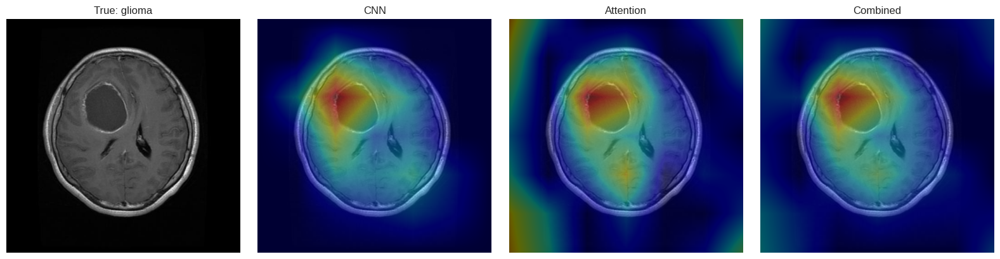

   ✅ Generated heatmap 1: heatmap_glioma_3.png


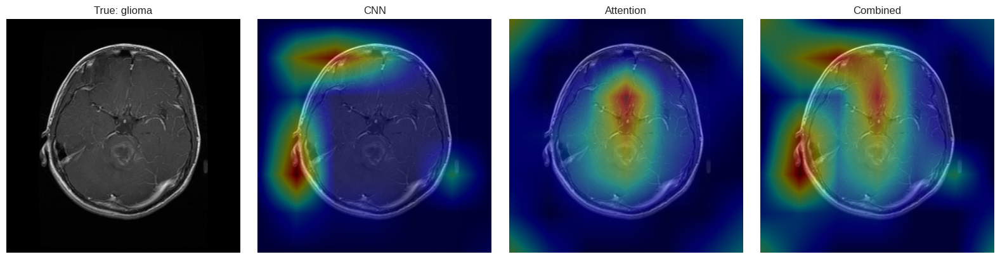

   ✅ Generated heatmap 2: heatmap_glioma_15.png


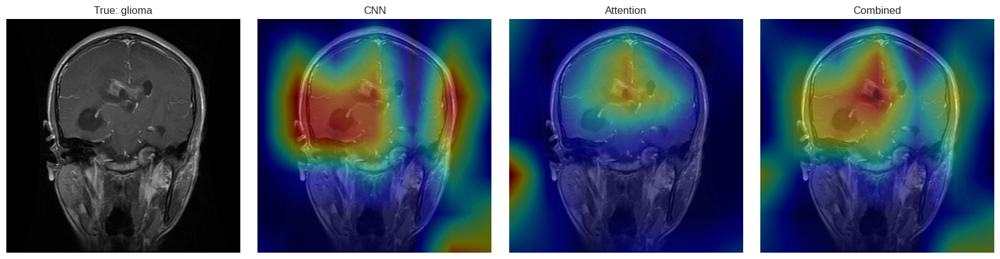

   ✅ Generated heatmap 3: heatmap_glioma_19.png


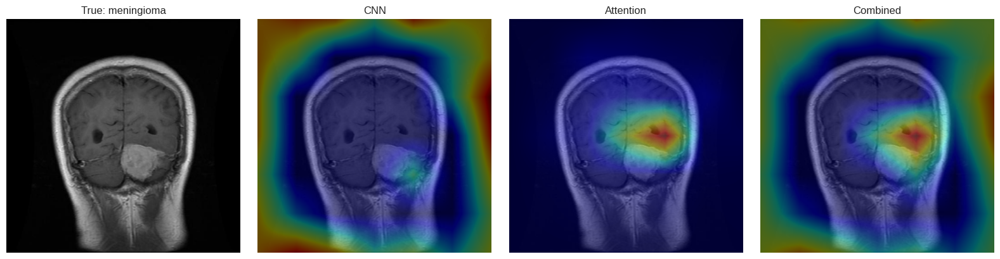

   ✅ Generated heatmap 4: heatmap_meningioma_1.png


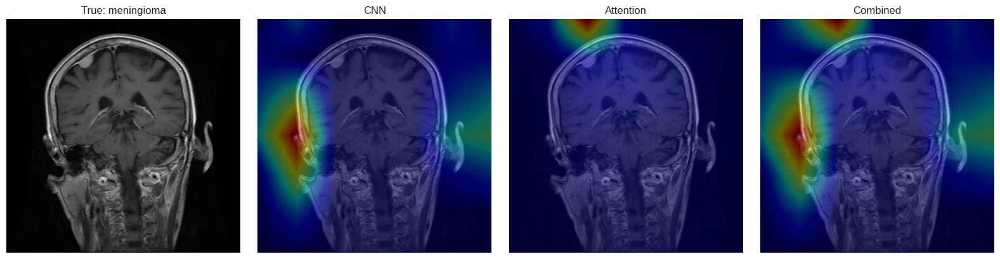

   ✅ Generated heatmap 5: heatmap_meningioma_7.png


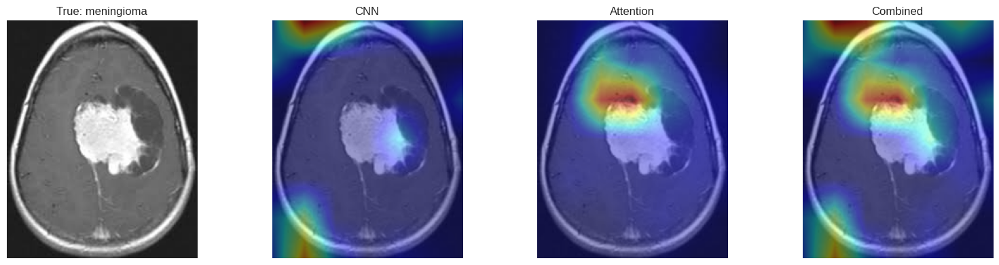

   ✅ Generated heatmap 6: heatmap_meningioma_9.png


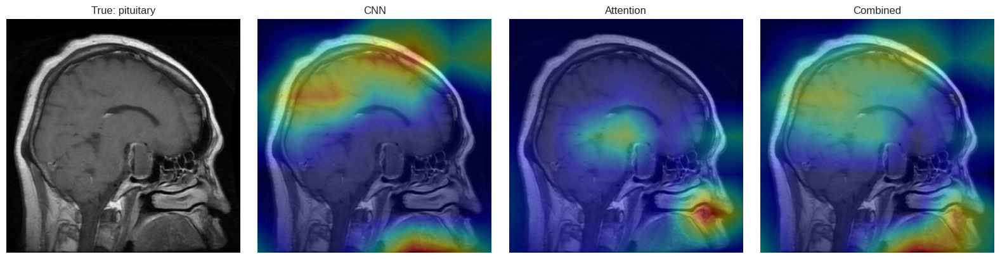

   ✅ Generated heatmap 7: heatmap_pituitary_10.png


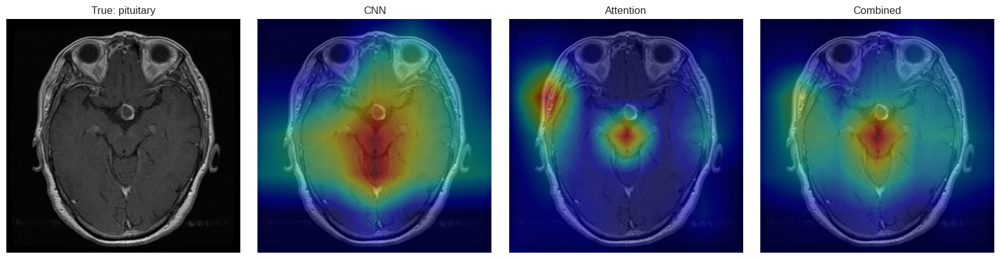

   ✅ Generated heatmap 8: heatmap_pituitary_13.png


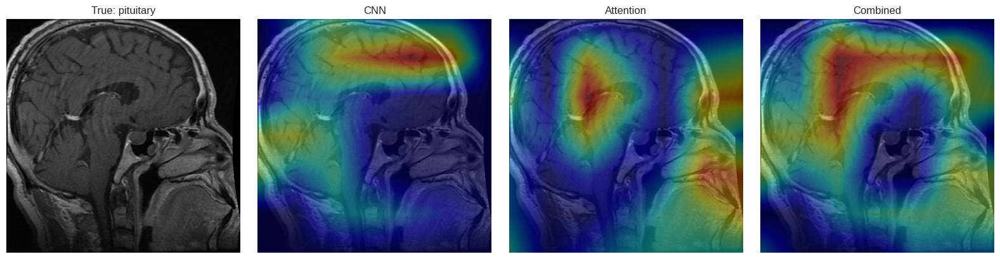

   ✅ Generated heatmap 9: heatmap_pituitary_22.png

✅ Generated 9 heatmaps successfully!
📁 Heatmaps saved to: /kaggle/working/plots/heatmaps


In [53]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  STANDALONE HEATMAP GENERATOR (FIXED)                                         ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import torch, torch.nn as nn, torch.nn.functional as F
import numpy as np, cv2, matplotlib.pyplot as plt
from pathlib import Path
from einops import rearrange
from scipy.ndimage import zoom
import torchvision.models as models
import warnings
warnings.filterwarnings('ignore')

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
OUTDIR = Path('/kaggle/working')
CKDIR = OUTDIR / 'checkpoints'
PLTDIR = OUTDIR / 'plots'
PLTDIR.mkdir(exist_ok=True)

MEAN = (0.485, 0.456, 0.406)
STD = (0.229, 0.224, 0.225)
class_names = ['notumor', 'glioma', 'meningioma', 'pituitary']

# --- 1. Rebuild Model Architecture (Must match exactly) ---
class DropPath(nn.Module):
    def __init__(self, drop_prob=0.0): super().__init__(); self.drop_prob = drop_prob
    def forward(self, x):
        if self.drop_prob == 0.0 or not self.training: return x
        keep_prob = float(1.0 - self.drop_prob)
        return x * (torch.rand((x.shape[0], 1, 1), dtype=torch.float32, device=x.device) * keep_prob)

class WindowAttention(nn.Module):
    def __init__(self, d_model, nhead, window_size=7, dropout=0.1):
        super().__init__()
        self.nhead, self.window_size, self.head_dim = nhead, window_size, d_model // nhead
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(d_model, d_model * 3); self.proj = nn.Linear(d_model, d_model)
        self.attn_drop, self.proj_drop, self.attn_weights = nn.Dropout(dropout), nn.Dropout(dropout), None
    def forward(self, x, H, W):
        B, N, C = x.shape; x = x.reshape(B, H, W, C)
        pad_h, pad_w = (self.window_size - H % self.window_size) % self.window_size, (self.window_size - W % self.window_size) % self.window_size
        if pad_h > 0 or pad_w > 0: x = F.pad(x, (0, 0, 0, pad_w, 0, pad_h))
        Hp, Wp = x.shape[1], x.shape[2]
        x = x.reshape(B, Hp//self.window_size, self.window_size, Wp//self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(-1, self.window_size**2, C)
        qkv = self.qkv(x).reshape(-1, self.window_size**2, 3, self.nhead, self.head_dim).permute(2,0,3,1,4)
        attn = (qkv[0] @ qkv[1].transpose(-2,-1)) * self.scale; attn = attn.softmax(dim=-1); self.attn_weights = attn.detach()
        x = self.proj_drop(self.proj((self.attn_drop(attn) @ qkv[2]).transpose(1,2).reshape(-1, self.window_size**2, C)))
        x = x.reshape(B, Hp//self.window_size, Wp//self.window_size, self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(B, Hp, Wp, C)
        return x[:, :H, :W, :].reshape(B, -1, C) if pad_h > 0 or pad_w > 0 else x.reshape(B, -1, C)

class TransformerBlockWithWindow(nn.Module):
    def __init__(self, d_model, nhead, ffn_dim, window_size=7, attn_drop=0.1, ffn_drop=0.1, drop_path=0.0):
        super().__init__()
        self.norm1, self.norm2 = nn.LayerNorm(d_model), nn.LayerNorm(d_model)
        self.global_attn = nn.MultiheadAttention(d_model, nhead, dropout=attn_drop, batch_first=True)
        self.window_attn = WindowAttention(d_model, nhead, window_size, attn_drop)
        self.gate = nn.Sequential(nn.Linear(d_model*2, d_model), nn.Sigmoid())
        self.ffn = nn.Sequential(nn.Linear(d_model, ffn_dim), nn.GELU(), nn.Dropout(ffn_drop), nn.Linear(ffn_dim, d_model), nn.Dropout(ffn_drop))
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.attn_weights, self.window_attn_weights = None, None
    def forward(self, x, H, W):
        x_norm = self.norm1(x)
        global_out, global_attn = self.global_attn(x_norm, x_norm, x_norm, need_weights=True)
        self.attn_weights = global_attn.detach()
        window_out = self.window_attn(x_norm[:, 1:, :], H, W)
        self.window_attn_weights = self.window_attn.attn_weights
        gate = self.gate(torch.cat([global_out[:, 1:, :], window_out], dim=-1))
        combined = torch.cat([global_out[:, :1, :], gate * global_out[:, 1:, :] + (1-gate) * window_out], dim=1)
        x = x + self.drop_path(combined)
        return x + self.drop_path(self.ffn(self.norm2(x)))

class ImprovedBackbone(nn.Module):
    def __init__(self): super().__init__(); self.backbone = models.convnext_base(weights=None); self.feature_extractor = self.backbone.features
    def forward(self, x): return self.feature_extractor(x)

class EnhancedHViT(nn.Module):
    def __init__(self, num_classes=4, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536):
        super().__init__(); self.d_model = d_model; self.img_size = img_size; self.backbone = ImprovedBackbone()
        with torch.no_grad(): _, c, h, w = self.backbone(torch.zeros(1, 3, img_size, img_size)).shape
        self.spatial_h, self.spatial_w = h, w
        self.proj = nn.Sequential(nn.Conv2d(c, d_model, 1, bias=False), nn.BatchNorm2d(d_model), nn.GELU(), nn.Conv2d(d_model, d_model, 3, padding=1, bias=False), nn.BatchNorm2d(d_model), nn.GELU())
        self.norm_proj = nn.LayerNorm(d_model); self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, h*w + 1, d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02); nn.init.trunc_normal_(self.pos_embed, std=0.02)
        dpr = [x.item() for x in torch.linspace(0, 0.15, n_layers)]
        self.encoder = nn.ModuleList([TransformerBlockWithWindow(d_model, nhead, dim_ffn, min(7, h, w), drop_path=dpr[i]) for i in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(nn.LayerNorm(d_model), nn.Linear(d_model, d_model//2), nn.GELU(), nn.Dropout(0.3), nn.Linear(d_model//2, d_model//4), nn.GELU(), nn.Dropout(0.15), nn.Linear(d_model//4, num_classes))
    def forward(self, x):
        B = x.size(0); tokens = rearrange(self.proj(self.backbone(x)), 'b d h w -> b (h w) d')
        tokens = self.norm_proj(tokens); tokens = torch.cat([self.cls_token.expand(B,-1,-1), tokens], dim=1) + self.pos_embed
        for block in self.encoder: tokens = block(tokens, self.spatial_h, self.spatial_w)
        return self.head(self.norm(tokens)[:, 0])
    def get_attentions(self):
        g, w = [], []
        for b in self.encoder:
            if b.attn_weights is not None: g.append(b.attn_weights)
            if b.window_attn_weights is not None: w.append(b.window_attn_weights)
        return g, w

# --- 2. Load Model ---
print("📦 Rebuilding model and loading weights...")
model = EnhancedHViT(num_classes=4, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536).to(DEVICE)

# Check if model file exists
model_path = CKDIR / 'best_model.pth'
if not model_path.exists():
    print(f"❌ Model not found at: {model_path}")
    print("   Please train the model first using the main training cell.")
    raise FileNotFoundError(f"Model file not found: {model_path}")

model.load_state_dict(torch.load(model_path, map_location=DEVICE, weights_only=False)['model'])
model.eval()
print("✅ Model loaded successfully!")

# --- 3. Heatmap Logic ---
def isolate_tumor(heatmap, percentile=40):
    if heatmap is None: return None
    threshold = np.percentile(heatmap, percentile)
    masked = np.where(heatmap > threshold, heatmap, 0.0)
    if masked.max() > masked.min():
        return (masked - masked.min()) / (masked.max() - masked.min() + 1e-8)
    return np.zeros_like(heatmap)

class HeatmapGenerator:
    def __init__(self, model):
        self.model = model.to(DEVICE); self.model.eval(); self.cnn_f, self.cnn_g = None, None
        self.img_size = getattr(model, 'img_size', 224)
        last_conv = None
        for m in self.model.backbone.feature_extractor.modules():
            if isinstance(m, nn.Conv2d): last_conv = m
        if last_conv:
            last_conv.register_forward_hook(lambda m,i,o: setattr(self, 'cnn_f', o.detach()))
            last_conv.register_backward_hook(lambda m,gi,go: setattr(self, 'cnn_g', (go[0] if isinstance(go, (tuple, list)) else go).detach()))
    
    def get_cnn(self, x, t):
        out = self.model(x); self.model.zero_grad(); oh=torch.zeros_like(out); oh[0,t]=1; out.backward(gradient=oh, retain_graph=True)
        if self.cnn_f is None: return None
        w = self.cnn_g.mean(dim=(2, 3), keepdim=True); cam = F.relu((w * self.cnn_f).sum(1)).squeeze().cpu().numpy()
        if cam.max() > cam.min(): 
            return (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam
    
    def get_attn(self, x):
        with torch.no_grad(): self.model(x)
        g, _ = self.model.get_attentions()
        if not g: return None
        a = g[-1]
        a = a[0, 0, 1:].cpu().numpy() if a.dim()==3 else a[0, :, 0, 1:].mean(0).cpu().numpy()
        a = a.reshape(self.model.spatial_h, self.model.spatial_w)
        if a.max() > a.min(): 
            return (a - a.min()) / (a.max() - a.min() + 1e-8)
        return a
    
    def draw(self, img_path, target, names, save_path):
        img = cv2.imread(str(img_path)); 
        if img is None:
            print(f"⚠️ Could not read image: {img_path}")
            return
        rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB); sz = rgb.shape[:2]
        t = torch.from_numpy(cv2.resize(rgb, (self.img_size, self.img_size))).float().permute(2,0,1)/255.0
        t = ((t - torch.tensor(MEAN).view(3,1,1)) / torch.tensor(STD).view(3,1,1)).unsqueeze(0).to(DEVICE)
        c, a, comb = self.get_cnn(t.clone(), target), self.get_attn(t.clone()), None
        if c is not None and a is not None:
            if a.shape != c.shape: 
                a = zoom(a, (c.shape[0]/a.shape[0], c.shape[1]/a.shape[1]), order=1)
            comb = 0.5*c + 0.5*a
            if comb.max() > comb.min(): 
                comb = (comb - comb.min()) / (comb.max() - comb.min() + 1e-8)
        c, a, comb = isolate_tumor(c, 40), isolate_tumor(a, 35), isolate_tumor(comb, 35)
        fig, axes = plt.subplots(1, 4, figsize=(16, 4))
        axes[0].imshow(rgb); axes[0].set_title(f'True: {names[target]}'); axes[0].axis('off')
        for i, (hmap, title) in enumerate(zip([c, a, comb], ['CNN', 'Attention', 'Combined'])):
            if hmap is not None:
                hr = zoom(hmap, (sz[0]/hmap.shape[0], sz[1]/hmap.shape[1]), order=1)
                colored = (plt.cm.jet(hr)[:,:,:3]*255).astype(np.uint8)
                axes[i+1].imshow(cv2.addWeighted(rgb, 0.6, colored, 0.4, 0))
            axes[i+1].set_title(title); axes[i+1].axis('off')
        plt.tight_layout(); 
        plt.savefig(save_path, dpi=150, bbox_inches='tight'); 
        plt.show()

# --- 4. Load Test Samples ---
from sklearn.model_selection import train_test_split
VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}

print("📂 Loading dataset paths...")
samples = []

# Try multiple possible dataset paths
possible_paths = [
    Path('/kaggle/input/datasets/bhagawati4204/daataasets/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset'),
    Path('/kaggle/input/datasets/aayush4204/daataaset/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset'),
    Path('/kaggle/input/brain-tumor-mri-dataset'),
    Path('/kaggle/input/datasets/Brain Tumor MRI Dataset'),
]

base = None
for path in possible_paths:
    if path.exists():
        base = path
        print(f"✅ Found dataset at: {base}")
        break

if base is None:
    print("❌ Could not find dataset. Please check your dataset path.")
    print("   Available paths tried:")
    for p in possible_paths:
        print(f"   - {p}")
    raise FileNotFoundError("Dataset not found")

# Load samples
for split in ['Training', 'Testing']:
    split_path = base / split
    if not split_path.exists():
        print(f"⚠️ Split not found: {split_path}")
        continue
    
    for f in split_path.iterdir():
        if not f.is_dir(): continue
        fn = f.name.lower().replace('_', '')
        
        if 'notumor' in fn or 'no' in fn: 
            cname = 'notumor'
        elif 'glioma' in fn: 
            cname = 'glioma'
        elif 'meningioma' in fn: 
            cname = 'meningioma'
        elif 'pituitary' in fn: 
            cname = 'pituitary'
        else: 
            continue
        
        count = 0
        for ext in VALID_EXTS:
            for p in f.rglob(f'*{ext}'):
                samples.append((str(p), cname))
                count += 1
        if count > 0:
            print(f"   {split}/{cname}: {count} images")

if not samples:
    print("❌ No samples loaded! Please check the dataset structure.")
    raise ValueError("No samples found")

print(f"✅ Total samples loaded: {len(samples)}")

# Split to get test set
labels = [class_names.index(l) for l in [s[1] for s in samples]]
train_s, temp_s = train_test_split(samples, test_size=0.3, stratify=labels, random_state=42)
val_s, test_s = train_test_split(temp_s, test_size=0.5, 
                                 stratify=[class_names.index(l) for l in [s[1] for s in temp_s]], 
                                 random_state=42)

print(f"📊 Test set size: {len(test_s)} images")

# --- 5. Find Correct Predictions for Heatmap ---
print("\n🔍 Finding correct predictions for heatmap...")
all_p, all_l = [], []
hm = HeatmapGenerator(model)

# Process subset for speed (limit to 100 images from test set)
test_subset = test_s[:100] if len(test_s) > 100 else test_s
print(f"   Processing {len(test_subset)} images...")

for p, l in tqdm(test_subset, desc="Evaluating"):
    img = cv2.imread(p)
    if img is None: continue
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    t = torch.from_numpy(cv2.resize(rgb, (224, 224))).float().permute(2,0,1)/255.0
    t = ((t - torch.tensor(MEAN).view(3,1,1)) / torch.tensor(STD).view(3,1,1)).unsqueeze(0).to(DEVICE)
    with torch.no_grad(): 
        out = model(t)
    all_p.append(out.argmax(1).item())
    all_l.append(class_names.index(l))

# --- 6. Generate Heatmaps ---
print("\n🔥 Generating Tumor Heatmaps...")

# Create heatmap directory
HEATMAP_DIR = PLTDIR / 'heatmaps'
HEATMAP_DIR.mkdir(exist_ok=True)

heatmaps_generated = 0
for cls_idx in range(1, 4):  # Skip 'notumor' (index 0)
    # Find correct predictions for this class
    corr = [i for i, (p, l) in enumerate(zip(all_p, all_l)) if p == l and l == cls_idx]
    
    if not corr:
        print(f"⚠️ No correct predictions found for {class_names[cls_idx]}")
        continue
    
    # Take up to 3 examples per class
    for idx in corr[:3]:
        try:
            save_path = HEATMAP_DIR / f'heatmap_{class_names[cls_idx]}_{idx}.png'
            hm.draw(test_subset[idx][0], cls_idx, class_names, save_path)
            heatmaps_generated += 1
            print(f"   ✅ Generated heatmap {heatmaps_generated}: {save_path.name}")
        except Exception as e:
            print(f"   ❌ Error generating heatmap: {e}")

print(f"\n✅ Generated {heatmaps_generated} heatmaps successfully!")
print(f"📁 Heatmaps saved to: {HEATMAP_DIR}")

📦 Rebuilding model and loading weights...
✅ Model loaded! Best accuracy: 0.986574074074074

📂 Scanning dataset and creating splits...

📊 COMPREHENSIVE DATASET ANALYSIS REPORT

🔹 Total Images: 7200 | Classes: 4
🔹 Split: 70% Train (5040) / 30% Test (2160)
   - Notumor     :  1800 total | Train: 1260 | Test:  540
   - Glioma      :  1800 total | Train: 1260 | Test:  540
   - Meningioma  :  1800 total | Train: 1260 | Test:  540
   - Pituitary   :  1800 total | Train: 1260 | Test:  540

🧠 Running inference on Test Set...


Predicting:   0%|          | 0/2160 [00:00<?, ?it/s]


✅ Inference complete!
   Test Accuracy: 0.9866
   Test F1: 0.9866


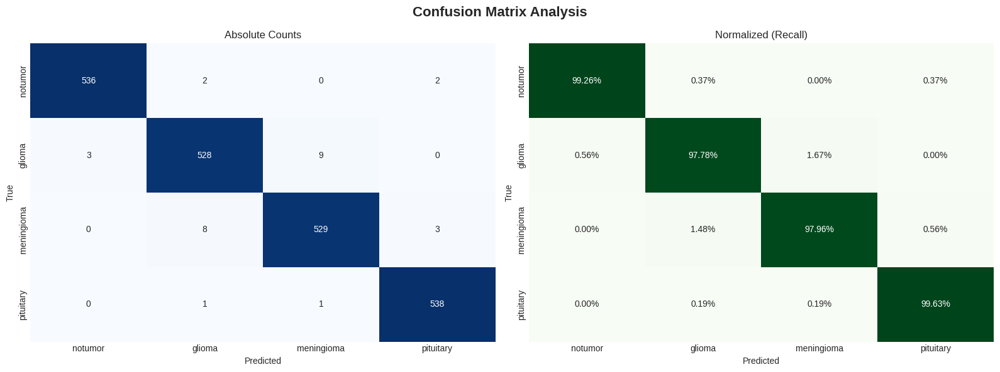

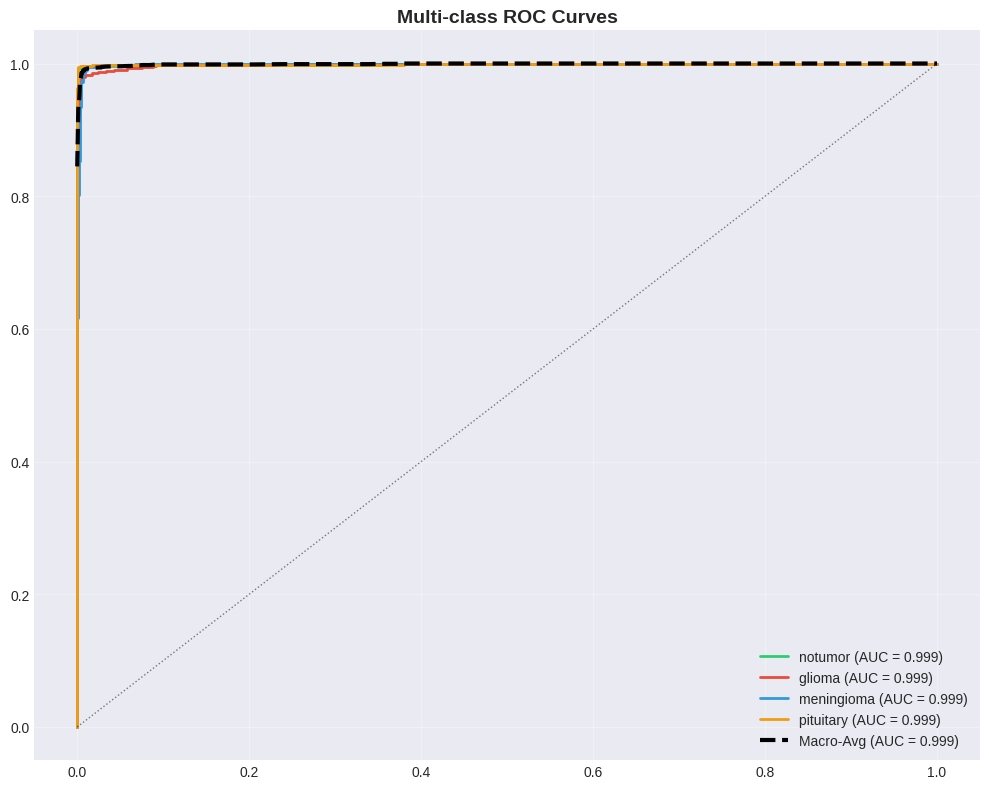

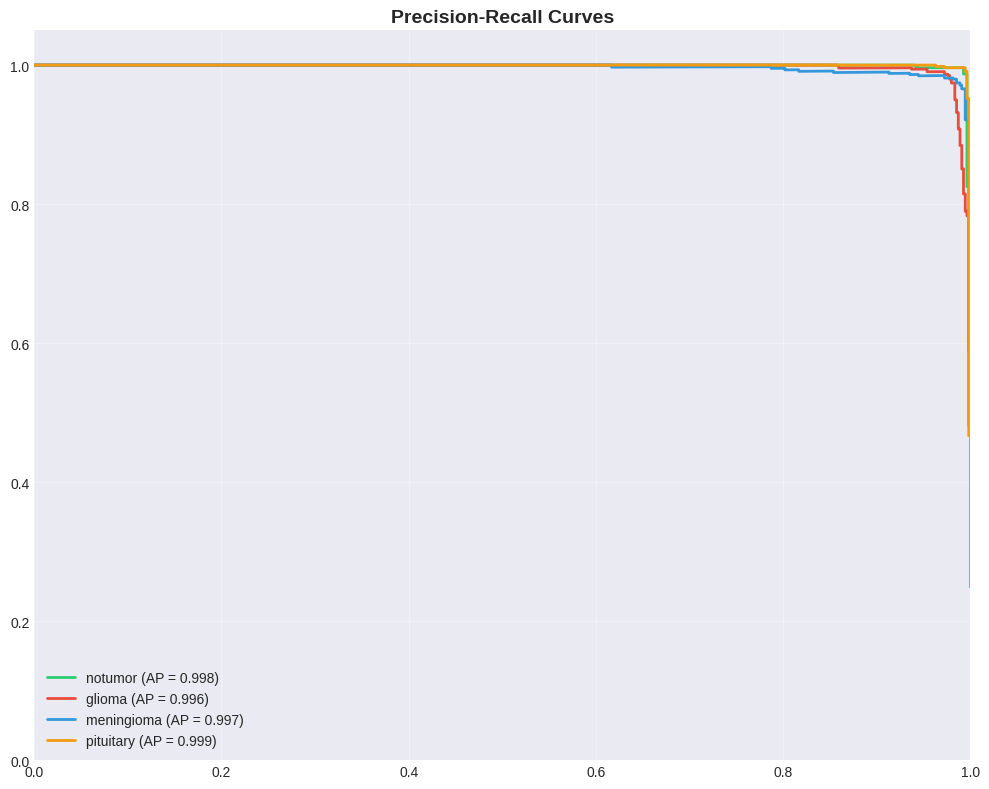

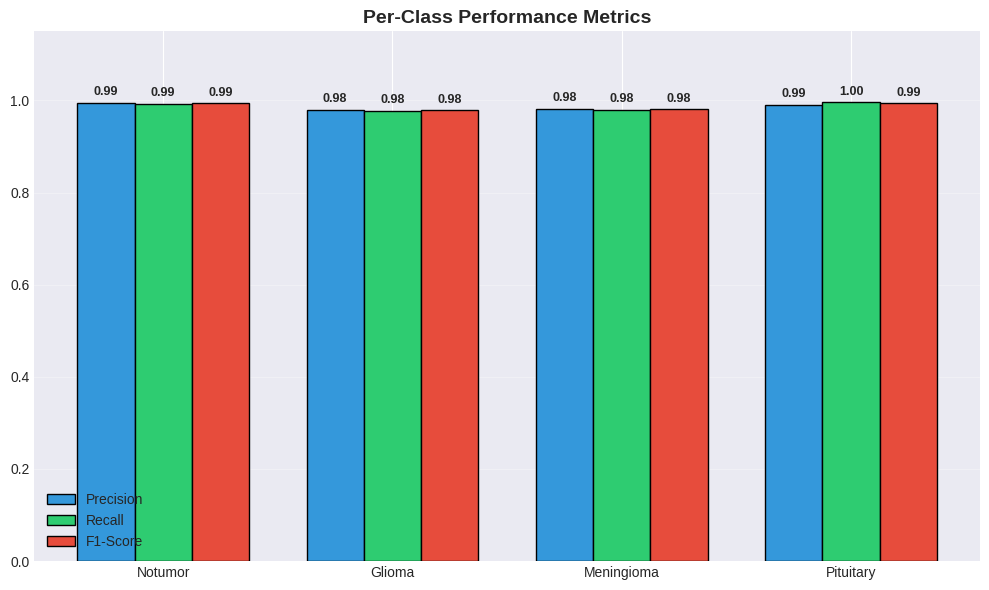

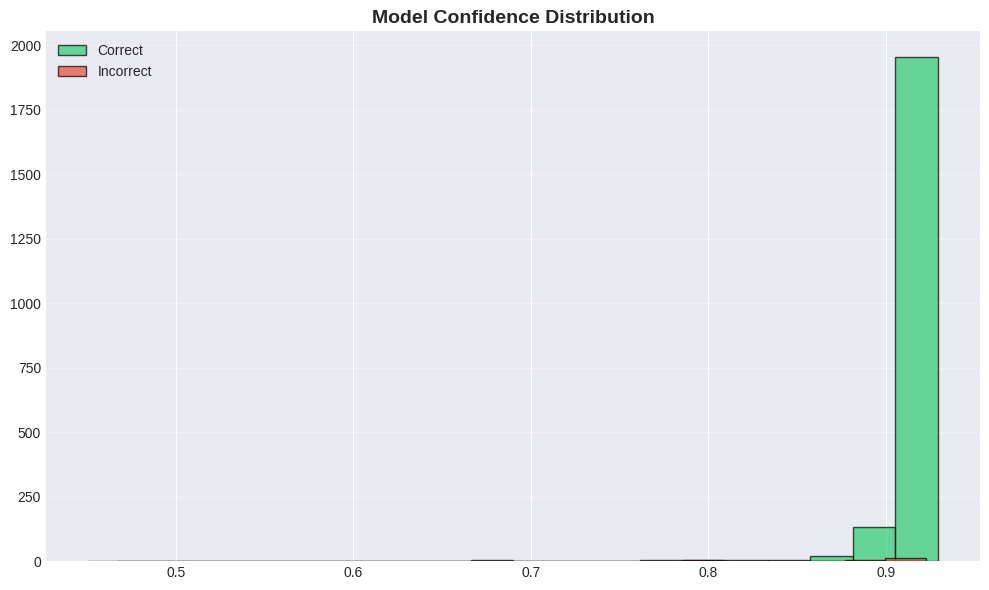

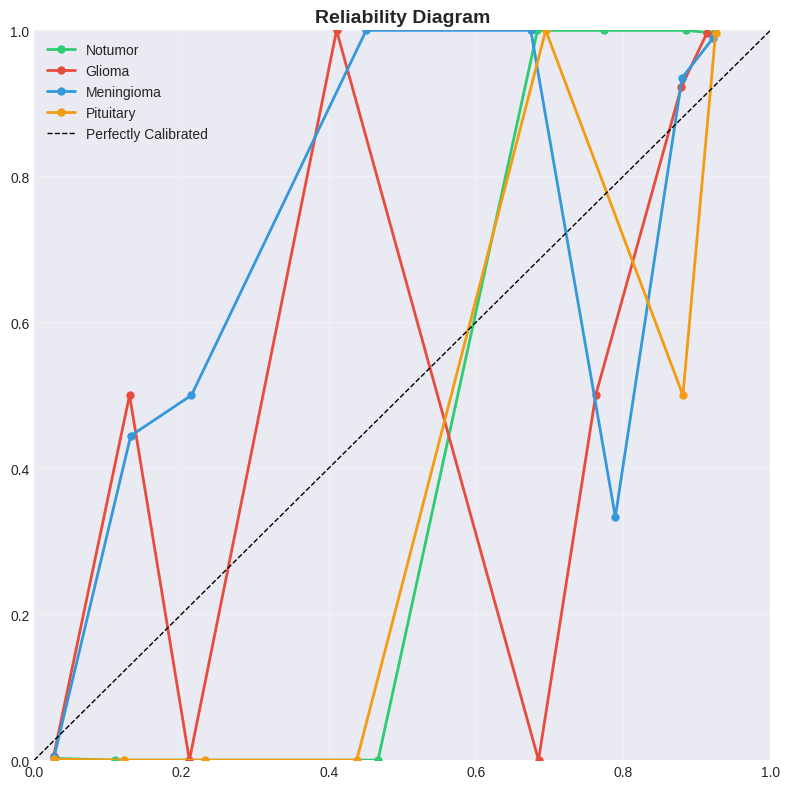

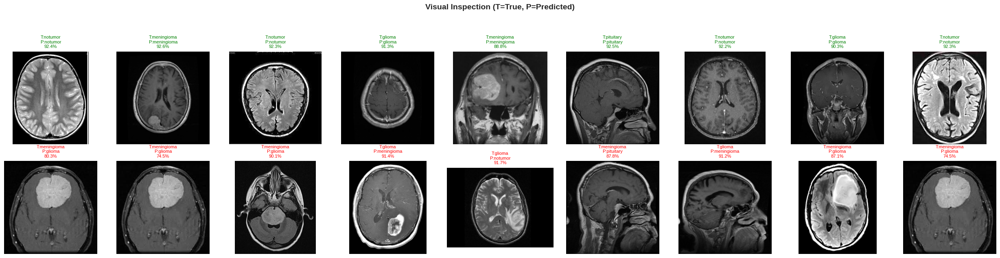

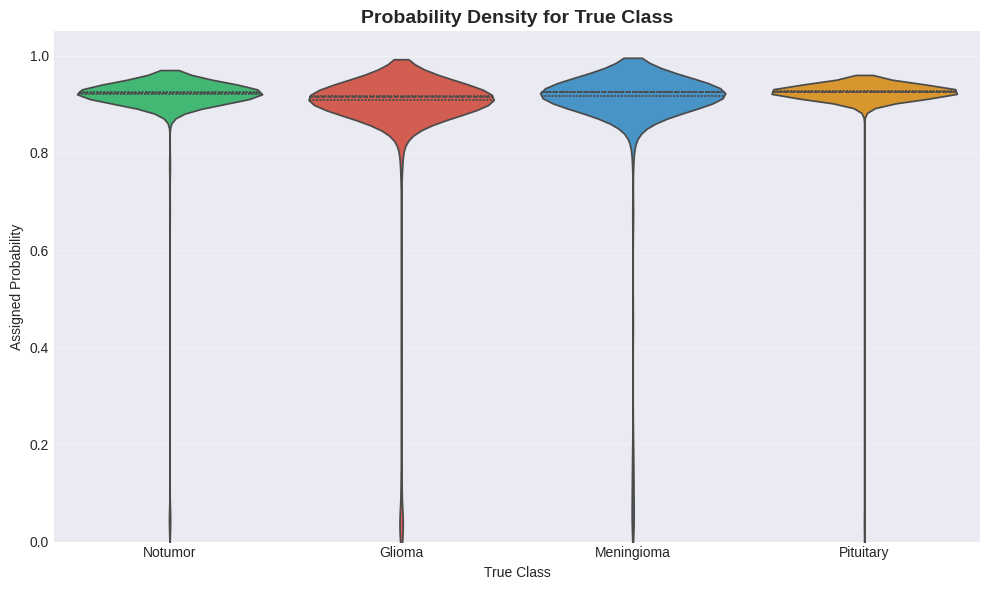

⏳ Extracting t-SNE features...


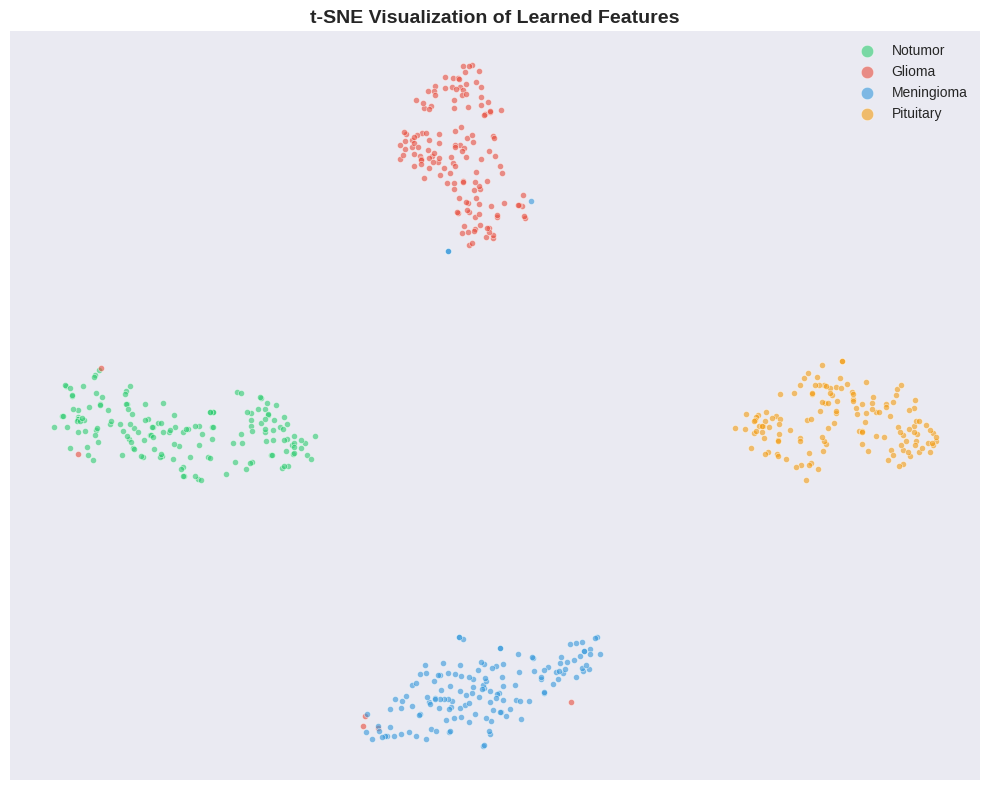

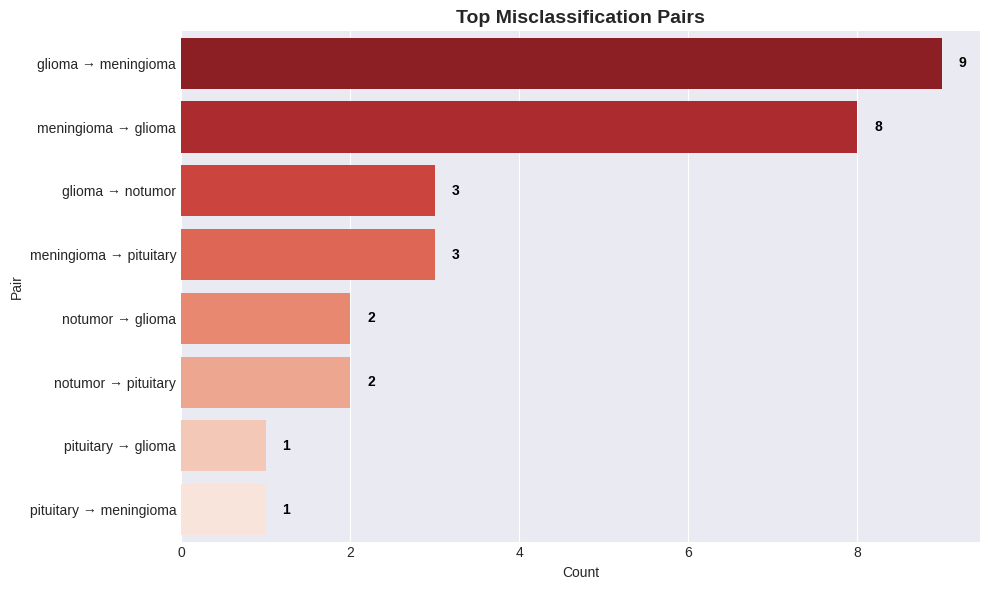

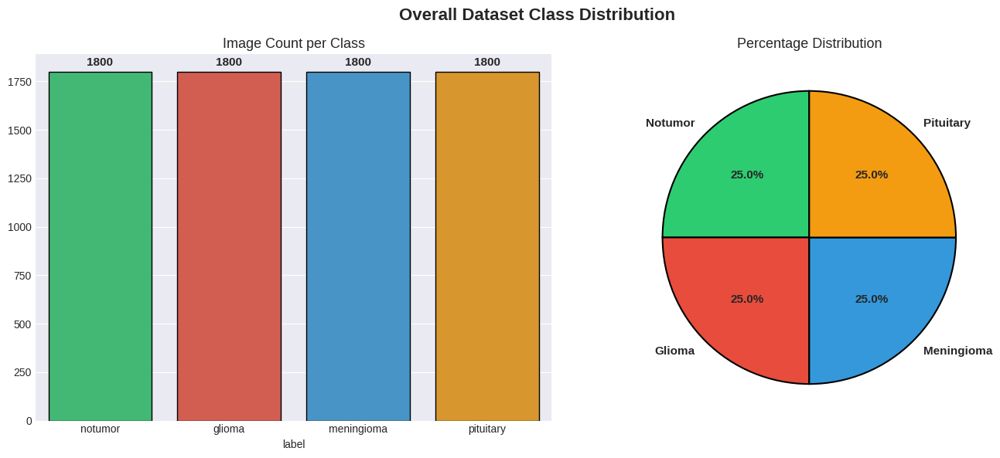

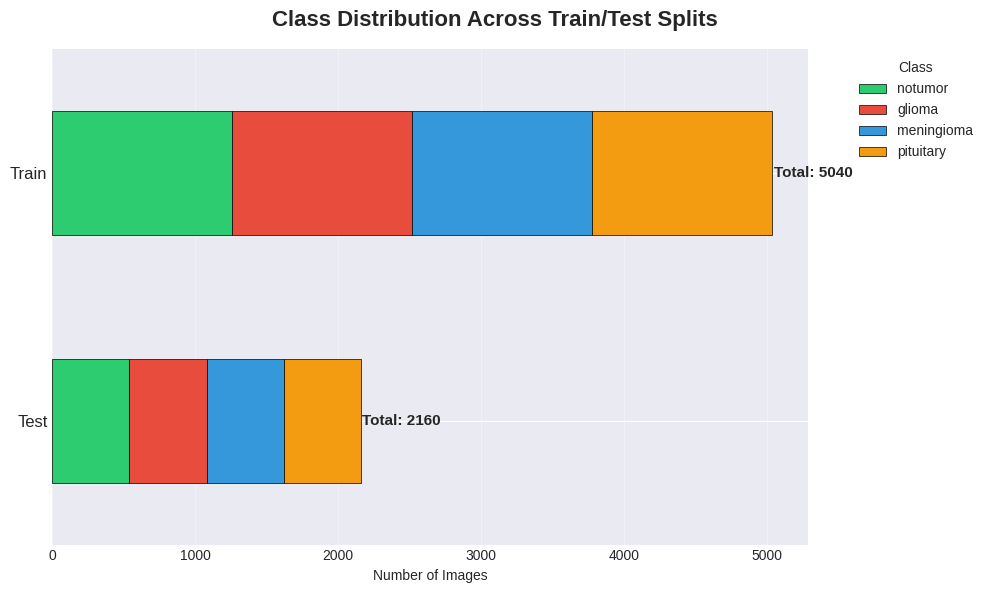

⏳ Computing average MRI per class...


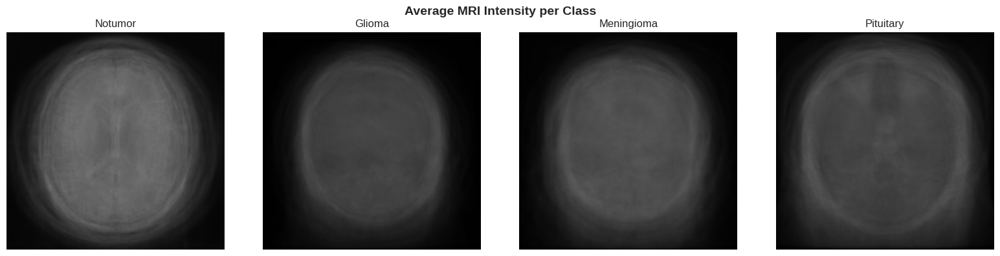

⏳ Sampling pixel intensities...


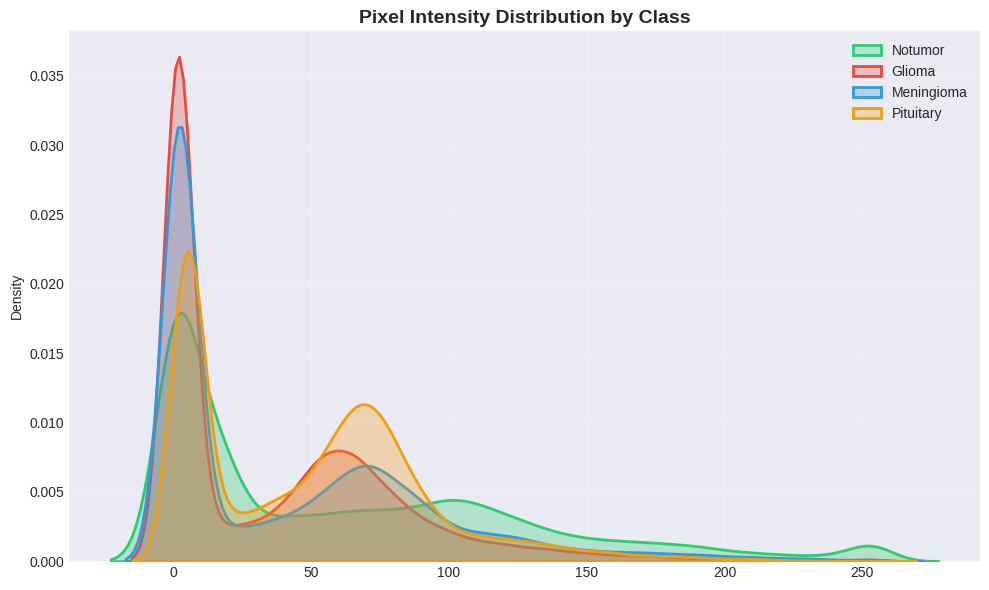

⏳ Checking image dimensions...


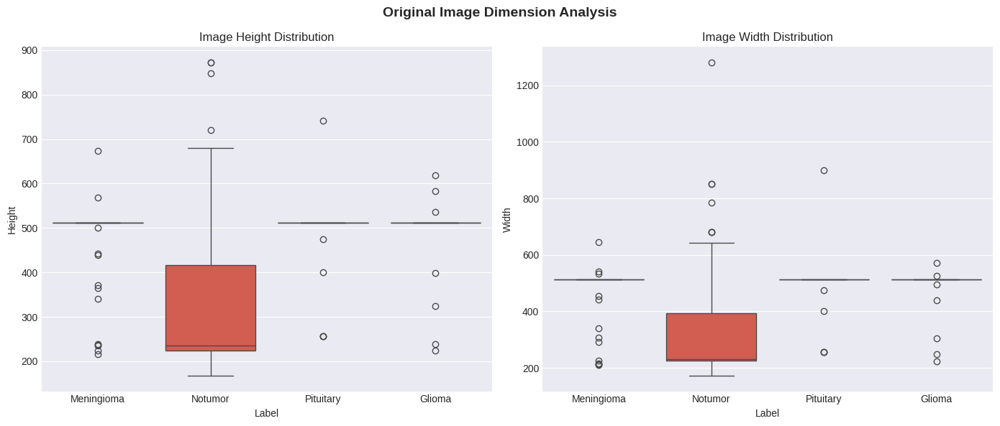


🔥 Generating Grad-CAM + Attention Overlays...


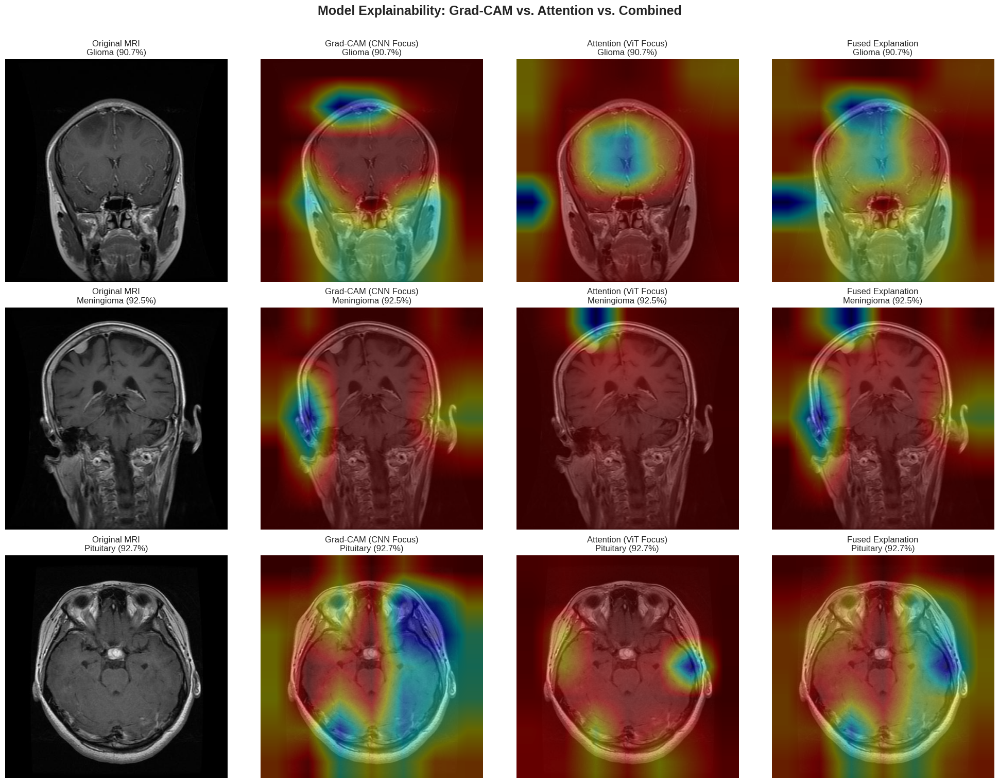


🚀 Analyzing Confidence Thresholds...


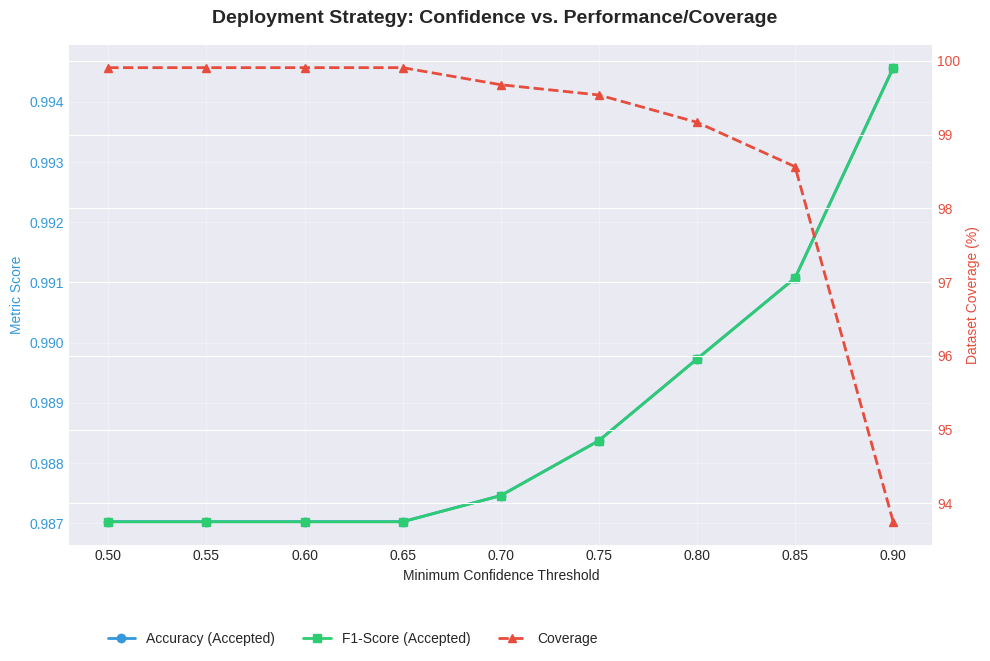

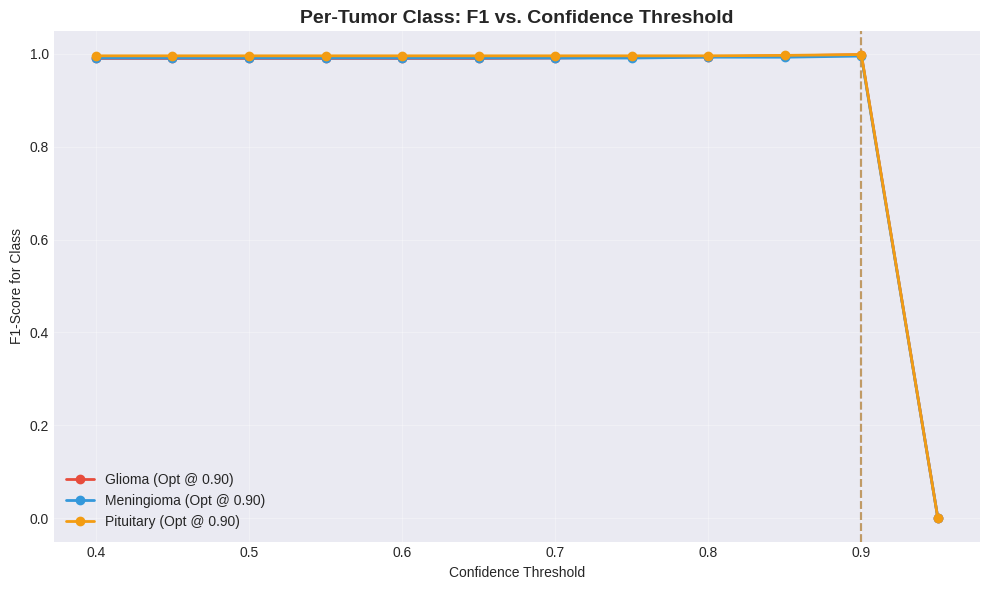


🧠 Extracting Deep Feature Maps...


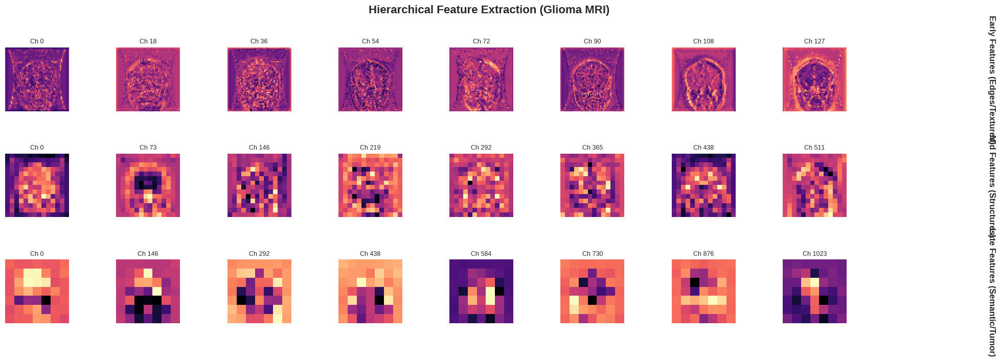


📊 Generating Summary Dashboard...


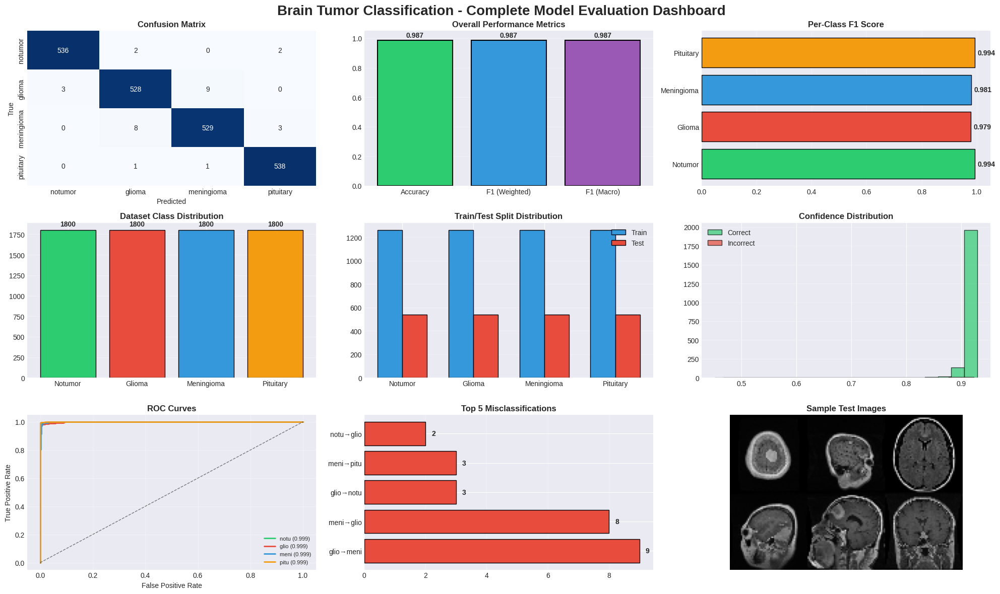


✅ ALL 20 PLOTS GENERATED SUCCESSFULLY!
📁 Location: /kaggle/working/plots/brain

📊 FINAL SUMMARY:
   Test Accuracy: 0.9866
   Test F1 (Weighted): 0.9866
   Test Samples: 2160
   Total Images: 7200
   Train/Test Split: 5040 / 2160


In [68]:
# ╔══════════════════════════════════════════════════════════════════════════════════════╗
# ║  ULTIMATE MEGA CELL: ALL 20 PLOTS (Train/Test Split Only, No Validation)           ║
# ╚══════════════════════════════════════════════════════════════════════════════════════╝

import os, time, random, copy, warnings
from pathlib import Path
from collections import Counter
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns, cv2
from tqdm.auto import tqdm
from scipy.ndimage import zoom
import torch, torch.nn as nn, torch.nn.functional as F
import torchvision.models as models
from sklearn.metrics import (accuracy_score, f1_score, roc_curve, auc, confusion_matrix, 
                             classification_report, precision_recall_curve, average_precision_score)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.manifold import TSNE
from torch.cuda.amp import autocast
from einops import rearrange

warnings.filterwarnings('ignore')
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
OUTDIR = Path('/kaggle/working')
PLTDIR = OUTDIR / 'plots/brain'; PLTDIR.mkdir(exist_ok=True)
CKDIR = OUTDIR / 'checkpoints'
MEAN, STD = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
class_names = ['notumor', 'glioma', 'meningioma', 'pituitary']
colors = ['#2ecc71', '#e74c3c', '#3498db', '#f39c12']
VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.JPG', '.JPEG', '.PNG'}

# ─── 1. MODEL ARCHITECTURE ────────────────────────────────────────────────────────
class DropPath(nn.Module):
    def __init__(self, drop_prob=0.0): super().__init__(); self.drop_prob = drop_prob
    def forward(self, x):
        if self.drop_prob == 0.0 or not self.training: return x
        return x * (torch.rand((x.shape[0], 1, 1), dtype=torch.float32, device=x.device) * float(1.0 - self.drop_prob))

class WindowAttention(nn.Module):
    def __init__(self, d_model, nhead, window_size=7, dropout=0.1):
        super().__init__()
        self.nhead, self.window_size, self.head_dim = nhead, window_size, d_model // nhead
        self.scale = self.head_dim ** -0.5
        self.qkv = nn.Linear(d_model, d_model * 3); self.proj = nn.Linear(d_model, d_model)
        self.attn_drop, self.proj_drop, self.attn_weights = nn.Dropout(dropout), nn.Dropout(dropout), None
    def forward(self, x, H, W):
        B, N, C = x.shape; x = x.reshape(B, H, W, C)
        pad_h, pad_w = (self.window_size - H % self.window_size) % self.window_size, (self.window_size - W % self.window_size) % self.window_size
        if pad_h > 0 or pad_w > 0: x = F.pad(x, (0, 0, 0, pad_w, 0, pad_h))
        Hp, Wp = x.shape[1], x.shape[2]
        x = x.reshape(B, Hp//self.window_size, self.window_size, Wp//self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(-1, self.window_size**2, C)
        qkv = self.qkv(x).reshape(-1, self.window_size**2, 3, self.nhead, self.head_dim).permute(2,0,3,1,4)
        attn = (qkv[0] @ qkv[1].transpose(-2,-1)) * self.scale; attn = attn.softmax(dim=-1); self.attn_weights = attn.detach()
        x = self.proj_drop(self.proj((self.attn_drop(attn) @ qkv[2]).transpose(1,2).reshape(-1, self.window_size**2, C)))
        x = x.reshape(B, Hp//self.window_size, Wp//self.window_size, self.window_size, self.window_size, C).permute(0,1,3,2,4,5).reshape(B, Hp, Wp, C)
        return x[:, :H, :W, :].reshape(B, -1, C) if pad_h > 0 or pad_w > 0 else x.reshape(B, -1, C)

class TransformerBlockWithWindow(nn.Module):
    def __init__(self, d_model, nhead, ffn_dim, window_size=7, attn_drop=0.1, ffn_drop=0.1, drop_path=0.0):
        super().__init__()
        self.norm1, self.norm2 = nn.LayerNorm(d_model), nn.LayerNorm(d_model)
        self.global_attn = nn.MultiheadAttention(d_model, nhead, dropout=attn_drop, batch_first=True)
        self.window_attn = WindowAttention(d_model, nhead, window_size, attn_drop)
        self.gate = nn.Sequential(nn.Linear(d_model*2, d_model), nn.Sigmoid())
        self.ffn = nn.Sequential(nn.Linear(d_model, ffn_dim), nn.GELU(), nn.Dropout(ffn_drop), nn.Linear(ffn_dim, d_model), nn.Dropout(ffn_drop))
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.attn_weights, self.window_attn_weights = None, None
    def forward(self, x, H, W):
        x_norm = self.norm1(x)
        global_out, global_attn = self.global_attn(x_norm, x_norm, x_norm, need_weights=True)
        self.attn_weights = global_attn.detach()
        window_out = self.window_attn(x_norm[:, 1:, :], H, W); self.window_attn_weights = self.window_attn.attn_weights
        gate = self.gate(torch.cat([global_out[:, 1:, :], window_out], dim=-1))
        combined = torch.cat([global_out[:, :1, :], gate * global_out[:, 1:, :] + (1-gate) * window_out], dim=1)
        x = x + self.drop_path(combined)
        return x + self.drop_path(self.ffn(self.norm2(x)))

class ImprovedBackbone(nn.Module):
    def __init__(self): super().__init__(); self.backbone = models.convnext_base(weights=None); self.feature_extractor = self.backbone.features
    def forward(self, x): return self.feature_extractor(x)

class EnhancedHViT(nn.Module):
    def __init__(self, num_classes=4, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536):
        super().__init__(); self.d_model = d_model; self.img_size = img_size; self.backbone = ImprovedBackbone()
        with torch.no_grad(): _, c, h, w = self.backbone(torch.zeros(1, 3, img_size, img_size)).shape
        self.spatial_h, self.spatial_w = h, w
        self.proj = nn.Sequential(nn.Conv2d(c, d_model, 1, bias=False), nn.BatchNorm2d(d_model), nn.GELU(), nn.Conv2d(d_model, d_model, 3, padding=1, bias=False), nn.BatchNorm2d(d_model), nn.GELU())
        self.norm_proj = nn.LayerNorm(d_model); self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, h*w + 1, d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02); nn.init.trunc_normal_(self.pos_embed, std=0.02)
        dpr = [x.item() for x in torch.linspace(0, 0.15, n_layers)]
        self.encoder = nn.ModuleList([TransformerBlockWithWindow(d_model, nhead, dim_ffn, min(7, h, w), drop_path=dpr[i]) for i in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(nn.LayerNorm(d_model), nn.Linear(d_model, d_model//2), nn.GELU(), nn.Dropout(0.3), nn.Linear(d_model//2, d_model//4), nn.GELU(), nn.Dropout(0.15), nn.Linear(d_model//4, num_classes))
    def forward(self, x):
        B = x.size(0); tokens = rearrange(self.proj(self.backbone(x)), 'b d h w -> b (h w) d')
        tokens = self.norm_proj(tokens); tokens = torch.cat([self.cls_token.expand(B,-1,-1), tokens], dim=1) + self.pos_embed
        for block in self.encoder: tokens = block(tokens, self.spatial_h, self.spatial_w)
        return self.head(self.norm(tokens)[:, 0])
    def get_attentions(self):
        g, w = [], []
        for b in self.encoder:
            if b.attn_weights is not None: g.append(b.attn_weights)
            if b.window_attn_weights is not None: w.append(b.window_attn_weights)
        return g, w

# ─── 2. LOAD WEIGHTS & SPLIT DATA (TRAIN/TEST ONLY) ────────────────────────────
print("📦 Rebuilding model and loading weights...")
model = EnhancedHViT(num_classes=4, img_size=224, d_model=384, nhead=6, n_layers=4, dim_ffn=1536).to(DEVICE)
checkpoint = torch.load(CKDIR/'best_model.pth', map_location=DEVICE, weights_only=False)
model.load_state_dict(checkpoint['model'])
model.eval()
print(f"✅ Model loaded! Best accuracy: {checkpoint.get('acc', 'N/A')}")

print("\n📂 Scanning dataset and creating splits...")
samples = []
base = Path('/kaggle/input/datasets/bhagawati4204/daataasets/Brain Tumor MRI Dataset/Brain Tumor MRI Dataset')
for split in ['Training', 'Testing']:
    split_path = base / split
    if not split_path.exists(): continue
    for f in split_path.iterdir():
        if not f.is_dir(): continue
        fn = f.name.lower().replace('_', '')
        if 'notumor' in fn or 'no' in fn: cname = 'notumor'
        elif 'glioma' in fn: cname = 'glioma'
        elif 'meningioma' in fn: cname = 'meningioma'
        elif 'pituitary' in fn: cname = 'pituitary'
        else: continue
        for ext in VALID_EXTS:
            for p in f.rglob(f'*{ext}'): samples.append((str(p), cname))

# ✅ TRAIN/TEST SPLIT ONLY - NO VALIDATION (70/30)
labels = [class_names.index(l) for l in [s[1] for s in samples]]
train_s, test_s = train_test_split(samples, test_size=0.3, stratify=labels, random_state=42)

df_all = pd.DataFrame(samples, columns=['path', 'label'])
df_train = pd.DataFrame(train_s, columns=['path', 'label'])
df_test = pd.DataFrame(test_s, columns=['path', 'label'])

def get_tensor(img_rgb):
    t = torch.from_numpy(cv2.resize(img_rgb, (224, 224))).float().permute(2,0,1)/255.0
    return ((t - torch.tensor(MEAN).view(3,1,1)) / torch.tensor(STD).view(3,1,1)).unsqueeze(0).to(DEVICE)

print("\n" + "="*60)
print("📊 COMPREHENSIVE DATASET ANALYSIS REPORT")
print("="*60)
print(f"\n🔹 Total Images: {len(df_all)} | Classes: {len(class_names)}")
print(f"🔹 Split: 70% Train ({len(train_s)}) / 30% Test ({len(test_s)})")
for cls in class_names:
    count_all = len(df_all[df_all['label'] == cls])
    count_train = len(df_train[df_train['label'] == cls])
    count_test = len(df_test[df_test['label'] == cls])
    print(f"   - {cls.capitalize():12s}: {count_all:5d} total | Train: {count_train:4d} | Test: {count_test:4d}")
print("="*60 + "\n")

# ─── 3. RUN INFERENCE ON TEST SET ──────────────────────────────────────────────
print("🧠 Running inference on Test Set...")
all_p, all_l, all_pr = [], [], []
for p, l in tqdm(test_s, desc="Predicting"):
    img = cv2.imread(p)
    if img is None: continue
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    with torch.no_grad(): 
        out = model(get_tensor(rgb))
        pr = F.softmax(out, dim=1)
    all_p.append(out.argmax(1).item())
    all_l.append(class_names.index(l))
    all_pr.append(pr.cpu().numpy()[0])

all_p, all_l, all_pr = np.array(all_p), np.array(all_l), np.array(all_pr)
max_probs = all_pr.max(axis=1)
correct_mask = (all_p == all_l)
labels_bin = label_binarize(all_l, classes=list(range(len(class_names))))

print(f"\n✅ Inference complete!")
print(f"   Test Accuracy: {accuracy_score(all_l, all_p):.4f}")
print(f"   Test F1: {f1_score(all_l, all_p, average='weighted'):.4f}")

# ─── PLOT 1: Confusion Matrix ──────────────────────────────────────────────────
cm = confusion_matrix(all_l, all_p)
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Confusion Matrix Analysis', fontsize=16, fontweight='bold')
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=axes[0], cbar=False)
axes[0].set_title('Absolute Counts')
axes[0].set_ylabel('True')
axes[0].set_xlabel('Predicted')

sns.heatmap(cm_norm, annot=True, fmt='.2%', cmap='Greens', xticklabels=class_names, yticklabels=class_names, ax=axes[1], cbar=False)
axes[1].set_title('Normalized (Recall)')
axes[1].set_ylabel('True')
axes[1].set_xlabel('Predicted')
plt.tight_layout()
plt.savefig(PLTDIR / '1_confusion_matrices.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 2: ROC Curves ─────────────────────────────────────────────────────────
fpr, tpr, roc_auc = {}, {}, {}
fig, ax = plt.subplots(figsize=(10, 8))
for i in range(len(class_names)):
    fpr[i], tpr[i], _ = roc_curve(labels_bin[:, i], all_pr[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    ax.plot(fpr[i], tpr[i], color=colors[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.3f})')

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(class_names))]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(class_names)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(class_names)
ax.plot(all_fpr, mean_tpr, color='black', lw=3, linestyle='--', label=f'Macro-Avg (AUC = {auc(all_fpr, mean_tpr):.3f})')
ax.plot([0, 1], [0, 1], 'k:', lw=1, alpha=0.5)
ax.set_title('Multi-class ROC Curves', fontsize=14, fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(PLTDIR / '2_roc_curves.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 3: Precision-Recall Curves ────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 8))
for i in range(len(class_names)):
    prec, rec, _ = precision_recall_curve(labels_bin[:, i], all_pr[:, i])
    ax.plot(rec, prec, color=colors[i], lw=2, label=f'{class_names[i]} (AP = {average_precision_score(labels_bin[:, i], all_pr[:, i]):.3f})')
ax.set_title('Precision-Recall Curves', fontsize=14, fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xlim([0, 1])
ax.set_ylim([0, 1.05])
plt.tight_layout()
plt.savefig(PLTDIR / '3_precision_recall.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 4: Per-Class Performance Metrics ──────────────────────────────────────
report = classification_report(all_l, all_p, target_names=class_names, output_dict=True)
metrics_df = pd.DataFrame(report).T.iloc[:-3, :3]

fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(class_names))
width = 0.25

bars1 = ax.bar(x - width, metrics_df['precision'], width, label='Precision', color='#3498db', edgecolor='black')
bars2 = ax.bar(x, metrics_df['recall'], width, label='Recall', color='#2ecc71', edgecolor='black')
bars3 = ax.bar(x + width, metrics_df['f1-score'], width, label='F1-Score', color='#e74c3c', edgecolor='black')

ax.set_title('Per-Class Performance Metrics', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels([n.capitalize() for n in class_names])
ax.legend()
ax.set_ylim(0, 1.15)
ax.grid(axis='y', alpha=0.3)

for bars in [bars1, bars2, bars3]:
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01, f'{bar.get_height():.2f}', 
                ha='center', va='bottom', fontsize=9, fontweight='bold')
plt.tight_layout()
plt.savefig(PLTDIR / '4_per_class_metrics.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 5: Confidence Distribution ────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(max_probs[correct_mask], bins=20, alpha=0.7, label='Correct', color='#2ecc71', edgecolor='black')
ax.hist(max_probs[~correct_mask], bins=20, alpha=0.7, label='Incorrect', color='#e74c3c', edgecolor='black')
ax.set_title('Model Confidence Distribution', fontsize=14, fontweight='bold')
ax.legend()
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(PLTDIR / '5_confidence_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 6: Calibration Curve ──────────────────────────────────────────────────
def calibration_curve(y_true, y_prob, n_bins=10):
    bins = np.linspace(0, 1, n_bins + 1)
    accs, confs = [], []
    for i in range(n_bins):
        mask = (y_prob > bins[i]) & (y_prob <= bins[i+1])
        if i == n_bins - 1:
            mask = (y_prob >= bins[i]) & (y_prob <= bins[i+1])
        if mask.sum() > 0:
            accs.append(y_true[mask].mean())
            confs.append(y_prob[mask].mean())
    return np.array(confs), np.array(accs)

fig, ax = plt.subplots(figsize=(8, 8))
for i, cls in enumerate(class_names):
    conf, acc = calibration_curve((all_l == i).astype(int), all_pr[:, i])
    ax.plot(conf, acc, marker='o', color=colors[i], lw=2, label=cls.capitalize(), markersize=5)
ax.plot([0, 1], [0, 1], 'k--', lw=1, label='Perfectly Calibrated')
ax.set_title('Reliability Diagram', fontsize=14, fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xlim([0, 1])
ax.set_ylim([0, 1])
plt.tight_layout()
plt.savefig(PLTDIR / '6_calibration_curve.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 7: Sample Predictions ──────────────────────────────────────────────────
correct_idxs, incorrect_idxs = np.where(correct_mask)[0], np.where(~correct_mask)[0]
np.random.seed(42)
samp_corr = np.random.choice(correct_idxs, min(9, len(correct_idxs)), replace=False)
samp_incorr = np.random.choice(incorrect_idxs, min(9, len(incorrect_idxs)), replace=False)

fig, axes = plt.subplots(2, 9, figsize=(25, 6))
for i, idx in enumerate(samp_corr):
    img = cv2.cvtColor(cv2.imread(test_s[idx][0]), cv2.COLOR_BGR2RGB)
    axes[0, i].imshow(img)
    axes[0, i].set_title(f"T:{class_names[all_l[idx]].split()[0]}\nP:{class_names[all_p[idx]].split()[0]}\n{max_probs[idx]:.1%}", 
                         fontsize=8, color='green')
    axes[0, i].axis('off')

for i, idx in enumerate(samp_incorr):
    img = cv2.cvtColor(cv2.imread(test_s[idx][0]), cv2.COLOR_BGR2RGB)
    axes[1, i].imshow(img)
    axes[1, i].set_title(f"T:{class_names[all_l[idx]].split()[0]}\nP:{class_names[all_p[idx]].split()[0]}\n{max_probs[idx]:.1%}", 
                         fontsize=8, color='red')
    axes[1, i].axis('off')

axes[0, 0].set_ylabel('CORRECT', fontsize=12, fontweight='bold', color='green', rotation=0, labelpad=60, va='center')
axes[1, 0].set_ylabel('INCORRECT', fontsize=12, fontweight='bold', color='red', rotation=0, labelpad=60, va='center')
fig.suptitle('Visual Inspection (T=True, P=Predicted)', fontsize=14, fontweight='bold', y=1.05)
plt.tight_layout()
plt.savefig(PLTDIR / '7_sample_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 8: Probability Violin ──────────────────────────────────────────────────
plot_data = [{'True Class': class_names[i].capitalize(), 'Assigned Probability': prob} 
             for i in range(len(class_names)) for prob in all_pr[all_l == i, i]]
df_probs = pd.DataFrame(plot_data)

fig, ax = plt.subplots(figsize=(10, 6))
sns.violinplot(data=df_probs, x='True Class', y='Assigned Probability', palette=colors, inner='quartile', ax=ax)
ax.set_title('Probability Density for True Class', fontsize=14, fontweight='bold')
ax.set_ylim(0, 1.05)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(PLTDIR / '8_probability_violin.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 9: t-SNE Visualization ─────────────────────────────────────────────────
print("⏳ Extracting t-SNE features...")
feature_tensor = None
def hook_fn(module, inp, out):
    global feature_tensor
    feature_tensor = out
handle = model.norm.register_forward_hook(hook_fn)

tsne_indices = np.random.choice(len(test_s), min(600, len(test_s)), replace=False)
features_list, labels_tsne = [], []
for idx in tsne_indices:
    p, l = test_s[idx]
    img = cv2.imread(p)
    if img is None: continue
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    with torch.no_grad():
        _ = model(get_tensor(rgb))
    features_list.append(feature_tensor[:, 0, :].cpu().numpy()[0])
    labels_tsne.append(class_names.index(l))
handle.remove()

tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
tsne_results = tsne.fit_transform(np.array(features_list))

fig, ax = plt.subplots(figsize=(10, 8))
for i, cls in enumerate(class_names):
    mask = np.array(labels_tsne) == i
    ax.scatter(tsne_results[mask, 0], tsne_results[mask, 1], c=colors[i], label=cls.capitalize(), 
               alpha=0.6, s=20, edgecolors='white', linewidth=0.5)
ax.set_title('t-SNE Visualization of Learned Features', fontsize=14, fontweight='bold')
ax.legend(markerscale=2)
ax.grid(True, alpha=0.2)
ax.set_xticks([])
ax.set_yticks([])
plt.tight_layout()
plt.savefig(PLTDIR / '9_tsne_features.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 10: Error Analysis ─────────────────────────────────────────────────────
errors = [{'True': class_names[all_l[i]], 'Predicted': class_names[all_p[i]]} 
          for i in range(len(all_l)) if all_l[i] != all_p[i]]
if errors:
    error_df = pd.DataFrame(errors)
    error_counts = error_df.groupby(['True', 'Predicted']).size().reset_index(name='Count').sort_values(by='Count', ascending=False)
    
    fig, ax = plt.subplots(figsize=(10, 6))
    error_counts['Pair'] = error_counts['True'] + ' → ' + error_counts['Predicted']
    sns.barplot(data=error_counts, x='Count', y='Pair', palette='Reds_r', ax=ax)
    ax.set_title('Top Misclassification Pairs', fontsize=14, fontweight='bold')
    for i, v in enumerate(error_counts['Count']):
        ax.text(v + 0.2, i, str(v), color='black', va='center', fontweight='bold')
    plt.tight_layout()
    plt.savefig(PLTDIR / '10_error_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

# ─── PLOT 11: Class Distribution ──────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Overall Dataset Class Distribution', fontsize=16, fontweight='bold')

counts = df_all['label'].value_counts().reindex(class_names)
sns.barplot(x=counts.index, y=counts.values, ax=axes[0], palette=colors, edgecolor='black')
axes[0].set_title('Image Count per Class', fontsize=13)
for i, v in enumerate(counts.values):
    axes[0].text(i, v + 30, str(v), ha='center', fontweight='bold', fontsize=11)

axes[1].pie(counts.values, labels=[c.capitalize() for c in class_names], autopct='%1.1f%%', 
            colors=colors, startangle=90, wedgeprops={'edgecolor': 'black', 'linewidth': 1.5}, 
            textprops={'fontsize': 11, 'fontweight': 'bold'})
axes[1].set_title('Percentage Distribution', fontsize=13)
plt.tight_layout()
plt.savefig(PLTDIR / '11_class_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 12: Train/Test Split Distribution ──────────────────────────────────────
df_train_split = df_train.copy()
df_train_split['split'] = 'Train'
df_test_split = df_test.copy()
df_test_split['split'] = 'Test'
df_splits = pd.concat([df_train_split, df_test_split])

split_counts = df_splits.groupby(['split', 'label']).size().unstack(fill_value=0)[class_names]

fig, ax = plt.subplots(figsize=(10, 6))
fig.suptitle('Class Distribution Across Train/Test Splits', fontsize=16, fontweight='bold')
split_counts.plot(kind='barh', stacked=True, ax=ax, color=colors, edgecolor='black', linewidth=0.5)
ax.set_xlabel('Number of Images')
ax.set_ylabel('')
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=12)
ax.legend(title='Class', bbox_to_anchor=(1.05, 1))
ax.grid(axis='x', alpha=0.3)
for i, split in enumerate(split_counts.index):
    ax.text(split_counts.loc[split].sum() + 10, i, f'Total: {split_counts.loc[split].sum()}', 
            va='center', fontweight='bold', fontsize=11)
plt.tight_layout()
plt.savefig(PLTDIR / '12_split_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 13: Average MRI per Class ─────────────────────────────────────────────
print("⏳ Computing average MRI per class...")
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
fig.suptitle('Average MRI Intensity per Class', fontsize=14, fontweight='bold')

for i, cls in enumerate(class_names):
    cls_paths = df_all[df_all['label'] == cls]['path'].sample(n=min(200, len(df_all[df_all['label']==cls])), random_state=42).tolist()
    avg_img = np.zeros((224, 224, 3), dtype=np.float32)
    for p in cls_paths:
        img = cv2.imread(p)
        if img is not None:
            avg_img += cv2.resize(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), (224, 224))
    axes[i].imshow((avg_img / len(cls_paths)).astype(np.uint8))
    axes[i].set_title(f'{cls.capitalize()}')
    axes[i].axis('off')
plt.tight_layout()
plt.savefig(PLTDIR / '13_average_mri.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 14: Pixel Intensity Distribution ──────────────────────────────────────
print("⏳ Sampling pixel intensities...")
fig, ax = plt.subplots(figsize=(10, 6))
for i, cls in enumerate(class_names):
    cls_paths = df_all[df_all['label'] == cls]['path'].sample(n=50, random_state=42).tolist()
    pixels = []
    for p in cls_paths:
        img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            pixels.extend(np.random.choice(img.flatten(), size=1000, replace=False))
    sns.kdeplot(pixels, fill=True, color=colors[i], label=cls.capitalize(), ax=ax, alpha=0.3, linewidth=2)
ax.set_title('Pixel Intensity Distribution by Class', fontsize=14, fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(PLTDIR / '14_pixel_intensity.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 15: Image Dimensions ──────────────────────────────────────────────────
print("⏳ Checking image dimensions...")
dim_data = []
for p in df_all['path'].sample(n=500, random_state=42):
    img = cv2.imread(p)
    if img is not None:
        h, w = img.shape[:2]
        lbl = df_all.loc[df_all['path']==p, 'label'].values[0]
        dim_data.append({'Height': h, 'Width': w, 'Label': lbl.capitalize()})
dim_df = pd.DataFrame(dim_data)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Original Image Dimension Analysis', fontsize=14, fontweight='bold')
sns.boxplot(data=dim_df, x='Label', y='Height', palette=colors, ax=axes[0])
axes[0].set_title('Image Height Distribution')
sns.boxplot(data=dim_df, x='Label', y='Width', palette=colors, ax=axes[1])
axes[1].set_title('Image Width Distribution')
plt.tight_layout()
plt.savefig(PLTDIR / '15_image_dimensions.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 16: Grad-CAM + Attention ──────────────────────────────────────────────
print("\n🔥 Generating Grad-CAM + Attention Overlays...")

class AdvancedXAI:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.grads, self.activations = None, None
        last_conv = None
        for m in self.model.backbone.feature_extractor.modules():
            if isinstance(m, nn.Conv2d):
                last_conv = m
        last_conv.register_forward_hook(self._act_hook)
        last_conv.register_backward_hook(self._grad_hook)

    def _act_hook(self, m, i, o):
        self.activations = o.detach()
    def _grad_hook(self, m, gi, go):
        self.grads = go[0].detach()

    def generate(self, img_path, target_class):
        img = cv2.imread(str(img_path))
        rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        orig_h, orig_w = rgb.shape[:2]
        
        x = get_tensor(rgb).float().requires_grad_(True)
        out = self.model(x)
        self.model.zero_grad()
        out[0, target_class].backward(retain_graph=True)
        
        weights = self.grads.mean(dim=(2,3), keepdim=True)
        cam = F.relu((weights * self.activations).sum(1)).squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        
        with torch.no_grad():
            _ = self.model(x)
        g_attn, _ = self.model.get_attentions()
        
        attn_weights = g_attn[-1]
        if attn_weights.dim() == 4:
            attn = attn_weights[0, :, 0, 1:].mean(0).cpu().numpy()
        else:
            attn = attn_weights[0, 0, 1:].cpu().numpy()
            
        attn = attn.reshape(self.model.spatial_h, self.model.spatial_w)
        attn = (attn - attn.min()) / (attn.max() - attn.min() + 1e-8)
        
        def overlay_heatmap(hmap):
            hmap_resized = cv2.resize(hmap, (orig_w, orig_h))
            heatmap_color = cv2.applyColorMap((hmap_resized * 255).astype(np.uint8), cv2.COLORMAP_JET)
            return cv2.addWeighted(rgb, 0.6, heatmap_color, 0.4, 0)

        cam_rgb = overlay_heatmap(cam)
        attn_rgb = overlay_heatmap(attn)
        comb = 0.5*cam + 0.5*attn
        comb = (comb - comb.min()) / (comb.max() - comb.min() + 1e-8)
        comb_rgb = overlay_heatmap(comb)
        
        return rgb, cam_rgb, attn_rgb, comb_rgb

xai = AdvancedXAI(model)
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle('Model Explainability: Grad-CAM vs. Attention vs. Combined', fontsize=18, fontweight='bold', y=1.01)
titles = ['Original MRI', 'Grad-CAM (CNN Focus)', 'Attention (ViT Focus)', 'Fused Explanation']

for row_idx, cls_idx in enumerate([1, 2, 3]):
    mask = (all_p == cls_idx) & (all_l == cls_idx) & (max_probs > 0.95)
    if not mask.any():
        mask = (all_p == cls_idx) & (all_l == cls_idx)
    if not mask.any():
        mask = (all_l == cls_idx)
    idx = np.where(mask)[0][0]
    
    imgs = xai.generate(test_s[idx][0], cls_idx)
    for col_idx, img in enumerate(imgs):
        axes[row_idx, col_idx].imshow(img)
        axes[row_idx, col_idx].set_title(f"{titles[col_idx]}\n{class_names[cls_idx].capitalize()} ({max_probs[idx]:.1%})", fontsize=12)
        axes[row_idx, col_idx].axis('off')

plt.tight_layout()
plt.savefig(PLTDIR / '16_xai_gradcam_attention.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 17: Deployment Thresholds ──────────────────────────────────────────────
print("\n🚀 Analyzing Confidence Thresholds...")
thresholds = np.arange(0.5, 1.0, 0.05)
metrics_data = []
for thresh in thresholds:
    mask = max_probs >= thresh
    if mask.sum() == 0:
        continue
    p_thresh, l_thresh = all_p[mask], all_l[mask]
    acc = accuracy_score(l_thresh, p_thresh)
    f1 = f1_score(l_thresh, p_thresh, average='weighted', zero_division=0)
    coverage = mask.sum() / len(all_p)
    metrics_data.append({'Threshold': thresh, 'Accuracy': acc, 'F1-Score': f1, 'Coverage': coverage * 100})

df_thresh = pd.DataFrame(metrics_data)
fig, ax1 = plt.subplots(figsize=(10, 6))
fig.suptitle('Deployment Strategy: Confidence vs. Performance/Coverage', fontsize=14, fontweight='bold')
color1, color2 = '#3498db', '#e74c3c'
ax1.set_xlabel('Minimum Confidence Threshold')
ax1.set_ylabel('Metric Score', color=color1)
ax1.plot(df_thresh['Threshold'], df_thresh['Accuracy'], color=color1, marker='o', lw=2, label='Accuracy (Accepted)')
ax1.plot(df_thresh['Threshold'], df_thresh['F1-Score'], color='#2ecc71', marker='s', lw=2, label='F1-Score (Accepted)')
ax1.tick_params(axis='y', labelcolor=color1)
ax1.grid(True, alpha=0.3)

ax2 = ax1.twinx()
ax2.set_ylabel('Dataset Coverage (%)', color=color2)
ax2.plot(df_thresh['Threshold'], df_thresh['Coverage'], color=color2, marker='^', lw=2, linestyle='--', label='Coverage')
ax2.tick_params(axis='y', labelcolor=color2)
fig.legend(loc='lower left', bbox_to_anchor=(0.1, -0.1), ncol=3)
plt.tight_layout()
plt.savefig(PLTDIR / '17_deployment_thresholds.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 18: Class-Specific Thresholds ──────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 6))
for i, cls in enumerate(class_names[1:]):
    cls_f1s = []
    cls_threshs = np.arange(0.4, 1.0, 0.05)
    for t in cls_threshs:
        mask = (all_p == (i+1)) & (max_probs >= t)
        if mask.sum() > 0:
            cls_f1s.append(f1_score(all_l[mask] == (i+1), all_p[mask] == (i+1), zero_division=0))
        else:
            cls_f1s.append(0)
    opt_idx = np.argmax(cls_f1s)
    ax.plot(cls_threshs, cls_f1s, color=colors[i+1], marker='o', lw=2, 
            label=f'{cls.capitalize()} (Opt @ {cls_threshs[opt_idx]:.2f})')
    ax.axvline(x=cls_threshs[opt_idx], color=colors[i+1], linestyle='--', alpha=0.5)

ax.set_title('Per-Tumor Class: F1 vs. Confidence Threshold', fontsize=14, fontweight='bold')
ax.set_xlabel('Confidence Threshold')
ax.set_ylabel('F1-Score for Class')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(PLTDIR / '18_class_specific_thresholds.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 19: Deep Feature Maps ──────────────────────────────────────────────────
print("\n🧠 Extracting Deep Feature Maps...")

mask = (all_l == 1) & (all_p == 1) & (max_probs > 0.90)
if not mask.any():
    mask = (all_l == 1) & (all_p == 1) & (max_probs > 0.50)
if not mask.any():
    mask = (all_l == 1) & (all_p == 1)
if not mask.any():
    mask = (all_l == 1)

glioma_idx = np.where(mask)[0][0]
test_rgb = cv2.cvtColor(cv2.imread(test_s[glioma_idx][0]), cv2.COLOR_BGR2RGB)
x_feat = get_tensor(test_rgb)

feature_maps = {}
def get_hook(name):
    def hook(module, input, output):
        feature_maps[name] = output.detach().cpu()
    return hook

model.backbone.feature_extractor[1].register_forward_hook(get_hook('Early_Layer'))
model.backbone.feature_extractor[4].register_forward_hook(get_hook('Mid_Layer'))
model.backbone.feature_extractor[7].register_forward_hook(get_hook('Late_Layer'))

with torch.no_grad():
    _ = model(x_feat)

fig, axes = plt.subplots(3, 9, figsize=(20, 7))
fig.suptitle('Hierarchical Feature Extraction (Glioma MRI)', fontsize=16, fontweight='bold')
layers = ['Early_Layer', 'Mid_Layer', 'Late_Layer']
layer_names = ['Early Features (Edges/Textures)', 'Mid Features (Structures)', 'Late Features (Semantic/Tumor)']

for row_idx, (layer, title) in enumerate(zip(layers, layer_names)):
    fm = feature_maps[layer].squeeze()
    n_channels = fm.shape[0]
    channel_idxs = np.linspace(0, n_channels - 1, 8, dtype=int)
    for col_idx, c_idx in enumerate(channel_idxs):
        channel_img = fm[c_idx].numpy()
        channel_img = (channel_img - channel_img.min()) / (channel_img.max() - channel_img.min() + 1e-8)
        axes[row_idx, col_idx].imshow(channel_img, cmap='magma')
        axes[row_idx, col_idx].set_title(f'Ch {c_idx}', fontsize=9)
        axes[row_idx, col_idx].axis('off')
    axes[row_idx, -1].axis('off')
    axes[row_idx, -1].text(1.1, 0.5, title, transform=axes[row_idx, -1].transAxes, 
                           fontsize=12, fontweight='bold', va='center', rotation=270)

plt.tight_layout()
plt.savefig(PLTDIR / '19_feature_maps_hierarchy.png', dpi=300, bbox_inches='tight')
plt.show()

# ─── PLOT 20: Summary Dashboard ──────────────────────────────────────────────────
print("\n📊 Generating Summary Dashboard...")

fig = plt.figure(figsize=(20, 12))
fig.suptitle('Brain Tumor Classification - Complete Model Evaluation Dashboard', 
             fontsize=20, fontweight='bold')

# Subplot 1: Confusion Matrix (top left)
ax1 = plt.subplot(3, 3, 1)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names, ax=ax1, cbar=False)
ax1.set_title('Confusion Matrix', fontsize=12, fontweight='bold')
ax1.set_xlabel('Predicted')
ax1.set_ylabel('True')

# Subplot 2: Metrics Bar Chart (top middle)
ax2 = plt.subplot(3, 3, 2)
metrics = ['Accuracy', 'F1 (Weighted)', 'F1 (Macro)']
values = [accuracy_score(all_l, all_p), 
          f1_score(all_l, all_p, average='weighted'),
          f1_score(all_l, all_p, average='macro')]
colors_bar = ['#2ecc71', '#3498db', '#9b59b6']
bars = ax2.bar(metrics, values, color=colors_bar, edgecolor='black', linewidth=1.5)
ax2.set_title('Overall Performance Metrics', fontsize=12, fontweight='bold')
ax2.set_ylim(0, 1.05)
for bar, val in zip(bars, values):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
             f'{val:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=10)
ax2.grid(axis='y', alpha=0.3)

# Subplot 3: Per-Class F1 (top right)
ax3 = plt.subplot(3, 3, 3)
per_class_f1 = [report[cls]['f1-score'] for cls in class_names]
ax3.barh([c.capitalize() for c in class_names], per_class_f1, color=colors, edgecolor='black')
ax3.set_title('Per-Class F1 Score', fontsize=12, fontweight='bold')
ax3.set_xlim(0, 1.05)
for i, v in enumerate(per_class_f1):
    ax3.text(v + 0.01, i, f'{v:.3f}', va='center', fontweight='bold', fontsize=10)
ax3.grid(axis='x', alpha=0.3)

# Subplot 4: Class Distribution (middle left)
ax4 = plt.subplot(3, 3, 4)
counts = df_all['label'].value_counts().reindex(class_names)
ax4.bar([c.capitalize() for c in class_names], counts.values, color=colors, edgecolor='black')
ax4.set_title('Dataset Class Distribution', fontsize=12, fontweight='bold')
for i, v in enumerate(counts.values):
    ax4.text(i, v + 50, str(v), ha='center', fontweight='bold', fontsize=10)
ax4.grid(axis='y', alpha=0.3)

# Subplot 5: Train/Test Distribution (middle center)
ax5 = plt.subplot(3, 3, 5)
train_counts = [len(df_train[df_train['label'] == cls]) for cls in class_names]
test_counts = [len(df_test[df_test['label'] == cls]) for cls in class_names]
x = np.arange(len(class_names))
width = 0.35
ax5.bar(x - width/2, train_counts, width, label='Train', color='#3498db', edgecolor='black')
ax5.bar(x + width/2, test_counts, width, label='Test', color='#e74c3c', edgecolor='black')
ax5.set_title('Train/Test Split Distribution', fontsize=12, fontweight='bold')
ax5.set_xticks(x)
ax5.set_xticklabels([c.capitalize() for c in class_names])
ax5.legend()
ax5.grid(axis='y', alpha=0.3)

# Subplot 6: Confidence Distribution (middle right)
ax6 = plt.subplot(3, 3, 6)
ax6.hist(max_probs[correct_mask], bins=20, alpha=0.7, label='Correct', color='#2ecc71', edgecolor='black')
ax6.hist(max_probs[~correct_mask], bins=20, alpha=0.7, label='Incorrect', color='#e74c3c', edgecolor='black')
ax6.set_title('Confidence Distribution', fontsize=12, fontweight='bold')
ax6.legend()
ax6.grid(axis='y', alpha=0.3)

# Subplot 7: ROC (bottom left)
ax7 = plt.subplot(3, 3, 7)
for i in range(len(class_names)):
    ax7.plot(fpr[i], tpr[i], color=colors[i], lw=2, label=f'{class_names[i][:4]} ({roc_auc[i]:.3f})')
ax7.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5)
ax7.set_title('ROC Curves', fontsize=12, fontweight='bold')
ax7.set_xlabel('False Positive Rate')
ax7.set_ylabel('True Positive Rate')
ax7.legend(loc='lower right', fontsize=8)
ax7.grid(True, alpha=0.3)

# Subplot 8: Error Analysis (bottom center)
ax8 = plt.subplot(3, 3, 8)
if errors:
    error_counts_short = error_counts.head(5)
    error_counts_short['Pair'] = error_counts_short['True'].str[:4] + '→' + error_counts_short['Predicted'].str[:4]
    ax8.barh(error_counts_short['Pair'], error_counts_short['Count'], color='#e74c3c', edgecolor='black')
    ax8.set_title('Top 5 Misclassifications', fontsize=12, fontweight='bold')
    for i, v in enumerate(error_counts_short['Count']):
        ax8.text(v + 0.2, i, str(v), va='center', fontweight='bold')
else:
    ax8.text(0.5, 0.5, 'No Misclassifications!', ha='center', va='center', fontsize=14, transform=ax8.transAxes)
    ax8.set_title('Error Analysis', fontsize=12, fontweight='bold')
ax8.grid(axis='x', alpha=0.3)

# Subplot 9: Sample Images (bottom right)
ax9 = plt.subplot(3, 3, 9)
sample_indices = np.random.choice(len(test_s), 6, replace=False)
sample_images = []
for idx in sample_indices:
    img = cv2.cvtColor(cv2.imread(test_s[idx][0]), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (56, 56))
    sample_images.append(img)
grid_img = np.vstack([np.hstack(sample_images[i:i+3]) for i in range(0, 6, 3)])
ax9.imshow(grid_img)
ax9.set_title('Sample Test Images', fontsize=12, fontweight='bold')
ax9.axis('off')

plt.tight_layout()
plt.savefig(PLTDIR / '20_summary_dashboard.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "="*60)
print("✅ ALL 20 PLOTS GENERATED SUCCESSFULLY!")
print(f"📁 Location: {PLTDIR}")
print("="*60)

# Print final summary
print("\n📊 FINAL SUMMARY:")
print(f"   Test Accuracy: {accuracy_score(all_l, all_p):.4f}")
print(f"   Test F1 (Weighted): {f1_score(all_l, all_p, average='weighted'):.4f}")
print(f"   Test Samples: {len(test_s)}")
print(f"   Total Images: {len(df_all)}")
print(f"   Train/Test Split: {len(train_s)} / {len(test_s)}")

In [9]:
# ╔══════════════════════════════════════════════════════════════════════════════════╗
# ║  DOWNLOAD ENTIRE KAGGLE WORKSPACE                                              ║
# ║  Creates a complete zip of your /kaggle/working directory                      ║
# ╚══════════════════════════════════════════════════════════════════════════════════╝

import os
import zipfile
from pathlib import Path
import datetime
from IPython.display import FileLink, display

# ─── 1. DEFINE PATHS ──────────────────────────────────────────────────────────────

WORKING_DIR = Path('/kaggle/working')
OUTPUT_DIR = Path('/kaggle/working')

# Create timestamp for unique filename
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
zip_name = f'kaggle_workspace_backup_{timestamp}.zip'
zip_path = OUTPUT_DIR / zip_name

print("="*80)
print("📦 CREATING COMPLETE WORKSPACE BACKUP")
print("="*80)
print(f"📂 Source: {WORKING_DIR}")
print(f"📁 Destination: {zip_path}")

# ─── 2. COLLECT FILES TO ZIP ──────────────────────────────────────────────────────

files_to_zip = []
total_size = 0

print("\n📊 Scanning workspace...")

# Walk through all files in working directory
for file_path in WORKING_DIR.rglob('*'):
    if file_path.is_file():
        # Skip the zip file itself (if it exists from previous runs)
        if file_path.name.endswith('.zip') and 'kaggle_workspace_backup' in file_path.name:
            continue
        
        # Skip temporary files
        if file_path.name.startswith('.') or file_path.name.endswith('.tmp'):
            continue
        
        # Get relative path for zip archive
        rel_path = file_path.relative_to(WORKING_DIR)
        files_to_zip.append((file_path, str(rel_path)))
        total_size += file_path.stat().st_size

print(f"✅ Found {len(files_to_zip)} files")
print(f"📦 Total size: {total_size / (1024*1024):.2f} MB")

# ─── 3. CREATE ZIP FILE ──────────────────────────────────────────────────────────

print(f"\n📦 Creating zip file: {zip_name}")

if files_to_zip:
    # Remove existing zip if it exists
    if zip_path.exists():
        os.remove(zip_path)
        print(f"✅ Removed existing {zip_name}")
    
    # Create zip file with compression
    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for file_path, arc_name in tqdm(files_to_zip, desc="Compressing"):
            try:
                zipf.write(file_path, arc_name)
            except Exception as e:
                print(f"⚠️ Could not add {file_path.name}: {e}")
    
    zip_size = zip_path.stat().st_size / (1024*1024)
    print(f"\n✅ Created: {zip_name} ({zip_size:.2f} MB)")
    print(f"📁 Files included: {len(files_to_zip)}")
else:
    print("❌ No files found to zip!")

# ─── 4. DISPLAY FILE CONTENTS ──────────────────────────────────────────────────

print("\n" + "="*80)
print("📊 FILES INCLUDED IN BACKUP")
print("="*80)

# Categorize files
file_categories = {
    'Model Files (.pth)': [],
    'Plot Images (.png)': [],
    'CSV Files (.csv)': [],
    'Text Files (.txt/.log)': [],
    'Zip Files (.zip)': [],
    'JSON Files (.json)': [],
    'Other': []
}

for file_path, arc_name in files_to_zip:
    if arc_name.endswith('.pth'):
        file_categories['Model Files (.pth)'].append(arc_name)
    elif arc_name.endswith('.png'):
        file_categories['Plot Images (.png)'].append(arc_name)
    elif arc_name.endswith('.csv'):
        file_categories['CSV Files (.csv)'].append(arc_name)
    elif arc_name.endswith(('.txt', '.log')):
        file_categories['Text Files (.txt/.log)'].append(arc_name)
    elif arc_name.endswith('.zip'):
        file_categories['Zip Files (.zip)'].append(arc_name)
    elif arc_name.endswith('.json'):
        file_categories['JSON Files (.json)'].append(arc_name)
    else:
        file_categories['Other'].append(arc_name)

for category, files in file_categories.items():
    if files:
        print(f"\n📁 {category} ({len(files)}):")
        for f in files[:10]:  # Show first 10
            print(f"   - {f}")
        if len(files) > 10:
            print(f"   ... and {len(files)-10} more")

# ─── 5. DISPLAY DOWNLOAD LINK ──────────────────────────────────────────────────

print("\n" + "="*80)
print("📥 DOWNLOAD YOUR WORKSPACE")
print("="*80)

if zip_path.exists():
    display(FileLink(zip_path))
    print(f"\n📁 Click the link above to download: {zip_name}")
    print(f"📂 Location: {zip_path}")
    print(f"📦 Size: {zip_path.stat().st_size / (1024*1024):.2f} MB")
    
    # Alternative download method
    print("\n" + "="*80)
    print("📝 ALTERNATIVE DOWNLOAD INSTRUCTIONS")
    print("="*80)
    print("If the link doesn't work, you can:")
    print(f"1. Go to the Data tab in Kaggle")
    print(f"2. Navigate to: /kaggle/working/")
    print(f"3. Download: {zip_name}")
    
else:
    print("❌ Zip file not created!")

# ─── 6. OPTIONAL: UPLOAD TO KAGGLE DATASET ──────────────────────────────────

print("\n" + "="*80)
print("☁️ OPTIONAL: UPLOAD TO KAGGLE DATASET")
print("="*80)
print("To share your workspace as a Kaggle dataset:")
print("1. Go to https://www.kaggle.com/datasets")
print("2. Click 'New Dataset'")
print("3. Upload the zip file")
print("4. Add description and publish")

print("\n" + "="*80)
print("✅ BACKUP COMPLETE!")
print("="*80)

# ─── 7. GET DOWNLOAD LINK FOR SPECIFIC FILES ──────────────────────────────────

print("\n" + "="*80)
print("📎 QUICK DOWNLOAD LINKS FOR KEY FILES")
print("="*80)

# Check for key files
key_files = {
    'Best Model': WORKING_DIR / 'best_model.pth',
    'Confusion Matrix': WORKING_DIR / 'confusion_matrix.png',
    'Predictions CSV': WORKING_DIR / 'predictions.csv',
    'Training History': WORKING_DIR / 'training_history.png'
}

for name, file_path in key_files.items():
    if file_path.exists():
        print(f"\n📄 {name}:")
        display(FileLink(file_path))

📦 CREATING COMPLETE WORKSPACE BACKUP
📂 Source: /kaggle/working
📁 Destination: /kaggle/working/kaggle_workspace_backup_20260712_165357.zip

📊 Scanning workspace...
✅ Found 28 files
📦 Total size: 23.22 MB

📦 Creating zip file: kaggle_workspace_backup_20260712_165357.zip


Compressing:   0%|          | 0/28 [00:00<?, ?it/s]


✅ Created: kaggle_workspace_backup_20260712_165357.zip (9.30 MB)
📁 Files included: 28

📊 FILES INCLUDED IN BACKUP

📁 Plot Images (.png) (27):
   - plots/20_comprehensive_dashboard.png
   - plots/10_auc_comparison.png
   - plots/13_error_distribution.png
   - plots/2_confusion_matrices_all.png
   - plots/9_f1_comparison.png
   - plots/11_size_vs_accuracy.png
   - plots/17_kappa_comparison.png
   - plots/8_accuracy_comparison.png
   - plots/5_error_analysis.png
   - plots/12_radar_chart.png
   ... and 17 more

📁 Other (1):
   - .virtual_documents/__notebook_source__.ipynb

📥 DOWNLOAD YOUR WORKSPACE


/kaggle/working/kaggle_workspace_backup_20260712_165357.zip


📁 Click the link above to download: kaggle_workspace_backup_20260712_165357.zip
📂 Location: /kaggle/working/kaggle_workspace_backup_20260712_165357.zip
📦 Size: 9.30 MB

📝 ALTERNATIVE DOWNLOAD INSTRUCTIONS
If the link doesn't work, you can:
1. Go to the Data tab in Kaggle
2. Navigate to: /kaggle/working/
3. Download: kaggle_workspace_backup_20260712_165357.zip

☁️ OPTIONAL: UPLOAD TO KAGGLE DATASET
To share your workspace as a Kaggle dataset:
1. Go to https://www.kaggle.com/datasets
2. Click 'New Dataset'
3. Upload the zip file
4. Add description and publish

✅ BACKUP COMPLETE!

📎 QUICK DOWNLOAD LINKS FOR KEY FILES
